# Mounting

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import geopandas as gpd

from shapely.geometry import Polygon
from shapely.geometry import Point
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.cm as cm
from sklearn import preprocessing
from sklearn.cluster import Birch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from scipy.special import rel_entr, kl_div
from scipy.stats import entropy
import math
import time
import random
import warnings
warnings.filterwarnings('ignore')

path_lta_data = '/content/drive/MyDrive/Colab Notebooks/data_fusion_fcl/lta_data/'
path_seoul_data = '/content/drive/MyDrive/Colab Notebooks/datasets/Seoul/'
path_od_data = '/content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_data_r1/'
path_od_result = '/content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_result_r1/'
path_od_figure = '/content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/'


def reduce_mem_usage(props):
    start_mem_usg = props.memory_usage().sum() / 1024**2
    #print("Memory usage of properties dataframe is :",start_mem_usg," MB")
    NAlist = [] # Keeps track of columns that have missing values filled in.
    for col in props.columns:
        if (props[col].dtype != object) & (props[col].dtype != 'category'):  # Exclude strings

            # make variables for Int, max and min
            IsInt = False
            mx = props[col].max()
            mn = props[col].min()

            # Integer does not support NA, therefore, NA needs to be filled
            if not np.isfinite(props[col]).all():
                NAlist.append(col)
                props[col].fillna(mn-1,inplace=True)

            # test if column can be converted to an integer
            asint = props[col].fillna(0).astype(np.int64)
            result = (props[col] - asint)
            result = result.sum()
            if result > -0.01 and result < 0.01:
                IsInt = True

            if IsInt:
                if mn >= 0:
                    if mx < 255:
                        props[col] = props[col].astype(np.uint8)
                    elif mx < 65535:
                        props[col] = props[col].astype(np.uint16)
                    elif mx < 4294967295:
                        props[col] = props[col].astype(np.uint32)
                    else:
                        props[col] = props[col].astype(np.uint64)
                else:
                    if mn > np.iinfo(np.int8).min and mx < np.iinfo(np.int8).max:
                        props[col] = props[col].astype(np.int8)
                    elif mn > np.iinfo(np.int16).min and mx < np.iinfo(np.int16).max:
                        props[col] = props[col].astype(np.int16)
                    elif mn > np.iinfo(np.int32).min and mx < np.iinfo(np.int32).max:
                        props[col] = props[col].astype(np.int32)
                    elif mn > np.iinfo(np.int64).min and mx < np.iinfo(np.int64).max:
                        props[col] = props[col].astype(np.int64)
            else:
                props[col] = props[col].astype(np.float32)

    mem_usg = props.memory_usage().sum() / 1024**2
    return props


Mounted at /content/drive


# STable: Sensitivity to aggregation level k

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Iterable, Tuple, Union, Optional


def select_best_k_from_csvs_r2_only(
    path_od_result: Union[str, Path],
    reg: str,
    model: str,
    k_values: Optional[Iterable[float]] = None,
    week_day: str = "mon_wed",  # (your DAY_GROUP string)
    keys: Tuple[str, ...] = ("ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"),
    # --- Prediction column used for R2 (e.g., 'VH_COUNT' in generated results) ---
    pred_col_for_r2: str = "VH_COUNT",
    # --- True dataframe provided by you (TomTom / Cellular) ---
    true_df: Optional[pd.DataFrame] = None,  # must contain keys + [true_count_col]
    true_count_col: str = "COUNT",
    min_count: float = 1,                    # threshold applied to BOTH true and pred
    key_dtypes: Tuple[str, ...] = ("str", "str", "int"),
    float_fmt: str = ".3f",
    format_k_in_filename: bool = False,
    round_counts_for_r2: bool = True,        # keep your rounding step
    verbose: bool = False,
):
    """
    Compute R2 + CPC for each k against a provided true_df.

    Support for BOTH metrics is the INTERSECTION of OD-time cells that are positive in BOTH:
        (true_count > 0) and (pred_count > 0),
    plus optional thresholding:
        (true_count >= min_count) and (pred_count >= min_count).

    Metrics
    -------
    - R2: coefficient of determination on the intersected support
    - CPC: Common Part of Commuters (a.k.a. Sørensen-like overlap for flows)
        CPC = 2 * sum_i min(y_true_i, y_pred_i) / (sum_i y_true_i + sum_i y_pred_i)

    Returns
    -------
    best_k : float
        The k that maximizes R2 (ignoring NaN). If all NaN, returns NaN.
    metrics : DataFrame
        Columns: ['k', 'R2', 'CPC', 'N']
    """

    if true_df is None:
        raise ValueError("true_df must be provided for R2/CPC computation.")

    if k_values is None:
        k_values = [0.2 * i for i in range(11)]
    else:
        k_values = list(k_values)

    if len(keys) != len(key_dtypes):
        raise ValueError("keys and key_dtypes must have the same length.")

    p = Path(path_od_result)

    def _k_str(k: float) -> str:
        return format(k, float_fmt) if format_k_in_filename else str(k)

    def _enforce_key_types(df: pd.DataFrame) -> pd.DataFrame:
        for col, dt in zip(keys, key_dtypes):
            if dt == "str":
                df[col] = df[col].astype(str)
            elif dt == "int":
                df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0).astype(int)
            elif dt == "float":
                df[col] = pd.to_numeric(df[col], errors="coerce").astype(float)
            else:
                raise ValueError(f"Unsupported dtype spec: {dt}")
        return df

    def _r2(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        if y_true.size == 0:
            return np.nan
        y_bar = float(np.mean(y_true))
        sst = float(np.sum((y_true - y_bar) ** 2))
        if sst == 0.0:
            return np.nan
        sse = float(np.sum((y_true - y_pred) ** 2))
        return 1.0 - (sse / sst)

    def _cpc(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        # CPC = 2 * sum(min) / (sum(true) + sum(pred))
        if y_true.size == 0:
            return np.nan
        s_true = float(np.sum(y_true))
        s_pred = float(np.sum(y_pred))
        denom = s_true + s_pred
        if denom == 0.0:
            return np.nan
        overlap = float(np.sum(np.minimum(y_true, y_pred)))
        return 2.0 * overlap / denom

    # --------------------------------------------------
    # 0) Prepare TRUE counts (aggregate + round + threshold)
    # --------------------------------------------------
    for c in keys:
        if c not in true_df.columns:
            raise KeyError(f"true_df missing key column '{c}'.")
    if true_count_col not in true_df.columns:
        raise KeyError(f"true_df must contain '{true_count_col}' column.")

    tdf = true_df[list(keys) + [true_count_col]].copy()
    tdf = _enforce_key_types(tdf)
    tdf[true_count_col] = pd.to_numeric(tdf[true_count_col], errors="coerce").fillna(0.0).astype(float)

    tdf[true_count_col] = tdf.groupby(list(keys))[true_count_col].transform("sum")
    tdf = tdf.drop_duplicates(subset=list(keys))

    if round_counts_for_r2:
        tdf[true_count_col] = np.round(tdf[true_count_col])

    tdf = tdf[tdf[true_count_col] >= float(min_count)].copy()

    if verbose:
        print(f"[true] rows={len(tdf)} sum={tdf[true_count_col].sum():.3f}")

    true_s = tdf.set_index(list(keys))[true_count_col].astype(float)

    # --------------------------------------------------
    # 1) For each k: load prediction, aggregate, round, threshold, intersect, compute metrics
    # --------------------------------------------------
    r2_list = []
    cpc_list = []
    n_list = []

    for k in k_values:
        # You hard-coded your generated filename here; keep it as-is.
        fp = p / f"case_{reg}_matrix_1.0_{k}_{week_day}.csv"
        if reg == 'seoul':
            fp = p / f"case_{reg}_matrix_1.0_{k}_{week_day}.csv"

        if not fp.exists():
            raise FileNotFoundError(fp)

        pdf = pd.read_csv(fp, usecols=list(keys) + [pred_col_for_r2])
        pdf = _enforce_key_types(pdf)
        pdf[pred_col_for_r2] = pd.to_numeric(pdf[pred_col_for_r2], errors="coerce").fillna(0.0).astype(float)

        # Keep only positive predicted counts
        pdf = pdf[pdf[pred_col_for_r2] > 0].copy()

        # Aggregate prediction by keys (sum) then drop duplicates
        pdf["COUNT"] = pdf.groupby(list(keys))[pred_col_for_r2].transform("sum")
        pdf = pdf.drop_duplicates(subset=list(keys))

        if round_counts_for_r2:
            pdf["COUNT"] = np.round(pdf["COUNT"])

        # Threshold pred side
        pdf = pdf[pdf["COUNT"] >= float(min_count)].copy()

        pred_s = pdf.set_index(list(keys))["COUNT"].astype(float)

        # Intersection of keys existing in BOTH (after threshold)
        common_index = true_s.index.intersection(pred_s.index)

        if common_index.empty:
            y_true = np.array([], dtype=float)
            y_pred = np.array([], dtype=float)
        else:
            y_true = true_s.reindex(common_index).to_numpy(dtype=float, copy=False)
            y_pred = pred_s.reindex(common_index).to_numpy(dtype=float, copy=False)

            # Ensure positive on BOTH sides (extra safety)
            mask = (y_true > 0) & (y_pred > 0)
            y_true = y_true[mask]
            y_pred = y_pred[mask]

        n_val = int(y_true.size)
        r2_val = _r2(y_true, y_pred)
        cpc_val = _cpc(y_true, y_pred)

        r2_list.append(r2_val)
        cpc_list.append(cpc_val)
        n_list.append(n_val)

        if verbose:
            print(f"[k={k}] pred_rows={len(pdf)} common={len(common_index)} N={n_val} R2={r2_val} CPC={cpc_val}")

    metrics = (
        pd.DataFrame({"k": k_values, "R2": r2_list, "CPC": cpc_list}) #, "N": n_list
        .sort_values("k", kind="mergesort")
        .reset_index(drop=True)
    )

    # Select best k by MAX R2 (ignore NaN)
    if metrics["R2"].notna().any():
        best_k = metrics.loc[metrics["R2"].idxmax(), "k"]
    else:
        best_k = np.nan

    return best_k, metrics


# -----------------------------
# Example usage (your setup)
# -----------------------------
MODEL_NAME = "xgboost"
REGION = "sgp"
KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
MIN_COUNT = 1
WEEK_DAY = 'mon_wed'


for REGION in ["sgp", "seoul"]:
    print("========================================")
    print('REGION', REGION)
    R2_COUNT = "VH_COUNT"

    if REGION == "sgp":
        true_counts = pd.read_csv(path_od_result + f"case_{REGION}_matrix_tomtom_mon_wed.csv")
        WEEK_DAY = 'mon_wed'
    elif REGION == "seoul":
        true_counts = pd.read_csv(path_od_result + f"case_{REGION}_matrix_cellular.csv")
        R2_COUNT = "COUNT"
        WEEK_DAY = 'mon'

    true_counts = true_counts[KEY_COLS + ["COUNT"]].copy()
    true_counts["COUNT"] = true_counts.groupby(KEY_COLS)["COUNT"].transform("sum")
    true_counts = true_counts.drop_duplicates()

    #true_counts["COUNT"] = np.round(true_counts["COUNT"])
    true_counts = true_counts[true_counts["COUNT"] >= MIN_COUNT].copy()

    k_values = [round(0.2 * i, 1) for i in range(11)] + [10.0]

    best_k, table = select_best_k_from_csvs_r2_only(
        path_od_result=path_od_result,
        reg=REGION,
        model=MODEL_NAME,
        week_day=WEEK_DAY,
        k_values=k_values,
        pred_col_for_r2=R2_COUNT,
        true_df=true_counts,
        true_count_col="COUNT",
        min_count=MIN_COUNT,
        round_counts_for_r2=False,
        verbose=False,
    )

    print("Best k (max R2):", best_k)
    print(table)


REGION sgp
Best k (max R2): 1.8
       k        R2       CPC
0    0.0  0.564127  0.705798
1    0.2  0.581033  0.709198
2    0.4  0.598571  0.712093
3    0.6  0.609439  0.713865
4    0.8  0.615945  0.714702
5    1.0  0.622090  0.715947
6    1.2  0.627857  0.716583
7    1.4  0.630664  0.717268
8    1.6  0.631958  0.717555
9    1.8  0.632912  0.717710
10   2.0  0.632683  0.717784
11  10.0  0.628481  0.717003
REGION seoul
Best k (max R2): 0.8
       k        R2       CPC
0    0.0  0.654684  0.705884
1    0.2  0.672547  0.709179
2    0.4  0.669117  0.708245
3    0.6  0.670791  0.708667
4    0.8  0.676858  0.708798
5    1.0  0.670702  0.707416
6    1.2  0.666242  0.706075
7    1.4  0.630193  0.703951
8    1.6  0.626595  0.703298
9    1.8  0.612753  0.700902
10   2.0  0.611735  0.699978
11  10.0  0.563129  0.691119


# STable: Robustness to travel survey sample size

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Iterable, Tuple, Union, Optional


def select_best_sample_fraction_from_csvs_r2_cpc(
    results_dir: Union[str, Path],
    region_id: str,
    model_name: str,
    sample_fractions: Optional[Iterable[float]] = None,   # <-- k is sample_fraction
    day_group: str = "mon_wed",
    join_keys: Tuple[str, ...] = ("ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"),
    pred_count_col: str = "VH_COUNT",
    true_df: Optional[pd.DataFrame] = None,               # must contain join_keys + [true_count_col]
    true_count_col: str = "COUNT",
    min_count: float = 1.0,
    key_dtypes: Tuple[str, ...] = ("str", "str", "int"),
    round_counts: bool = True,
    verbose: bool = False,
):
    """
    Compute R2 + CPC for each sample_fraction against a provided true_df.

    Here, the previous variable 'k' is re-interpreted as:
        sample_fraction  (e.g., 0.1 ... 1.0)

    Metrics are computed on an INNER JOIN (merged support) on join_keys,
    after enforcing non-negative counts and applying min_count to BOTH.

    Metrics
    -------
    - R2: coefficient of determination on merged support
    - CPC: Common Part of Commuters
        CPC = 2 * sum_i min(y_true_i, y_pred_i) / (sum_i y_true_i + sum_i y_pred_i)

    Returns
    -------
    best_sample_fraction : float
        The sample_fraction that maximizes R2 (ignoring NaN).
    metrics : DataFrame
        Columns: ['sample_fraction', 'R2', 'CPC', 'N']
    """

    if true_df is None:
        raise ValueError("true_df must be provided for R2/CPC computation.")
    if sample_fractions is None:
        raise ValueError("sample_fractions must be provided (iterable of values).")

    sample_fractions = list(sample_fractions)

    if len(join_keys) != len(key_dtypes):
        raise ValueError("join_keys and key_dtypes must have the same length.")

    results_dir = Path(results_dir)

    def _enforce_key_types(df: pd.DataFrame) -> pd.DataFrame:
        for col, dt in zip(join_keys, key_dtypes):
            if dt == "str":
                df[col] = df[col].astype(str)
            elif dt == "int":
                df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0).astype(int)
            elif dt == "float":
                df[col] = pd.to_numeric(df[col], errors="coerce").astype(float)
            else:
                raise ValueError(f"Unsupported dtype spec: {dt}")
        return df

    def _r2(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        if y_true.size == 0:
            return np.nan
        y_bar = float(np.mean(y_true))
        sst = float(np.sum((y_true - y_bar) ** 2))
        if sst == 0.0:
            return np.nan
        sse = float(np.sum((y_true - y_pred) ** 2))
        return 1.0 - (sse / sst)

    def _cpc(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        if y_true.size == 0:
            return np.nan
        s_true = float(np.sum(y_true))
        s_pred = float(np.sum(y_pred))
        denom = s_true + s_pred
        if denom == 0.0:
            return np.nan
        overlap = float(np.sum(np.minimum(y_true, y_pred)))
        return 2.0 * overlap / denom

    # --------------------------------------------------
    # 0) Prepare TRUE counts: aggregate -> (optional round) -> non-negative -> min_count
    # --------------------------------------------------
    for kcol in join_keys:
        if kcol not in true_df.columns:
            raise KeyError(f"true_df missing key column '{kcol}'.")
    if true_count_col not in true_df.columns:
        raise KeyError(f"true_df must contain '{true_count_col}' column.")

    true_counts = true_df[list(join_keys) + [true_count_col]].copy()
    _enforce_key_types(true_counts)

    true_counts[true_count_col] = (
        pd.to_numeric(true_counts[true_count_col], errors="coerce")
        .fillna(0.0)
        .astype(float)
    )

    true_counts[true_count_col] = true_counts.groupby(list(join_keys))[true_count_col].transform("sum")
    true_counts = true_counts.drop_duplicates(subset=list(join_keys))

    if round_counts:
        true_counts[true_count_col] = np.round(true_counts[true_count_col])

    true_counts = true_counts[true_counts[true_count_col] >= 0.0]
    true_counts = true_counts[true_counts[true_count_col] >= float(min_count)]

    if verbose:
        print(f"[true] rows={len(true_counts)} sum={true_counts[true_count_col].sum():.3f}")

    true_for_merge = true_counts.rename(columns={true_count_col: "TRUE_COUNT"})

    # --------------------------------------------------
    # 1) For each sample_fraction: load prediction -> aggregate -> (optional round)
    #    -> non-negative -> min_count -> MERGE -> compute metrics
    # --------------------------------------------------
    r2_vals, cpc_vals, n_vals = [], [], []

    for sample_frac in sample_fractions:
        # IMPORTANT: here "k" in your filename is sample_fraction
        pred_fp = results_dir / f"case_{region_id}_matrix_{sample_frac}_1.0_{day_group}.csv"

        pred_raw = pd.read_csv(pred_fp, usecols=list(join_keys) + [pred_count_col])
        _enforce_key_types(pred_raw)

        pred_raw[pred_count_col] = (
            pd.to_numeric(pred_raw[pred_count_col], errors="coerce")
            .fillna(0.0)
            .astype(float)
        )

        # aggregate prediction
        pred_raw["PRED_COUNT"] = pred_raw.groupby(list(join_keys))[pred_count_col].transform("sum")
        pred_raw = pred_raw.drop_duplicates(subset=list(join_keys))

        if round_counts:
            pred_raw["PRED_COUNT"] = np.round(pred_raw["PRED_COUNT"])

        pred_raw = pred_raw[pred_raw["PRED_COUNT"] >= 0.0]
        pred_raw = pred_raw[pred_raw["PRED_COUNT"] >= float(min_count)]

        pred_for_merge = pred_raw[list(join_keys) + ["PRED_COUNT"]]

        merged = pd.merge(true_for_merge, pred_for_merge, on=list(join_keys), how="inner")
        merged = merged[(merged["TRUE_COUNT"] >= 0.0) & (merged["PRED_COUNT"] >= 0.0)]

        y_true = merged["TRUE_COUNT"].to_numpy(dtype=float, copy=False)
        y_pred = merged["PRED_COUNT"].to_numpy(dtype=float, copy=False)

        n = int(y_true.size)
        r2 = _r2(y_true, y_pred)
        cpc = _cpc(y_true, y_pred)

        r2_vals.append(r2)
        cpc_vals.append(cpc)
        n_vals.append(n)

        if verbose:
            print(
                f"[sample_fraction={sample_frac}] pred_rows={len(pred_for_merge)} "
                f"merged={len(merged)} N={n} R2={r2} CPC={cpc}"
            )

    metrics = (
        pd.DataFrame(
            {"sample_fraction": sample_fractions, "R2": r2_vals, "CPC": cpc_vals} #, "N": n_vals
        )
        .sort_values("sample_fraction", kind="mergesort")
        .reset_index(drop=True)
    )

    best_sf = (
        metrics.loc[metrics["R2"].idxmax(), "sample_fraction"]
        if metrics["R2"].notna().any()
        else np.nan
    )
    return best_sf, metrics


# -----------------------------
# Example usage (your setup)
# -----------------------------
MODEL_NAME = "xgboost"

for REGION_ID in ["sgp", "seoul"]:
    print("========================================")
    print("REGION", REGION_ID)

    JOIN_KEYS = ("ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME")
    MIN_COUNT = 1
    DAY_GROUP = "mon_wed"
    PRED_COL = "VH_COUNT"

    if REGION_ID == "sgp":
        true_counts_df = pd.read_csv(path_od_result + f"case_{REGION_ID}_matrix_tomtom_mon_wed.csv")
    else:
        true_counts_df = pd.read_csv(path_od_result + f"case_{REGION_ID}_matrix_cellular.csv")
        PRED_COL = "COUNT"
        DAY_GROUP = "mon"

    true_counts_df = true_counts_df[list(JOIN_KEYS) + ["COUNT"]].copy()
    true_counts_df["COUNT"] = true_counts_df.groupby(list(JOIN_KEYS))["COUNT"].transform("sum")
    true_counts_df = true_counts_df.drop_duplicates(subset=list(JOIN_KEYS))
    true_counts_df = true_counts_df[true_counts_df["COUNT"] >= MIN_COUNT]

    sample_fractions = [round(0.1 * i, 1) for i in range(1, 11)]

    best_sample_fraction, metrics_table = select_best_sample_fraction_from_csvs_r2_cpc(
        results_dir=path_od_result,
        region_id=REGION_ID,
        model_name=MODEL_NAME,
        day_group=DAY_GROUP,
        sample_fractions=sample_fractions,
        join_keys=JOIN_KEYS,
        pred_count_col=PRED_COL,
        true_df=true_counts_df,
        true_count_col="COUNT",
        min_count=MIN_COUNT,
        round_counts=False,
        verbose=False,
    )

    print("Best sample_fraction (max R2):", best_sample_fraction)
    print(metrics_table)


REGION sgp
Best sample_fraction (max R2): 0.9
   sample_fraction        R2       CPC
0              0.1  0.556552  0.699406
1              0.2  0.584783  0.703121
2              0.3  0.611036  0.707221
3              0.4  0.597800  0.704154
4              0.5  0.609046  0.711005
5              0.6  0.603346  0.710453
6              0.7  0.612681  0.712780
7              0.8  0.618067  0.715405
8              0.9  0.630343  0.717562
9              1.0  0.622090  0.715947
REGION seoul
Best sample_fraction (max R2): 1.0
   sample_fraction        R2       CPC
0              0.1  0.513318  0.682174
1              0.2  0.578305  0.696604
2              0.3  0.602660  0.700158
3              0.4  0.599210  0.699298
4              0.5  0.622690  0.703151
5              0.6  0.622937  0.701347
6              0.7  0.621351  0.700967
7              0.8  0.639637  0.704722
8              0.9  0.669490  0.706768
9              1.0  0.670702  0.707416


# Fig 1: Data fusion pipeline (Private or Walk)

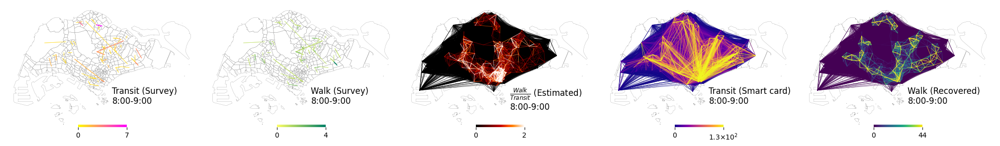

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/method_row_00_sgp_mon_wed_t08_WK.png


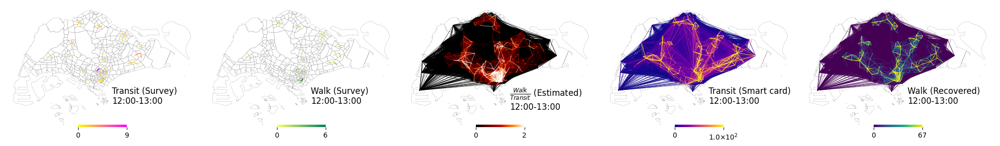

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/method_row_01_sgp_mon_wed_t12_WK.png


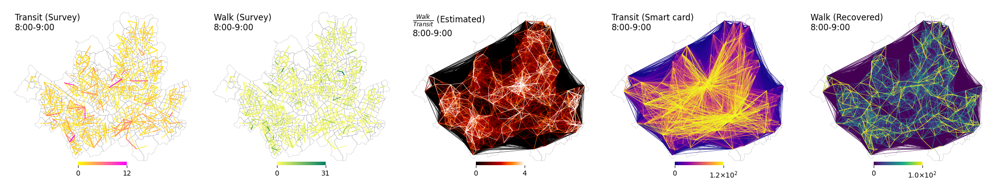

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/method_row_02_seoul_mon_wed_t08_WK.png


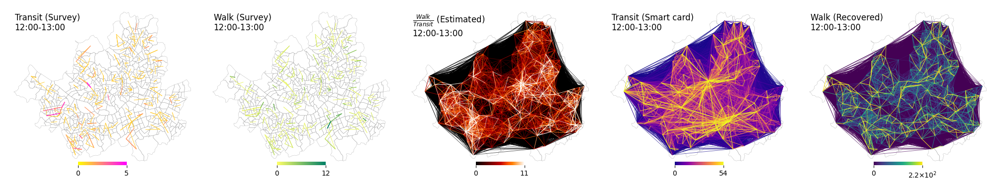

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/method_row_03_seoul_mon_wed_t12_WK.png


In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# -----------------------
# Helpers (unchanged style)
# -----------------------
def _sci_notation(val, prec=1):
    """Format number: plain if <100, else a×10^n."""
    if abs(val) < 100:
        return str(int(round(val)))
    else:
        s = f"{val:.{prec}e}"
        base, exp = s.split("e")
        exp = int(exp)
        return rf"{base}×10$^{exp}$"

def _as_float(x):
    """Force scalar float even if x is array-like (e.g., shape (2,))."""
    if isinstance(x, (list, tuple, np.ndarray)):
        return float(np.ravel(x)[0])
    return float(x)


# -----------------------
# Plot into an axis (grid-ready)
# -----------------------
def plot_OD_subzone_inter_ax(
    reg,
    ax,
    dfz,
    att,
    mode,
    week_day,
    time,
    color_map,
    max_prob=None,
    gdf=None,   # pass subzone polygons once per city
):
    """
    Inter-zone flows with a continuous colormap, drawn into provided ax.
    Keeps your original text + colorbar style (no extra annotations).
    """
    df = dfz.copy()
    df_plot = df.sort_values(att, ascending=True)

    # vmax
    if max_prob is None:
        max_prob = df_plot[att].max()

    if mode in ['Ratio_VH', 'Ratio_WK', 'Transit (Smart card)',
                'Private (Recovered)', 'Walk (Recovered)']:
        max_prob = df_plot[att].quantile(0.995)

    norm = Normalize(vmin=0, vmax=max_prob)
    cmap = cm.get_cmap(color_map)

    ax.set_axis_off()

    # Base map
    if gdf is not None:
        gdf.plot(ax=ax, color='none', edgecolor='gray', linewidth=0.2)

    # Curves
    for _, row in df_plot.iterrows():
        x0 = _as_float(row['ORIGIN_SUBZONE_X'])
        y0 = _as_float(row['ORIGIN_SUBZONE_Y'])
        x1 = _as_float(row['DESTINATION_SUBZONE_X'])
        y1 = _as_float(row['DESTINATION_SUBZONE_Y'])

        ctrl_x, ctrl_y = (x0 + x1) / 2.0, (y0 + y1) / 2.0
        t = np.linspace(0, 1, 50)
        xs = (1 - t)**3 * x0 + 3*(1 - t)**2*t*ctrl_x + 3*(1 - t)*t**2*ctrl_x + t**3 * x1
        ys = (1 - t)**3 * y0 + 3*(1 - t)**2*t*ctrl_y + 3*(1 - t)*t**2*ctrl_y + t**3 * y1
        ax.plot(xs, ys, color=cmap(norm(row[att])), linewidth=0.6, alpha=0.7)

    ttime = f'{time}:00-{time+1}:00'

    modde = mode
    if mode == 'Ratio_VH':
        modde = r'$\frac{Private}{Transit}$ (Estimated)'
    elif mode == 'Ratio_WK':
        modde = r'$\frac{Walk}{Transit}$ (Estimated)'

    txx = 0.05
    tyy = 0.95
    if reg == 'sgp':
        txx = 0.55
        tyy = 0.35

    # Keep original text
    ax.text(
        txx, tyy, f'{modde}\n{ttime}', fontsize=12,
        transform=ax.transAxes,
        verticalalignment='top'
    )

    # Colorbar inside the map (same as original)
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cax = inset_axes(ax, width="25%", height="2%", loc='lower center', borderpad=0.5)
    cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
    cbar.set_ticks([0, max_prob])
    cbar.set_ticklabels(["0", _sci_notation(max_prob, prec=1)])
    for spine in cbar.ax.spines.values():
        spine.set_visible(False)


# =======================
# YOUR SETTINGS (kept)
# =======================
color_map1 = 'spring_r'
color_map2 = 'summer_r'
color_map3 = 'gist_heat'
color_map4 = 'plasma'
color_map5 = 'viridis'

eps = 1e-9
week_day = 'mon_wed'
wk_threshold = 3.5
clip_ratio = 5
k = 1.0

# Change mode between WK and VH
mode = 'WK'  #'WK' or 'VH'

att_subzone = ['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME']

fig_x = 4
fig_y = 4

modee = 'Private'
if mode == 'WK':
    modee = 'Walk'


# =======================
# GRID SETUP (but save EACH ROW as its own figure)
# =======================
times = [8, 12]
regs = ['sgp', 'seoul']               # 2 cities
n_cols = 5                            # 5 panels per row


# =======================
# MAIN LOOP (one row = one figure)
# =======================
row = 0
for reg in regs:

    # Base polygons once per city
    gdf = gpd.read_file(path_od_data + f'data_{reg}_subzone.shp')

    # Centroids once per city
    data_subzone = gdf.copy()
    data_subzone['X'] = data_subzone.geometry.centroid.x
    data_subzone['Y'] = data_subzone.geometry.centroid.y
    data_subzone = data_subzone[['SUBZONE_C', 'X', 'Y']]

    # Load survey + generated once per city
    if reg == 'seoul':
        survey_all = pd.read_csv(path_od_data + f'data_{reg}_hts_2021_period.csv')
    else:
        survey_all = pd.read_csv(path_od_data + f'data_{reg}_hts_2022_period.csv')

    gen_all = pd.read_csv(path_od_result + f'case_{reg}_matrix_1.0_1.0_{week_day}.csv')
    # gen_all = gen_all.sample(frac=0.1, random_state=42)

    for time in times:

        # -----------------------
        # Create ONE FIGURE for this (reg, time) row
        # -----------------------
        fig_row, axes_row = plt.subplots(
            1, n_cols,
            figsize=(n_cols * fig_x, 1 * fig_y),
            constrained_layout=True
        )
        if n_cols == 1:
            axes_row = np.array([axes_row])

        survey_df = survey_all[survey_all['TRIP_STARTTIME'] == time].copy()
        gen_df    = gen_all[gen_all['TRIP_STARTTIME'] == time].copy()

        ####################### HTS #####################
        transit_df = survey_df.loc[survey_df['TRAVEL_MODE'] == 'PT', att_subzone].copy()
        transit_df['PT_COUNT'] = 1
        transit_df['PT_COUNT'] = transit_df.groupby(att_subzone)['PT_COUNT'].transform('sum')
        transit_df = transit_df[att_subzone + ['PT_COUNT']].drop_duplicates()

        other_df = survey_df.loc[survey_df['TRAVEL_MODE'] == mode, att_subzone].copy()
        other_df[f'{mode}_COUNT'] = 1
        other_df[f'{mode}_COUNT'] = other_df.groupby(att_subzone)[f'{mode}_COUNT'].transform('sum')
        other_df = other_df[att_subzone + [f'{mode}_COUNT']].drop_duplicates()

        survey_df_ = survey_df.merge(transit_df, on=att_subzone)
        survey_df_ = survey_df_.merge(other_df,   on=att_subzone)

        survey_df_['RATIO'] = survey_df_[f'{mode}_COUNT'] / (survey_df_['PT_COUNT'] + eps)

        # Prevent duplicate coord columns before merging
        for c in ["ORIGIN_SUBZONE_X","ORIGIN_SUBZONE_Y","DESTINATION_SUBZONE_X","DESTINATION_SUBZONE_Y"]:
            if c in survey_df_.columns:
                survey_df_.drop(columns=[c], inplace=True)

        # Add centroid coords to survey_df_
        survey_df_ = survey_df_.merge(data_subzone, right_on='SUBZONE_C', left_on='ORIGIN_SUBZONE', how='left')
        survey_df_.drop(columns=['SUBZONE_C'], inplace=True)
        survey_df_.rename(columns={'X': 'ORIGIN_SUBZONE_X', 'Y': 'ORIGIN_SUBZONE_Y'}, inplace=True)

        survey_df_ = survey_df_.merge(data_subzone, right_on='SUBZONE_C', left_on='DESTINATION_SUBZONE', how='left')
        survey_df_.drop(columns=['SUBZONE_C'], inplace=True)
        survey_df_.rename(columns={'X': 'DESTINATION_SUBZONE_X', 'Y': 'DESTINATION_SUBZONE_Y'}, inplace=True)

        ####################### gen #####################
        gen_df['RATIO'] = gen_df[f'{mode}_COUNT'] / (gen_df['PT_COUNT'] + eps)

        # Prevent duplicate coord columns before merging
        for c in ["ORIGIN_SUBZONE_X","ORIGIN_SUBZONE_Y","DESTINATION_SUBZONE_X","DESTINATION_SUBZONE_Y"]:
            if c in gen_df.columns:
                gen_df.drop(columns=[c], inplace=True)

        gen_df = gen_df.merge(data_subzone, right_on='SUBZONE_C', left_on='ORIGIN_SUBZONE', how='left')
        gen_df.drop(columns=['SUBZONE_C'], inplace=True)
        gen_df.rename(columns={'X': 'ORIGIN_SUBZONE_X', 'Y': 'ORIGIN_SUBZONE_Y'}, inplace=True)

        gen_df = gen_df.merge(data_subzone, right_on='SUBZONE_C', left_on='DESTINATION_SUBZONE', how='left')
        gen_df.drop(columns=['SUBZONE_C'], inplace=True)
        gen_df.rename(columns={'X': 'DESTINATION_SUBZONE_X', 'Y': 'DESTINATION_SUBZONE_Y'}, inplace=True)

        ##############################################
        # Remove intra-zone
        survey_df_ = survey_df_[survey_df_['ORIGIN_SUBZONE'] != survey_df_['DESTINATION_SUBZONE']]
        gen_df     = gen_df[gen_df['ORIGIN_SUBZONE'] != gen_df['DESTINATION_SUBZONE']]

        # Drop any rows with missing coordinates (avoid runtime issues)
        survey_df_ = survey_df_.dropna(subset=[
            "ORIGIN_SUBZONE_X","ORIGIN_SUBZONE_Y","DESTINATION_SUBZONE_X","DESTINATION_SUBZONE_Y"
        ])
        gen_df = gen_df.dropna(subset=[
            "ORIGIN_SUBZONE_X","ORIGIN_SUBZONE_Y","DESTINATION_SUBZONE_X","DESTINATION_SUBZONE_Y"
        ])

        #######################
        # Draw 5 panels into THIS row figure
        #######################
        plot_OD_subzone_inter_ax(
            reg,
            axes_row[0], survey_df_, 'PT_COUNT', 'Transit (Survey)',
            week_day, time, color_map1, gdf=gdf
        )
        plot_OD_subzone_inter_ax(
            reg,
            axes_row[1], survey_df_, f'{mode}_COUNT', f'{modee} (Survey)',
            week_day, time, color_map2, gdf=gdf
        )
        plot_OD_subzone_inter_ax(
            reg,
            axes_row[2], gen_df, 'RATIO', f'Ratio_{mode}',
            week_day, time, color_map3, gdf=gdf
        )
        plot_OD_subzone_inter_ax(
            reg,
            axes_row[3], gen_df, 'PT_COUNT', 'Transit (Smart card)',
            week_day, time, color_map4, gdf=gdf
        )
        plot_OD_subzone_inter_ax(
            reg,
            axes_row[4], gen_df, f'{mode}_COUNT', f'{modee} (Recovered)',
            week_day, time, color_map5, gdf=gdf
        )

        # -----------------------
        # Save this row as its own plot
        # -----------------------
        out_png = path_od_figure + f"method_row_{row:02d}_{reg}_{week_day}_t{time:02d}_{mode}.png"
        fig_row.savefig(out_png, dpi=130, bbox_inches="tight")
        plt.show()
        print("Saved:", out_png)

        plt.close(fig_row)
        row += 1


# Fig 3: Validation

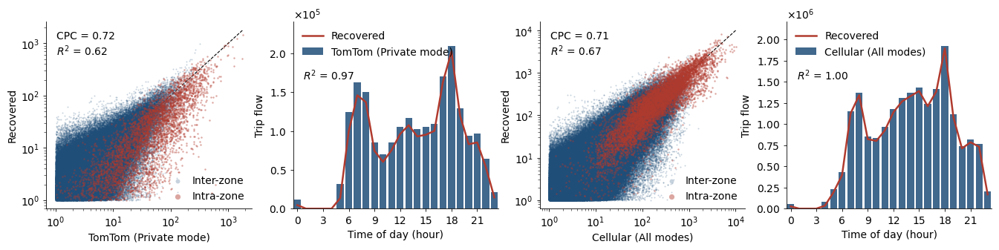

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row1_scatter_time.png


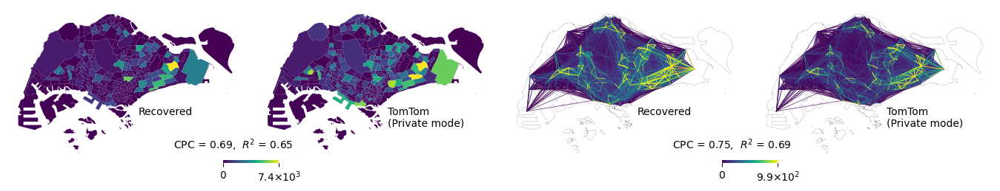

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row2_sgp_maps.png


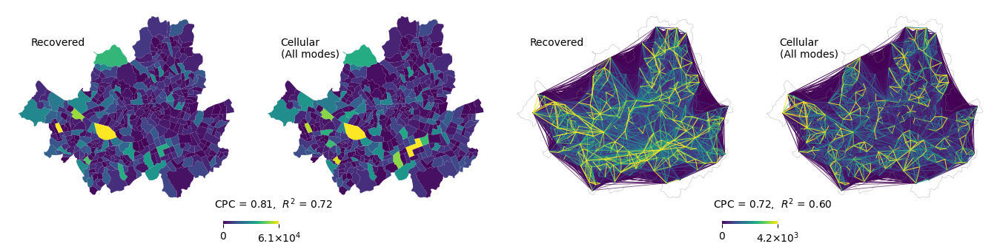

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row3_seoul_maps.png


In [ ]:
# ======================================================
# 3 separate 1×4 figures (one row per figure)
#   - Fig 1: scatter + bar (row 1)
#   - Fig 2: Singapore maps (row 2)
#   - Fig 3: Seoul maps (row 3)
# Plot settings inside each plot are unchanged (functions are copied as-is).
# ======================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as mticker
from matplotlib.colors import Normalize
from matplotlib.ticker import ScalarFormatter, MaxNLocator
from matplotlib.gridspec import GridSpecFromSubplotSpec
from sklearn.metrics import r2_score


# ======================================================
# Shared settings (Nature-friendly)
# ======================================================
COLORS = {
    "intra": "#B03A2E",   # muted brick red
    "inter": "#1F4E79",   # deep desaturated blue
}
COLOR_GT  = "#1F4E79"    # bars (ground truth)
COLOR_EST = "#B03A2E"    # line (estimated)

# Map colormap settings
color_map = "viridis"


# ======================================================
# Helpers (scatter/time)
# ======================================================
def aggregate_counts(df: pd.DataFrame, key_cols: list[str], count_col: str = "COUNT") -> pd.DataFrame:
    out = df[key_cols + [count_col]].copy()
    out[count_col] = out.groupby(key_cols)[count_col].transform("sum")
    out = out.drop_duplicates().rename(columns={count_col: "COUNT"})
    return out


def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    #out["COUNT"] = np.round(out["COUNT"])
    out = out[out["COUNT"] >= min_count].copy()
    return out


def infer_od_cols(key_cols: list[str]) -> tuple[str, str]:
    o = [c for c in key_cols if c.upper().startswith("O")][0]
    d = [c for c in key_cols if c.upper().startswith("D")][0]
    return o, d


def aggregate_time_profile_full_24h(
    df: pd.DataFrame,
    *,
    time_col: str = "TRIP_STARTTIME",
    count_col: str = "COUNT",
    hours: int = 24
) -> pd.DataFrame:
    out = df[[time_col, count_col]].copy()
    out[count_col] = out.groupby(time_col)[count_col].transform("sum")
    out = out.drop_duplicates()

    idx = pd.Index(range(hours), name=time_col)
    out = out.set_index(time_col).reindex(idx).fillna({count_col: 0.0}).reset_index()

    out[count_col] = out[count_col].astype(float)
    return out.rename(columns={time_col: "TRIP_STARTTIME", count_col: "COUNT"})


# ======================================================
# Row 1 plotters (scatter/time) — draw into provided axes
# ======================================================
def plot_od_scatter_ax(
    ax,
    pred_df: pd.DataFrame,
    true_df: pd.DataFrame,
    key_cols: list[str],
    *,
    colors: dict,
    max_val: float,
    x_label: str,
    y_label: str,
    show_legend: bool = True
):
    pred = aggregate_counts(pred_df, key_cols, count_col="COUNT")
    true = aggregate_counts(true_df, key_cols, count_col="COUNT")

    df = pred.merge(true, on=key_cols, suffixes=("_pred", "_true"))
    y_pred = df["COUNT_pred"].to_numpy(float)
    y_true = df["COUNT_true"].to_numpy(float)

    o_col, d_col = infer_od_cols(key_cols)
    is_intra = df[o_col].eq(df[d_col]).to_numpy(bool)

    denom = y_pred.sum() + y_true.sum()
    cpc = (2.0 * np.minimum(y_pred, y_true).sum() / denom) if denom > 0 else np.nan
    r2 = r2_score(y_true, y_pred) if len(df) > 1 else np.nan

    ax.scatter(
        y_true[~is_intra],
        y_pred[~is_intra],
        s=2,
        alpha=0.25,
        color=colors["inter"],
        linewidths=0,
        label="Inter-zone",
        zorder=1,
    )
    ax.scatter(
        y_true[is_intra],
        y_pred[is_intra],
        s=3,
        alpha=0.45,
        color=colors["intra"],
        linewidths=0,
        label="Intra-zone",
        zorder=2,
    )

    vmax = float(max_val) if max_val is not None else float(max(y_true.max(), y_pred.max()))
    ax.plot([1, vmax], [1, vmax], linestyle="--", color="black", linewidth=0.8, zorder=0)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())

    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    ax.text(
        0.05, 0.95,
        rf"CPC = {cpc:.2f}" + "\n" + rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


def plot_departure_profile_ax(
    ax,
    df_est_24h: pd.DataFrame,
    df_gt_24h: pd.DataFrame,
    *,
    y_max: float,
    gt_label: str,
    est_label: str
):
    ax.bar(
        df_gt_24h["TRIP_STARTTIME"],
        df_gt_24h["COUNT"],
        width=0.8,
        color=COLOR_GT,
        alpha=0.85,
        label=gt_label,
        zorder=1,
    )

    ax.plot(
        df_est_24h["TRIP_STARTTIME"],
        df_est_24h["COUNT"],
        color=COLOR_EST,
        linewidth=1.8,
        label=est_label,
        zorder=2,
    )

    ax.set_xlim(-0.5, 23.5)
    ax.set_ylim(0, y_max * 1.15)

    ax.set_xlabel("Time of day (hour)")
    ax.set_ylabel("Trip flow")

    y_formatter = ScalarFormatter(useMathText=True)
    y_formatter.set_scientific(True)
    y_formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(y_formatter)

    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    ax.legend(loc="upper left", frameon=False, fontsize=10)

    r2 = r2_score(df_gt_24h["COUNT"].to_numpy(float), df_est_24h["COUNT"].to_numpy(float))
    ax.text(
        0.05, 0.75,
        rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


# ======================================================
# Helpers (maps) — unchanged settings
# ======================================================
def sci_notation(val, prec=1):
    if val == 0:
        return "0"
    s = f"{val:.{prec}e}"
    base, exp = s.split("e")
    exp = int(exp)
    return rf"{base}×10$^{exp}$"


def compute_cpc_r2(true_df, pred_df, intra=True):
    if intra:
        mask_true = true_df["ORIGIN_SUBZONE"] == true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] == pred_df["DESTINATION_SUBZONE"]
    else:
        mask_true = true_df["ORIGIN_SUBZONE"] != true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] != pred_df["DESTINATION_SUBZONE"]

    t = true_df.loc[mask_true, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    p = pred_df.loc[mask_pred, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    merged = t.merge(p, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], suffixes=("_true", "_pred"))

    y_true = merged["COUNT_true"].to_numpy(float)
    y_pred = merged["COUNT_pred"].to_numpy(float)

    denom = y_true.sum() + y_pred.sum()
    cpc = (2.0 * np.minimum(y_true, y_pred).sum() / denom) if denom > 0 else 0.0

    if len(y_true) < 2 or np.allclose(y_true, y_true[0]):
        r2 = np.nan
    else:
        r2 = float(r2_score(y_true, y_pred))

    return float(cpc), float(r2)


def prepare_inter_xy(df_od, subzone_centroids):
    df = df_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    df = (
        df.merge(subzone_centroids, left_on="ORIGIN_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "ORIGIN_SUBZONE_X", "Y": "ORIGIN_SUBZONE_Y"})
    )
    df = (
        df.merge(subzone_centroids, left_on="DESTINATION_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "DESTINATION_SUBZONE_X", "Y": "DESTINATION_SUBZONE_Y"})
    )

    grp_cols = [
        "ORIGIN_SUBZONE", "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
    ]
    df["COUNT"] = df.groupby(grp_cols)["COUNT"].transform("sum")
    df = df.drop_duplicates()

    df = df.dropna(
        subset=["ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y", "COUNT"]
    )
    return df


def build_od_order_from_df(df_inter_xy):
    order_df = (
        df_inter_xy[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]]
        .sort_values("COUNT", ascending=True)
        .drop_duplicates(subset=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], keep="first")
        .reset_index(drop=True)
    )
    order_df["ORDER_IDX"] = np.arange(len(order_df), dtype=int)
    return order_df[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "ORDER_IDX"]]


def plot_intra_ax_map(ax, subzones_gdf, df_od, cmap, norm):
    ax.set_axis_off()

    intra = df_od[df_od["ORIGIN_SUBZONE"] == df_od["DESTINATION_SUBZONE"]]
    zone_sum = intra.groupby("DESTINATION_SUBZONE")["COUNT"].sum()

    gdf = subzones_gdf.copy()
    gdf["COUNT"] = gdf["SUBZONE_C"].map(zone_sum).fillna(0.0)

    gdf.plot(
        column="COUNT",
        cmap=cmap,
        norm=norm,
        ax=ax,
        edgecolor="none",
        linewidth=0,
        alpha=1.0,
        antialiased=True,
    )
    gdf.boundary.plot(ax=ax, color="none", linewidth=0.0)


def plot_inter_ax_map(ax, boundary_gdf, df_od_xy, cmap, norm, od_order=None):
    ax.set_axis_off()

    df = df_od_xy.copy()
    df = df[df["ORIGIN_SUBZONE"] != df["DESTINATION_SUBZONE"]].copy()

    if od_order is not None:
        df = (
            df.merge(od_order, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], how="inner")
              .sort_values("ORDER_IDX")
        )
    else:
        df = df.sort_values("COUNT", ascending=True)

    for _, row in df.iterrows():
        x0, y0 = row["ORIGIN_SUBZONE_X"], row["ORIGIN_SUBZONE_Y"]
        x1, y1 = row["DESTINATION_SUBZONE_X"], row["DESTINATION_SUBZONE_Y"]
        ctrl_x, ctrl_y = (x0 + x1) / 2.0, (y0 + y1) / 2.0

        t = np.linspace(0, 1, 50)
        xs = (1 - t) ** 3 * x0 + 3 * (1 - t) ** 2 * t * ctrl_x + 3 * (1 - t) * t ** 2 * ctrl_x + t ** 3 * x1
        ys = (1 - t) ** 3 * y0 + 3 * (1 - t) ** 2 * t * ctrl_y + 3 * (1 - t) * t ** 2 * ctrl_y + t ** 3 * y1

        ax.plot(xs, ys, color=cmap(norm(row["COUNT"])), linewidth=0.6, alpha=0.7, zorder=2)

    boundary_gdf.plot(ax=ax, color="none", edgecolor="gray", linewidth=0.2, zorder=3)


def aggregate_to_od_only(df_time_od: pd.DataFrame) -> pd.DataFrame:
    out = df_time_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    out["COUNT"] = out.groupby(["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"])["COUNT"].transform("sum")
    out = out.drop_duplicates()
    return out


def plot_maps_row(
    fig,
    ax_row,
    *,
    reg: str,
    week_day: str,
    pred_od: pd.DataFrame,
    true_od: pd.DataFrame,
    min_count: int,
    true_label: str,
    text_style: str  # "sgp" or "seoul"
):
    subzones = gpd.read_file(path_od_data + f"data_{reg}_subzone.shp")
    boundary = subzones.dissolve()

    centroids = subzones.copy()
    centroids["X"] = centroids.geometry.centroid.x
    centroids["Y"] = centroids.geometry.centroid.y
    centroids = centroids[["SUBZONE_C", "X", "Y"]]

    pred = pred_od.copy()
    true = true_od.copy()

    pred["COUNT"] = np.round(pred["COUNT"])
    true["COUNT"] = np.round(true["COUNT"])

    pred = pred[pred["COUNT"] >= min_count].copy()
    true = true[true["COUNT"] >= min_count].copy()

    cpc_intra, r2_intra = compute_cpc_r2(true, pred, intra=True)
    cpc_inter, r2_inter = compute_cpc_r2(true, pred, intra=False)

    pred_xy = prepare_inter_xy(pred, centroids)
    true_xy = prepare_inter_xy(true, centroids)

    pred_inter_xy = pred_xy[pred_xy["ORIGIN_SUBZONE"] != pred_xy["DESTINATION_SUBZONE"]].copy()
    true_inter_xy = true_xy[true_xy["ORIGIN_SUBZONE"] != true_xy["DESTINATION_SUBZONE"]].copy()

    keys = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"]
    common_inter = pred_inter_xy[keys].drop_duplicates().merge(
        true_inter_xy[keys].drop_duplicates(), on=keys, how="inner"
    )
    pred_inter_xy = pred_inter_xy.merge(common_inter, on=keys, how="inner")
    true_inter_xy = true_inter_xy.merge(common_inter, on=keys, how="inner")
    od_order = build_od_order_from_df(pred_inter_xy)

    intra_pred = pred[pred["ORIGIN_SUBZONE"] == pred["DESTINATION_SUBZONE"]]
    intra_true = true[true["ORIGIN_SUBZONE"] == true["DESTINATION_SUBZONE"]]
    intra_max = max(
        intra_pred["COUNT"].quantile(0.995) if len(intra_pred) else 0,
        intra_true["COUNT"].quantile(0.995) if len(intra_true) else 0,
    )
    intra_max = float(max(intra_max, 1.0))
    norm_intra = Normalize(vmin=0, vmax=intra_max)

    inter_max = max(
        pred_inter_xy["COUNT"].quantile(0.995) if len(pred_inter_xy) else 0,
        true_inter_xy["COUNT"].quantile(0.995) if len(true_inter_xy) else 0,
    )
    inter_max = float(max(inter_max, 1.0))
    norm_inter = Normalize(vmin=0, vmax=inter_max)

    cmap_obj = cm.get_cmap(color_map)

    for ax in ax_row:
        ax.set_axis_off()

    plot_intra_ax_map(ax_row[0], subzones, pred, cmap=cmap_obj, norm=norm_intra)
    plot_intra_ax_map(ax_row[1], subzones, true, cmap=cmap_obj, norm=norm_intra)
    plot_inter_ax_map(ax_row[2], boundary, pred_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)
    plot_inter_ax_map(ax_row[3], boundary, true_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)

    if text_style == "sgp":
        ax_row[0].text(0.55, 0.35, "Recovered", transform=ax_row[0].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[1].text(0.55, 0.35, "TomTom\n(Private mode)", transform=ax_row[1].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[2].text(0.55, 0.35, "Recovered", transform=ax_row[2].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[3].text(0.55, 0.35, "TomTom\n(Private mode)", transform=ax_row[3].transAxes,
                       ha="left", va="top", fontsize=10)
    else:
        ax_row[0].text(0.1, 0.85, "Recovered", transform=ax_row[0].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[1].text(0.1, 0.85, true_label, transform=ax_row[1].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[2].text(0.1, 0.85, "Recovered", transform=ax_row[2].transAxes,
                       ha="left", va="top", fontsize=10)
        ax_row[3].text(0.1, 0.85, true_label, transform=ax_row[3].transAxes,
                       ha="left", va="top", fontsize=10)

    sm_intra = cm.ScalarMappable(norm=norm_intra, cmap=cmap_obj)
    sm_intra.set_array([])
    sm_inter = cm.ScalarMappable(norm=norm_inter, cmap=cmap_obj)
    sm_inter.set_array([])

    pad_v = 0

    if text_style == "seoul":
        pad_v = 0.05

    cbar_intra = fig.colorbar(
        sm_intra, ax=[ax_row[0], ax_row[1]],
        orientation="horizontal", fraction=0.01, pad=pad_v
    )
    cbar_intra.set_ticks([0, intra_max])
    cbar_intra.set_ticklabels(["0", sci_notation(intra_max, prec=1)])
    for spine in cbar_intra.ax.spines.values():
        spine.set_visible(False)

    cbar_inter = fig.colorbar(
        sm_inter, ax=[ax_row[2], ax_row[3]],
        orientation="horizontal", fraction=0.01, pad=pad_v
    )



    cbar_inter.set_ticks([0, inter_max])
    cbar_inter.set_ticklabels(["0", sci_notation(inter_max, prec=1)])
    for spine in cbar_inter.ax.spines.values():
        spine.set_visible(False)

    txtt1 = 0.07
    txtt2 = 0.05
    if text_style == "sgp":
        txtt1 = -0.1
        txtt2 = 0.15

    ax_row[1].text(
        txtt1, txtt2,
        rf"CPC = {cpc_intra:.2f},  $R^2$ = {r2_intra:.2f}",
        transform=ax_row[1].transAxes,
        ha="center", va="top", fontsize=10
    )
    ax_row[3].text(
        txtt1, txtt2,
        rf"CPC = {cpc_inter:.2f},  $R^2$ = {r2_inter:.2f}",
        transform=ax_row[3].transAxes,
        ha="center", va="top", fontsize=10
    )


# ======================================================
# BUILD 3 SEPARATE FIGURES (one row per figure)
# ======================================================
# ---- Set your per-row spacing here ----
WSPACE_ROW1 = 0.2    # scatter/time row
WSPACE_ROW2 = 0.05   # Singapore maps row (tight)
WSPACE_ROW3 = 0.05   # Seoul maps row (tight)

# Per-row figure sizes (you can tune heights)
FIGSIZE_ROW1 = (13.4, 2.8)
FIGSIZE_ROW2 = (14, 4.2)
FIGSIZE_ROW3 = (14, 4.2)

# Margins (avoid fighting your internal layout)
ROW_FIG_LEFT   = 0.04
ROW_FIG_RIGHT  = 0.99
ROW_FIG_TOP    = 0.96
ROW_FIG_BOTTOM = 0.06


def make_row_figure(*, figsize, wspace):
    """
    Create a 1×4 row figure using a GridSpecFromSubplotSpec,
    consistent with your original nested GridSpec pattern.
    """
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(left=ROW_FIG_LEFT, right=ROW_FIG_RIGHT, top=ROW_FIG_TOP, bottom=ROW_FIG_BOTTOM)

    outer = fig.add_gridspec(nrows=1, ncols=1)
    gs = GridSpecFromSubplotSpec(1, 4, subplot_spec=outer[0], wspace=wspace)
    axes = [fig.add_subplot(gs[0, j]) for j in range(4)]
    return fig, axes


# ======================================================
# CONFIG (same as your code)
# ======================================================
KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
MIN_COUNT = 1

SGP_REGION = "sgp"
SGP_DAY_GROUP = "mon_wed"

SEOUL_REGION = "seoul"
SEOUL_DAY = "mon"


# ======================================================
# LOAD + PREP (SGP)
# ======================================================
sgp_true_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_tomtom_{SGP_DAY_GROUP}.csv")
sgp_pred_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_1.0_1.0_{SGP_DAY_GROUP}.csv")

sgp_true_raw = sgp_true_raw[KEY_COLS + ["COUNT"]].copy()
sgp_true = round_and_threshold(aggregate_counts(sgp_true_raw, KEY_COLS), min_count=MIN_COUNT)

sgp_pred_raw = sgp_pred_raw[KEY_COLS + ["VH_COUNT"]].copy()
sgp_pred_raw = sgp_pred_raw[sgp_pred_raw["VH_COUNT"] > 0].copy()
sgp_pred_raw["COUNT"] = sgp_pred_raw["VH_COUNT"]
sgp_pred = sgp_pred_raw[KEY_COLS + ["COUNT"]].copy()

sgp_pred = sgp_pred.merge(sgp_true[KEY_COLS].drop_duplicates(), on=KEY_COLS, how="inner")
sgp_pred = round_and_threshold(aggregate_counts(sgp_pred, KEY_COLS), min_count=MIN_COUNT)

sgp_max_scatter = float(max(sgp_true["COUNT"].max(), sgp_pred["COUNT"].max()))
sgp_true_t = aggregate_time_profile_full_24h(sgp_true, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_pred_t = aggregate_time_profile_full_24h(sgp_pred, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_ymax = float(max(sgp_true_t["COUNT"].max(), sgp_pred_t["COUNT"].max()))


# ======================================================
# LOAD + PREP (SEOUL)
# ======================================================
seoul_true_raw = pd.read_csv(path_od_result + f"case_{SEOUL_REGION}_matrix_cellular.csv")
seoul_pred_raw = pd.read_csv(path_od_result + f"case_{SEOUL_REGION}_matrix_1.0_1.0_{SEOUL_DAY}.csv")

seoul_true_raw = seoul_true_raw[KEY_COLS + ["COUNT"]].copy()
seoul_pred_raw = seoul_pred_raw[KEY_COLS + ["COUNT"]].copy()

seoul_true = round_and_threshold(aggregate_counts(seoul_true_raw, KEY_COLS), min_count=MIN_COUNT)
seoul_pred = round_and_threshold(aggregate_counts(seoul_pred_raw, KEY_COLS), min_count=MIN_COUNT)

seoul_max_scatter = float(max(seoul_true["COUNT"].max(), seoul_pred["COUNT"].max()))
seoul_true_t = aggregate_time_profile_full_24h(seoul_true, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
seoul_pred_t = aggregate_time_profile_full_24h(seoul_pred, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
seoul_ymax = float(max(seoul_true_t["COUNT"].max(), seoul_pred_t["COUNT"].max()))


# ======================================================
# OD-only for maps
# ======================================================
sgp_true_od = aggregate_to_od_only(sgp_true)
sgp_pred_od = aggregate_to_od_only(sgp_pred)

seoul_true_od = aggregate_to_od_only(seoul_true)
seoul_pred_od = aggregate_to_od_only(seoul_pred)


# ======================================================
# FIG 1 (Row 1): scatter + time (1×4)
# ======================================================
fig1, axes_row1 = make_row_figure(figsize=FIGSIZE_ROW1, wspace=WSPACE_ROW1)

plot_od_scatter_ax(
    axes_row1[0],
    pred_df=sgp_pred,
    true_df=sgp_true,
    key_cols=KEY_COLS,
    colors=COLORS,
    max_val=sgp_max_scatter,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    show_legend=True,
)
plot_departure_profile_ax(
    axes_row1[1],
    df_est_24h=sgp_pred_t,
    df_gt_24h=sgp_true_t,
    y_max=sgp_ymax,
    gt_label="TomTom (Private mode)",
    est_label="Recovered",
)
plot_od_scatter_ax(
    axes_row1[2],
    pred_df=seoul_pred,
    true_df=seoul_true,
    key_cols=KEY_COLS,
    colors=COLORS,
    max_val=seoul_max_scatter,
    x_label="Cellular (All modes)",
    y_label="Recovered",
    show_legend=True,
)
plot_departure_profile_ax(
    axes_row1[3],
    df_est_24h=seoul_pred_t,
    df_gt_24h=seoul_true_t,
    y_max=seoul_ymax,
    gt_label="Cellular (All modes)",
    est_label="Recovered",
)

out_file_row1 = path_od_figure + "case_validation_row1_scatter_time.png"
fig1.savefig(out_file_row1, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", out_file_row1)


# ======================================================
# FIG 2 (Row 2): Singapore maps (1×4)
# ======================================================
fig2, axes_row2 = make_row_figure(figsize=FIGSIZE_ROW2, wspace=WSPACE_ROW2)

plot_maps_row(
    fig2,
    axes_row2,
    reg=SGP_REGION,
    week_day=SGP_DAY_GROUP,
    pred_od=sgp_pred_od,
    true_od=sgp_true_od,
    min_count=MIN_COUNT,
    true_label="TomTom\n(Private mode)",
    text_style="sgp",
)

out_file_row2 = path_od_figure + "case_validation_row2_sgp_maps.png"
fig2.savefig(out_file_row2, dpi=180, bbox_inches="tight")
plt.show()
print("Saved:", out_file_row2)


# ======================================================
# FIG 3 (Row 3): Seoul maps (1×4)
# ======================================================
fig3, axes_row3 = make_row_figure(figsize=FIGSIZE_ROW3, wspace=WSPACE_ROW3)

plot_maps_row(
    fig3,
    axes_row3,
    reg=SEOUL_REGION,
    week_day=SEOUL_DAY,
    pred_od=seoul_pred_od,
    true_od=seoul_true_od,
    min_count=MIN_COUNT,
    true_label="Cellular\n(All modes)",
    text_style="seoul",
)

out_file_row3 = path_od_figure + "case_validation_row3_seoul_maps.png"
fig3.savefig(out_file_row3, dpi=180, bbox_inches="tight")
plt.show()
print("Saved:", out_file_row3)


# SFig: Multiday validation

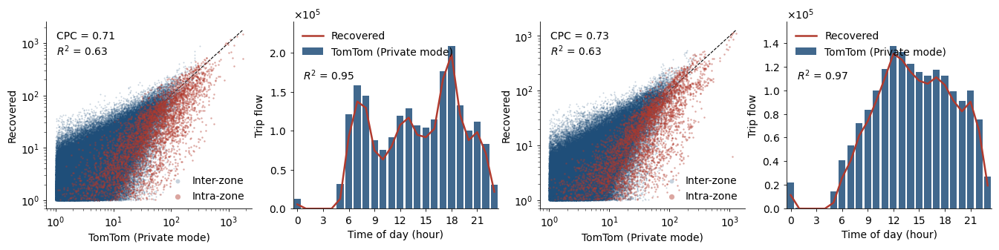

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row1_scatter_time_sgp_thu_fri_sat_sun.png


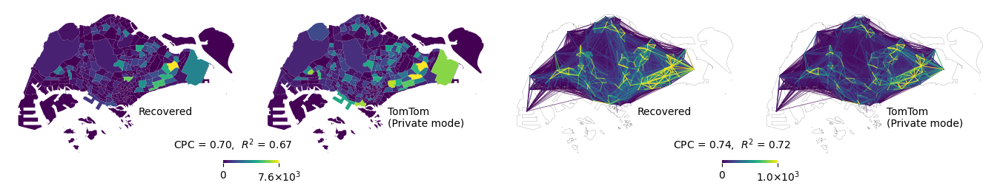

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row2_sgp_maps_thu_fri.png


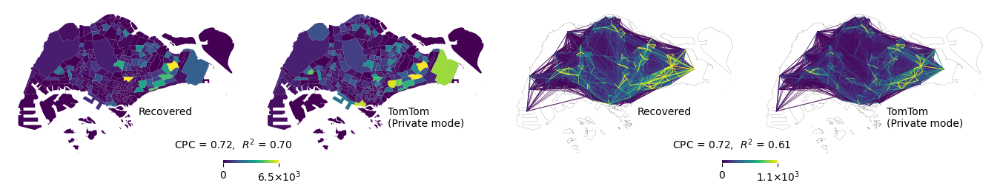

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_row3_sgp_maps_sat_sun.png


In [ ]:
# ======================================================
# Convert 3×4 (Singapore only) -> 3 separate 1×4 figures
#
# Fig 1: Row 1 (scatter+time): [thu_fri scatter, thu_fri time, sat_sun scatter, sat_sun time]
# Fig 2: Row 2 (thu_fri maps): 4 panels
# Fig 3: Row 3 (sat_sun maps): 4 panels
#
# Uses the "learned" row layout settings:
#   - Row margins: left=0.04 right=0.99 top=0.96 bottom=0.06
#   - Row1: figsize=(13.4, 2.8), wspace=0.2
#   - Row2: figsize=(14.0, 4.2), wspace=0.05
#   - Row3: figsize=(14.0, 4.2), wspace=0.05
#
# Plot settings inside each plot are unchanged.
# ======================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as mticker
from matplotlib.colors import Normalize
from matplotlib.ticker import ScalarFormatter, MaxNLocator
from matplotlib.gridspec import GridSpecFromSubplotSpec
from sklearn.metrics import r2_score


# ======================================================
# Shared settings (Nature-friendly)
# ======================================================
COLORS = {
    "intra": "#B03A2E",   # muted brick red
    "inter": "#1F4E79",   # deep desaturated blue
}
COLOR_GT  = "#1F4E79"    # bars (ground truth)
COLOR_EST = "#B03A2E"    # line (estimated)

# Map colormap settings
color_map = "viridis"


# ======================================================
# Helpers (scatter/time)
# ======================================================
def aggregate_counts(df: pd.DataFrame, key_cols: list[str], count_col: str = "COUNT") -> pd.DataFrame:
    out = df[key_cols + [count_col]]
    out[count_col] = out.groupby(key_cols, sort=False)[count_col].transform("sum")
    out = out.drop_duplicates().rename(columns={count_col: "COUNT"})
    return out


def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    #out["COUNT"] = np.round(out["COUNT"])
    out = out[out["COUNT"] >= min_count].copy()
    return out


def infer_od_cols(key_cols: list[str]) -> tuple[str, str]:
    o = [c for c in key_cols if c.upper().startswith("O")][0]
    d = [c for c in key_cols if c.upper().startswith("D")][0]
    return o, d


def aggregate_time_profile_full_24h(
    df: pd.DataFrame,
    *,
    time_col: str = "TRIP_STARTTIME",
    count_col: str = "COUNT",
    hours: int = 24
) -> pd.DataFrame:
    out = df[[time_col, count_col]]
    out[count_col] = out.groupby(time_col, sort=False)[count_col].transform("sum")
    out = out.drop_duplicates()

    idx = pd.Index(range(hours), name=time_col)
    out = out.set_index(time_col).reindex(idx).fillna({count_col: 0.0}).reset_index()

    out[count_col] = out[count_col].astype(float)
    return out.rename(columns={time_col: "TRIP_STARTTIME", count_col: "COUNT"})


# ======================================================
# Row 1 plotters (scatter/time) — draw into provided axes
# ======================================================
def plot_od_scatter_ax(
    ax,
    pred_df: pd.DataFrame,
    true_df: pd.DataFrame,
    key_cols: list[str],
    *,
    colors: dict,
    max_val: float,
    x_label: str,
    y_label: str,
    show_legend: bool = True
):
    pred = aggregate_counts(pred_df, key_cols, count_col="COUNT")
    true = aggregate_counts(true_df, key_cols, count_col="COUNT")

    df = pred.merge(true, on=key_cols, suffixes=("_pred", "_true"))
    y_pred = df["COUNT_pred"].to_numpy(float)
    y_true = df["COUNT_true"].to_numpy(float)

    o_col, d_col = infer_od_cols(key_cols)
    is_intra = df[o_col].eq(df[d_col]).to_numpy(bool)

    denom = y_pred.sum() + y_true.sum()
    cpc = (2.0 * np.minimum(y_pred, y_true).sum() / denom) if denom > 0 else np.nan
    r2 = r2_score(y_true, y_pred) if len(df) > 1 else np.nan

    ax.scatter(
        y_true[~is_intra],
        y_pred[~is_intra],
        s=2,
        alpha=0.25,
        color=colors["inter"],
        linewidths=0,
        label="Inter-zone",
        zorder=1,
    )
    ax.scatter(
        y_true[is_intra],
        y_pred[is_intra],
        s=3,
        alpha=0.45,
        color=colors["intra"],
        linewidths=0,
        label="Intra-zone",
        zorder=2,
    )

    vmax = float(max_val) if max_val is not None else float(max(y_true.max(), y_pred.max()))
    ax.plot([1, vmax], [1, vmax], linestyle="--", color="black", linewidth=0.8, zorder=0)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())

    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    ax.text(
        0.05, 0.95,
        rf"CPC = {cpc:.2f}" + "\n" + rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


def plot_departure_profile_ax(
    ax,
    df_est_24h: pd.DataFrame,
    df_gt_24h: pd.DataFrame,
    *,
    y_max: float,
    gt_label: str,
    est_label: str
):
    ax.bar(
        df_gt_24h["TRIP_STARTTIME"],
        df_gt_24h["COUNT"],
        width=0.8,
        color=COLOR_GT,
        alpha=0.85,
        label=gt_label,
        zorder=1,
    )

    ax.plot(
        df_est_24h["TRIP_STARTTIME"],
        df_est_24h["COUNT"],
        color=COLOR_EST,
        linewidth=1.8,
        label=est_label,
        zorder=2,
    )

    ax.set_xlim(-0.5, 23.5)
    ax.set_ylim(0, y_max * 1.15)

    ax.set_xlabel("Time of day (hour)")
    ax.set_ylabel("Trip flow")

    y_formatter = ScalarFormatter(useMathText=True)
    y_formatter.set_scientific(True)
    y_formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(y_formatter)

    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    ax.legend(loc="upper left", frameon=False, fontsize=10)

    r2 = r2_score(df_gt_24h["COUNT"].to_numpy(float), df_est_24h["COUNT"].to_numpy(float))
    ax.text(
        0.05, 0.75,
        rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


# ======================================================
# Helpers (maps) — unchanged settings
# ======================================================
def sci_notation(val, prec=1):
    if val == 0:
        return "0"
    s = f"{val:.{prec}e}"
    base, exp = s.split("e")
    exp = int(exp)
    return rf"{base}×10$^{exp}$"


def compute_cpc_r2(true_df, pred_df, intra=True):
    if intra:
        mask_true = true_df["ORIGIN_SUBZONE"] == true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] == pred_df["DESTINATION_SUBZONE"]
    else:
        mask_true = true_df["ORIGIN_SUBZONE"] != true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] != pred_df["DESTINATION_SUBZONE"]

    t = true_df.loc[mask_true, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    p = pred_df.loc[mask_pred, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    merged = (
        t.merge(p, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], how="outer", suffixes=("_true", "_pred"))
         .fillna(0.0)
    )

    y_true = merged["COUNT_true"].to_numpy(float)
    y_pred = merged["COUNT_pred"].to_numpy(float)

    denom = y_true.sum() + y_pred.sum()
    cpc = (2.0 * np.minimum(y_true, y_pred).sum() / denom) if denom > 0 else 0.0

    if len(y_true) < 2 or np.allclose(y_true, y_true[0]):
        r2 = np.nan
    else:
        r2 = float(r2_score(y_true, y_pred))

    return float(cpc), float(r2)


def prepare_inter_xy(df_od, subzone_centroids):
    df = df_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    df = (
        df.merge(subzone_centroids, left_on="ORIGIN_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "ORIGIN_SUBZONE_X", "Y": "ORIGIN_SUBZONE_Y"})
    )
    df = (
        df.merge(subzone_centroids, left_on="DESTINATION_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "DESTINATION_SUBZONE_X", "Y": "DESTINATION_SUBZONE_Y"})
    )

    grp_cols = [
        "ORIGIN_SUBZONE", "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
    ]
    df["COUNT"] = df.groupby(grp_cols, sort=False)["COUNT"].transform("sum")
    df = df.drop_duplicates()

    df = df.dropna(
        subset=["ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y", "COUNT"]
    )
    return df


def build_od_order_from_df(df_inter_xy):
    order_df = (
        df_inter_xy[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]]
        .sort_values("COUNT", ascending=True)
        .drop_duplicates(subset=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], keep="first")
        .reset_index(drop=True)
    )
    order_df["ORDER_IDX"] = np.arange(len(order_df), dtype=int)
    return order_df[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "ORDER_IDX"]]


def plot_intra_ax_map(ax, subzones_gdf, df_od, cmap, norm):
    ax.set_axis_off()

    intra = df_od[df_od["ORIGIN_SUBZONE"] == df_od["DESTINATION_SUBZONE"]]
    zone_sum = intra.groupby("DESTINATION_SUBZONE")["COUNT"].sum()

    gdf = subzones_gdf.copy()
    gdf["COUNT"] = gdf["SUBZONE_C"].map(zone_sum).fillna(0.0)

    gdf.plot(
        column="COUNT",
        cmap=cmap,
        norm=norm,
        ax=ax,
        edgecolor="none",
        linewidth=0,
        alpha=1.0,
        antialiased=True,
    )
    gdf.boundary.plot(ax=ax, color="none", linewidth=0.0)


def plot_inter_ax_map(ax, boundary_gdf, df_od_xy, cmap, norm, od_order=None):
    ax.set_axis_off()

    df = df_od_xy.copy()
    df = df[df["ORIGIN_SUBZONE"] != df["DESTINATION_SUBZONE"]].copy()

    if od_order is not None:
        df = (
            df.merge(od_order, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], how="inner")
              .sort_values("ORDER_IDX")
        )
    else:
        df = df.sort_values("COUNT", ascending=True)

    for _, row in df.iterrows():
        x0, y0 = row["ORIGIN_SUBZONE_X"], row["ORIGIN_SUBZONE_Y"]
        x1, y1 = row["DESTINATION_SUBZONE_X"], row["DESTINATION_SUBZONE_Y"]
        ctrl_x, ctrl_y = (x0 + x1) / 2.0, (y0 + y1) / 2.0

        t = np.linspace(0, 1, 50)
        xs = (1 - t) ** 3 * x0 + 3 * (1 - t) ** 2 * t * ctrl_x + 3 * (1 - t) * t ** 2 * ctrl_x + t ** 3 * x1
        ys = (1 - t) ** 3 * y0 + 3 * (1 - t) ** 2 * t * ctrl_y + 3 * (1 - t) * t ** 2 * ctrl_y + t ** 3 * y1

        ax.plot(xs, ys, color=cmap(norm(row["COUNT"])), linewidth=0.6, alpha=0.7, zorder=2)

    boundary_gdf.plot(ax=ax, color="none", edgecolor="gray", linewidth=0.2, zorder=3)


def aggregate_to_od_only(df_time_od: pd.DataFrame) -> pd.DataFrame:
    out = df_time_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    out["COUNT"] = out.groupby(["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], sort=False)["COUNT"].transform("sum")
    out = out.drop_duplicates()
    return out


def plot_maps_row(
    fig,
    ax_row,
    *,
    reg: str,
    week_day: str,
    pred_od: pd.DataFrame,
    true_od: pd.DataFrame,
    min_count: int,
    true_label: str,
    text_style: str  # "sgp"
):
    subzones = gpd.read_file(path_od_data + f"data_{reg}_subzone.shp")
    boundary = subzones.dissolve()

    centroids = subzones.copy()
    centroids["X"] = centroids.geometry.centroid.x
    centroids["Y"] = centroids.geometry.centroid.y
    centroids = centroids[["SUBZONE_C", "X", "Y"]]

    pred = pred_od.copy()
    true = true_od.copy()

    pred["COUNT"] = np.round(pred["COUNT"])
    true["COUNT"] = np.round(true["COUNT"])

    pred = pred[pred["COUNT"] >= min_count].copy()
    true = true[true["COUNT"] >= min_count].copy()

    cpc_intra, r2_intra = compute_cpc_r2(true, pred, intra=True)
    cpc_inter, r2_inter = compute_cpc_r2(true, pred, intra=False)

    pred_xy = prepare_inter_xy(pred, centroids)
    true_xy = prepare_inter_xy(true, centroids)

    pred_inter_xy = pred_xy[pred_xy["ORIGIN_SUBZONE"] != pred_xy["DESTINATION_SUBZONE"]].copy()
    true_inter_xy = true_xy[true_xy["ORIGIN_SUBZONE"] != true_xy["DESTINATION_SUBZONE"]].copy()

    keys = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"]
    common_inter = pred_inter_xy[keys].drop_duplicates().merge(
        true_inter_xy[keys].drop_duplicates(), on=keys, how="inner"
    )
    pred_inter_xy = pred_inter_xy.merge(common_inter, on=keys, how="inner")
    true_inter_xy = true_inter_xy.merge(common_inter, on=keys, how="inner")
    od_order = build_od_order_from_df(pred_inter_xy)

    intra_pred = pred[pred["ORIGIN_SUBZONE"] == pred["DESTINATION_SUBZONE"]]
    intra_true = true[true["ORIGIN_SUBZONE"] == true["DESTINATION_SUBZONE"]]
    intra_max = max(
        intra_pred["COUNT"].quantile(0.995) if len(intra_pred) else 0,
        intra_true["COUNT"].quantile(0.995) if len(intra_true) else 0,
    )
    intra_max = float(max(intra_max, 1.0))
    norm_intra = Normalize(vmin=0, vmax=intra_max)

    inter_max = max(
        pred_inter_xy["COUNT"].quantile(0.995) if len(pred_inter_xy) else 0,
        true_inter_xy["COUNT"].quantile(0.995) if len(true_inter_xy) else 0,
    )
    inter_max = float(max(inter_max, 1.0))
    norm_inter = Normalize(vmin=0, vmax=inter_max)

    cmap_obj = cm.get_cmap(color_map)

    for ax in ax_row:
        ax.set_axis_off()

    plot_intra_ax_map(ax_row[0], subzones, pred, cmap=cmap_obj, norm=norm_intra)
    plot_intra_ax_map(ax_row[1], subzones, true, cmap=cmap_obj, norm=norm_intra)
    plot_inter_ax_map(ax_row[2], boundary, pred_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)
    plot_inter_ax_map(ax_row[3], boundary, true_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)

    # SGP placements (learned)
    ax_row[0].text(0.55, 0.35, "Recovered", transform=ax_row[0].transAxes,
                   ha="left", va="top", fontsize=10)
    ax_row[1].text(0.55, 0.35, true_label, transform=ax_row[1].transAxes,
                   ha="left", va="top", fontsize=10)
    ax_row[2].text(0.55, 0.35, "Recovered", transform=ax_row[2].transAxes,
                   ha="left", va="top", fontsize=10)
    ax_row[3].text(0.55, 0.35, true_label, transform=ax_row[3].transAxes,
                   ha="left", va="top", fontsize=10)

    sm_intra = cm.ScalarMappable(norm=norm_intra, cmap=cmap_obj)
    sm_intra.set_array([])
    sm_inter = cm.ScalarMappable(norm=norm_inter, cmap=cmap_obj)
    sm_inter.set_array([])

    # IMPORTANT: use learned SGP pad=0.0 (not 0.10)
    pad_v = 0.0

    cbar_intra = fig.colorbar(
        sm_intra, ax=[ax_row[0], ax_row[1]],
        orientation="horizontal", fraction=0.01, pad=pad_v
    )
    cbar_intra.set_ticks([0, intra_max])
    cbar_intra.set_ticklabels(["0", sci_notation(intra_max, prec=1)])
    for spine in cbar_intra.ax.spines.values():
        spine.set_visible(False)

    cbar_inter = fig.colorbar(
        sm_inter, ax=[ax_row[2], ax_row[3]],
        orientation="horizontal", fraction=0.01, pad=pad_v
    )
    cbar_inter.set_ticks([0, inter_max])
    cbar_inter.set_ticklabels(["0", sci_notation(inter_max, prec=1)])
    for spine in cbar_inter.ax.spines.values():
        spine.set_visible(False)

    # IMPORTANT: use learned SGP CPC/R2 placement (-0.10, 0.15)
    ax_row[1].text(
        -0.10, 0.15,
        rf"CPC = {cpc_intra:.2f},  $R^2$ = {r2_intra:.2f}",
        transform=ax_row[1].transAxes,
        ha="center", va="top", fontsize=10
    )
    ax_row[3].text(
        -0.10, 0.15,
        rf"CPC = {cpc_inter:.2f},  $R^2$ = {r2_inter:.2f}",
        transform=ax_row[3].transAxes,
        ha="center", va="top", fontsize=10
    )


# ======================================================
# LEARNED LAYOUT SETTINGS (from your previous style)
# ======================================================
LAYOUT = {
    "margins": dict(left=0.04, right=0.99, top=0.96, bottom=0.06),
    "row1": dict(figsize=(13.4, 2.8), wspace=0.2),
    "row2": dict(figsize=(14.0, 4.2), wspace=0.05),
    "row3": dict(figsize=(14.0, 4.2), wspace=0.05),
}

def make_row_figure(row_key: str):
    cfg = LAYOUT[row_key]
    fig = plt.figure(figsize=cfg["figsize"])
    fig.subplots_adjust(**LAYOUT["margins"])
    outer = fig.add_gridspec(nrows=1, ncols=1)
    gs = GridSpecFromSubplotSpec(1, 4, subplot_spec=outer[0], wspace=cfg["wspace"])
    axes = [fig.add_subplot(gs[0, j]) for j in range(4)]
    return fig, axes


# ======================================================
# CONFIG (same as your code)
# ======================================================
KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
MIN_COUNT = 1

SGP_REGION = "sgp"
SGP_DAY_TF = "thu_fri"
SGP_DAY_SS = "sat_sun"


# ======================================================
# LOAD + PREP (SGP thu_fri)
# ======================================================
sgp_tf_true_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_tomtom_{SGP_DAY_TF}.csv")
sgp_tf_pred_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_1.0_1.0_{SGP_DAY_TF}.csv")

#sgp_tf_true_raw = sgp_tf_true_raw.sample(frac=0.1)
#sgp_tf_pred_raw = sgp_tf_pred_raw.sample(frac=0.1)

sgp_tf_true_raw = sgp_tf_true_raw[KEY_COLS + ["COUNT"]]
sgp_tf_true = round_and_threshold(aggregate_counts(sgp_tf_true_raw, KEY_COLS), min_count=MIN_COUNT)

sgp_tf_pred_raw = sgp_tf_pred_raw[KEY_COLS + ["VH_COUNT"]]
sgp_tf_pred_raw = sgp_tf_pred_raw[sgp_tf_pred_raw["VH_COUNT"] > 0].copy()
sgp_tf_pred_raw["COUNT"] = sgp_tf_pred_raw["VH_COUNT"]
sgp_tf_pred = sgp_tf_pred_raw[KEY_COLS + ["COUNT"]]

sgp_tf_pred = sgp_tf_pred.merge(sgp_tf_true[KEY_COLS].drop_duplicates(), on=KEY_COLS, how="inner")
sgp_tf_pred = round_and_threshold(aggregate_counts(sgp_tf_pred, KEY_COLS), min_count=MIN_COUNT)

sgp_tf_max_scatter = float(max(sgp_tf_true["COUNT"].max(), sgp_tf_pred["COUNT"].max()))
sgp_tf_true_t = aggregate_time_profile_full_24h(sgp_tf_true, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_tf_pred_t = aggregate_time_profile_full_24h(sgp_tf_pred, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_tf_ymax = float(max(sgp_tf_true_t["COUNT"].max(), sgp_tf_pred_t["COUNT"].max()))

sgp_tf_true_od = aggregate_to_od_only(sgp_tf_true)
sgp_tf_pred_od = aggregate_to_od_only(sgp_tf_pred)


# ======================================================
# LOAD + PREP (SGP sat_sun)
# ======================================================
sgp_ss_true_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_tomtom_{SGP_DAY_SS}.csv")
sgp_ss_pred_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_1.0_1.0_{SGP_DAY_SS}.csv")

#sgp_ss_true_raw = sgp_ss_true_raw.sample(frac=0.1)
#sgp_ss_pred_raw = sgp_ss_pred_raw.sample(frac=0.1)

sgp_ss_true_raw = sgp_ss_true_raw[KEY_COLS + ["COUNT"]]
sgp_ss_true = round_and_threshold(aggregate_counts(sgp_ss_true_raw, KEY_COLS), min_count=MIN_COUNT)

sgp_ss_pred_raw = sgp_ss_pred_raw[KEY_COLS + ["VH_COUNT"]]
sgp_ss_pred_raw = sgp_ss_pred_raw[sgp_ss_pred_raw["VH_COUNT"] > 0].copy()
sgp_ss_pred_raw["COUNT"] = sgp_ss_pred_raw["VH_COUNT"]
sgp_ss_pred = sgp_ss_pred_raw[KEY_COLS + ["COUNT"]]

sgp_ss_pred = sgp_ss_pred.merge(sgp_ss_true[KEY_COLS].drop_duplicates(), on=KEY_COLS, how="inner")
sgp_ss_pred = round_and_threshold(aggregate_counts(sgp_ss_pred, KEY_COLS), min_count=MIN_COUNT)

sgp_ss_max_scatter = float(max(sgp_ss_true["COUNT"].max(), sgp_ss_pred["COUNT"].max()))
sgp_ss_true_t = aggregate_time_profile_full_24h(sgp_ss_true, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_ss_pred_t = aggregate_time_profile_full_24h(sgp_ss_pred, time_col="TRIP_STARTTIME", count_col="COUNT", hours=24)
sgp_ss_ymax = float(max(sgp_ss_true_t["COUNT"].max(), sgp_ss_pred_t["COUNT"].max()))

sgp_ss_true_od = aggregate_to_od_only(sgp_ss_true)
sgp_ss_pred_od = aggregate_to_od_only(sgp_ss_pred)


# ======================================================
# FIG 1 (Row 1): scatter + time (1×4)
# ======================================================
fig1, axes_row1 = make_row_figure("row1")

plot_od_scatter_ax(
    axes_row1[0],
    pred_df=sgp_tf_pred,
    true_df=sgp_tf_true,
    key_cols=KEY_COLS,
    colors=COLORS,
    max_val=sgp_tf_max_scatter,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    show_legend=True,
)
plot_departure_profile_ax(
    axes_row1[1],
    df_est_24h=sgp_tf_pred_t,
    df_gt_24h=sgp_tf_true_t,
    y_max=sgp_tf_ymax,
    gt_label="TomTom (Private mode)",
    est_label="Recovered",
)
plot_od_scatter_ax(
    axes_row1[2],
    pred_df=sgp_ss_pred,
    true_df=sgp_ss_true,
    key_cols=KEY_COLS,
    colors=COLORS,
    max_val=sgp_ss_max_scatter,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    show_legend=True,
)
plot_departure_profile_ax(
    axes_row1[3],
    df_est_24h=sgp_ss_pred_t,
    df_gt_24h=sgp_ss_true_t,
    y_max=sgp_ss_ymax,
    gt_label="TomTom (Private mode)",
    est_label="Recovered",
)

out_file_row1 = path_od_figure + "case_validation_row1_scatter_time_sgp_thu_fri_sat_sun.png"
fig1.savefig(out_file_row1, dpi=180, bbox_inches="tight")
plt.show()
plt.close(fig1)
print("Saved:", out_file_row1)


# ======================================================
# FIG 2 (Row 2): Singapore maps (thu_fri) (1×4)
# ======================================================
fig2, axes_row2 = make_row_figure("row2")

plot_maps_row(
    fig2,
    axes_row2,
    reg=SGP_REGION,
    week_day=SGP_DAY_TF,
    pred_od=sgp_tf_pred_od,
    true_od=sgp_tf_true_od,
    min_count=MIN_COUNT,
    true_label="TomTom\n(Private mode)",
    text_style="sgp",
)

out_file_row2 = path_od_figure + "case_validation_row2_sgp_maps_thu_fri.png"
fig2.savefig(out_file_row2, dpi=180, bbox_inches="tight")
plt.show()
plt.close(fig2)
print("Saved:", out_file_row2)


# ======================================================
# FIG 3 (Row 3): Singapore maps (sat_sun) (1×4)
# ======================================================
fig3, axes_row3 = make_row_figure("row3")

plot_maps_row(
    fig3,
    axes_row3,
    reg=SGP_REGION,
    week_day=SGP_DAY_SS,
    pred_od=sgp_ss_pred_od,
    true_od=sgp_ss_true_od,
    min_count=MIN_COUNT,
    true_label="TomTom\n(Private mode)",
    text_style="sgp",
)

out_file_row3 = path_od_figure + "case_validation_row3_sgp_maps_sat_sun.png"
fig3.savefig(out_file_row3, dpi=180, bbox_inches="tight")
plt.show()
plt.close(fig3)
print("Saved:", out_file_row3)


#Fig 4: Multiday, multimodal application

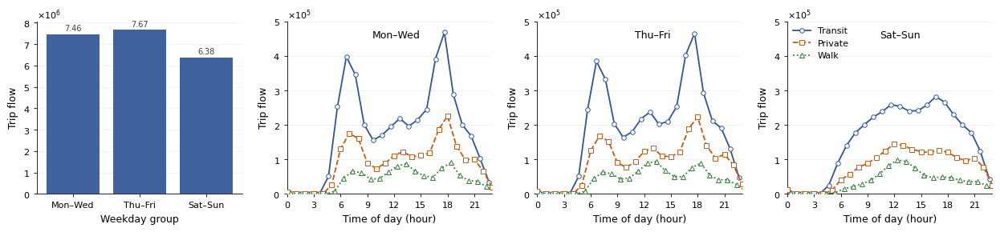

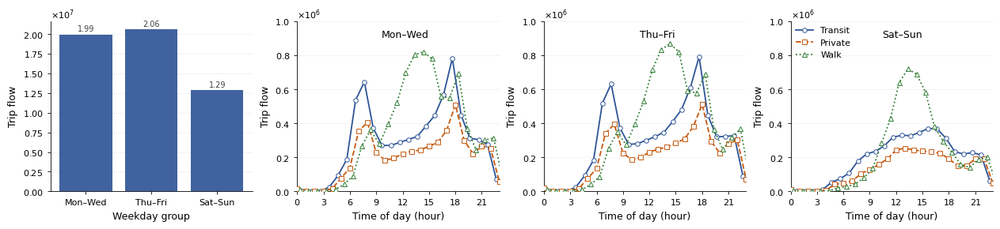

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_sgp_1x4_row_naturecomm_barfirst.png
Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_seoul_1x4_row_naturecomm_barfirst.png


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter
from matplotlib.gridspec import GridSpecFromSubplotSpec

# ============================================================
# Nature Communications-style settings (clean, quiet, print-safe)
# ============================================================
plt.rcParams.update({
    #"font.family": "DejaVu Sans",
    "font.size": 9,
    "axes.titlesize": 10,
    "axes.labelsize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "savefig.dpi": 450,
})

# Muted, Nature-like palette (colorblind-safe, not saturated)
COL_PT = "#2F5597"  # deep muted blue
COL_VH = "#C55A11"  # muted orange/brown
COL_WK = "#2E7D32"  # muted green
COL_BAR = "#2F5597" # bar uses same family (cohesive)

# ============================================================
# Helpers: aggregate
# ============================================================
def _agg_hourly_generated(result_df: pd.DataFrame) -> pd.DataFrame:
    df = result_df[["TRIP_STARTTIME", "VH_COUNT", "WK_COUNT", "PT_COUNT"]]
    df = df.groupby("TRIP_STARTTIME", as_index=False)[["VH_COUNT", "WK_COUNT", "PT_COUNT"]].sum()
    df["COUNT"] = df["VH_COUNT"] + df["WK_COUNT"] + df["PT_COUNT"]
    return df.sort_values("TRIP_STARTTIME")

def _agg_hourly_true(true_df: pd.DataFrame) -> pd.DataFrame:
    df = true_df[["TRIP_STARTTIME", "COUNT"]]
    df = df.groupby("TRIP_STARTTIME", as_index=False)["COUNT"].sum()
    return df.sort_values("TRIP_STARTTIME")

def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    #out["COUNT"] = np.round(out["COUNT"])
    #out = out[out["COUNT"] >= min_count].copy()
    return out
# ============================================================
# Formatters / styling utils
# ============================================================
def _apply_nature_axes(ax):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    for s in ["left", "bottom"]:
        ax.spines[s].set_linewidth(0.6)

    ax.grid(axis="y", linewidth=0.4, alpha=0.25)
    ax.grid(axis="x", visible=False)
    ax.tick_params(axis="both", which="major", direction="out")

def _apply_sci_y(ax):
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(formatter)

def _weekday_tag(ax, week_day, loc="right"):
    wd = {"mon_wed": "Mon–Wed", "thu_fri": "Thu–Fri", "sat_sun": "Sat–Sun"}
    if loc == "right":
        ax.text(0.65, 0.95, wd[week_day], ha="right", va="top", transform=ax.transAxes)
    else:
        ax.text(0.02, 0.95, wd[week_day], ha="left", va="top", transform=ax.transAxes)

# ============================================================
# Plotters
# ============================================================
def plot_departure_time(ax, df_gen, week_day, maxz, show_legend=False):
    x = df_gen["TRIP_STARTTIME"].values
    width = 0.35
    offsets = [-width, 0, width]

    ax.plot(
        x + offsets[0], df_gen["PT_COUNT"],
        color=COL_PT, linewidth=1.3, marker="o", markersize=4,
        markerfacecolor="white", markeredgewidth=0.7,
        label="Transit", zorder=3
    )
    ax.plot(
        x + offsets[1], df_gen["VH_COUNT"], linestyle="dashed",
        color=COL_VH, linewidth=1.3, marker="s", markersize=4,
        markerfacecolor="white", markeredgewidth=0.7,
        label="Private", zorder=3
    )
    ax.plot(
        x + offsets[2], df_gen["WK_COUNT"], linestyle="dotted",
        color=COL_WK, linewidth=1.3, marker="^", markersize=4,
        markerfacecolor="white", markeredgewidth=0.7,
        label="Walk", zorder=3
    )

    ax.set_xlim(0, 23)
    ax.set_ylim(0, maxz)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    _apply_sci_y(ax)
    _apply_nature_axes(ax)

    ax.set_xlabel("Time of day (hour)")
    ax.set_ylabel("Trip flow")
    _weekday_tag(ax, week_day, loc="right")

    if show_legend:
        ax.legend(loc="upper left", frameon=False, handlelength=2.0, borderaxespad=0.2)

def plot_daily_trips_bar(ax, trip_count: dict):
    label_map = {"mon_wed": "Mon–Wed", "thu_fri": "Thu–Fri", "sat_sun": "Sat–Sun"}
    labels = [label_map[k] for k in trip_count.keys()]
    values = list(trip_count.values())

    bars = ax.bar(labels, values, color=COL_BAR, alpha=0.92, edgecolor="none", zorder=2)

    _apply_sci_y(ax)
    _apply_nature_axes(ax)

    ax.set_ylabel("Trip flow")
    ax.set_xlabel("Weekday group")

    for bar, val in zip(bars, values):
        sci_str = f"{val:.2e}"
        base, _exp = sci_str.split("e")
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() * 1.01,
            f"{float(base):.2f}",
            ha="center",
            va="bottom",
            color="0.25",
            fontsize=7,
        )

# ============================================================
# 2 separate 1×4 figures (one row per figure)
#   Fig A: Singapore  [bar, Mon–Wed time, Thu–Fri time, Sat–Sun time]
#   Fig B: Seoul      [bar, Mon–Wed time, Thu–Fri time, Sat–Sun time]
# ============================================================
week_days = ["mon_wed", "thu_fri", "sat_sun"]

# ---- Row-specific layout settings (consistent with your style) ----
WSPACE_ROW1 = 0.22
WSPACE_ROW2 = 0.22
FIGSIZE_ROW = (4 * 3.2, 2.8)  # matches your per-row sizing intent

ROW_FIG_LEFT   = 0.06
ROW_FIG_RIGHT  = 0.99
ROW_FIG_TOP    = 0.95
ROW_FIG_BOTTOM = 0.18

def make_row_figure(figsize, wspace):
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(left=ROW_FIG_LEFT, right=ROW_FIG_RIGHT, top=ROW_FIG_TOP, bottom=ROW_FIG_BOTTOM)
    outer = fig.add_gridspec(nrows=1, ncols=1)
    gs = GridSpecFromSubplotSpec(1, 4, subplot_spec=outer[0], wspace=wspace)
    axes = [fig.add_subplot(gs[0, j]) for j in range(4)]
    return fig, axes

# ============================================================
# Singapore (Row 1 -> Figure 1)
# ============================================================
reg = "sgp"
trip_count_sgp = {}
gen_hourly_sgp = {}

for wd in week_days:
    gen_df = pd.read_csv(path_od_result + f"case_{reg}_matrix_1.0_1.0_{wd}.csv")
    gen_df = round_and_threshold(gen_df, 1)

    gen_h = _agg_hourly_generated(gen_df)
    gen_hourly_sgp[wd] = gen_h
    trip_count_sgp[wd] = float(gen_h["COUNT"].sum())

fig1, axes1 = make_row_figure(FIGSIZE_ROW, WSPACE_ROW1)

plot_daily_trips_bar(axes1[0], trip_count_sgp)

max_sgp = 5e5
plot_departure_time(axes1[1], gen_hourly_sgp["mon_wed"], "mon_wed", max_sgp, show_legend=False)
plot_departure_time(axes1[2], gen_hourly_sgp["thu_fri"], "thu_fri", max_sgp, show_legend=False)
plot_departure_time(axes1[3], gen_hourly_sgp["sat_sun"], "sat_sun", max_sgp, show_legend=True)

fname1 = "case_validation_sgp_1x4_row_naturecomm_barfirst.png"
fig1.savefig(path_od_figure + fname1, dpi=200, bbox_inches="tight")
plt.show()
plt.close(fig1)

# ============================================================
# Seoul (Row 2 -> Figure 2)
# ============================================================
reg = "seoul"
trip_count_seoul = {}
gen_hourly_seoul = {}

for wd in week_days:
    gen_df = pd.read_csv(path_od_result + f"case_{reg}_matrix_1.0_1.0_{wd}.csv")
    gen_h = _agg_hourly_generated(gen_df)
    gen_hourly_seoul[wd] = gen_h
    trip_count_seoul[wd] = float(gen_h["COUNT"].sum())

fig2, axes2 = make_row_figure(FIGSIZE_ROW, WSPACE_ROW2)

plot_daily_trips_bar(axes2[0], trip_count_seoul)

max_seoul = 1.0e6
plot_departure_time(axes2[1], gen_hourly_seoul["mon_wed"], "mon_wed", max_seoul, show_legend=False)
plot_departure_time(axes2[2], gen_hourly_seoul["thu_fri"], "thu_fri", max_seoul, show_legend=False)
plot_departure_time(axes2[3], gen_hourly_seoul["sat_sun"], "sat_sun", max_seoul, show_legend=True)

fname2 = "case_validation_seoul_1x4_row_naturecomm_barfirst.png"
fig2.savefig(path_od_figure + fname2, dpi=200, bbox_inches="tight")
plt.show()
plt.close(fig2)

print("Saved:", path_od_figure + fname1)
print("Saved:", path_od_figure + fname2)


# Fig 5: Transit competitiveness

total  7461135.953894819
total  19229372.414483853


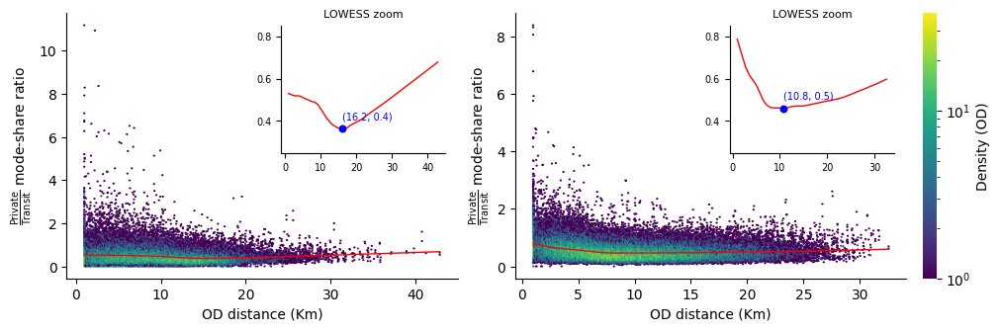

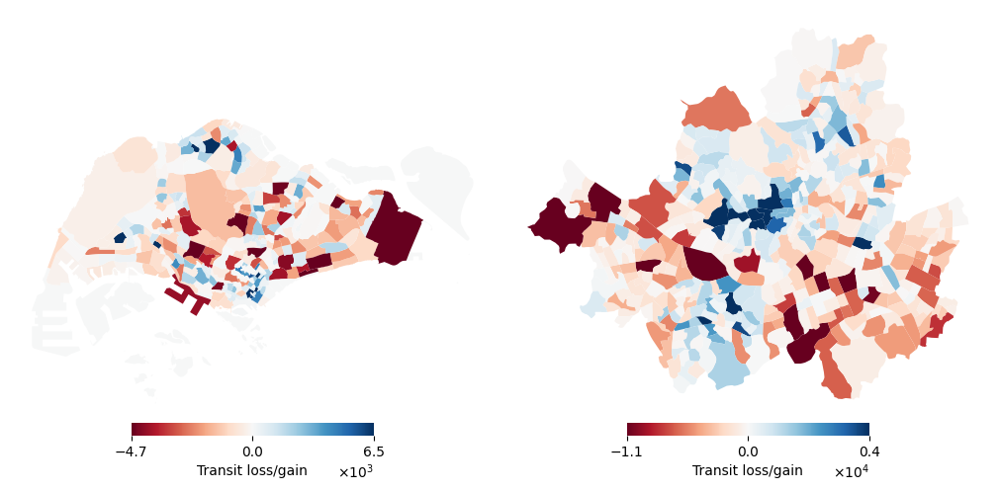

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import TwoSlopeNorm
import matplotlib.ticker as mticker
from statsmodels.nonparametric.smoothers_lowess import lowess
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# =========================================================
# Helpers
# =========================================================
def style_axes(ax):
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.tick_params(axis="both", which="major")

def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    #out["COUNT"] = np.round(out["COUNT"])
    #out = out[out["COUNT"] >= min_count].copy()
    return out

def haversine_km(lon1, lat1, lon2, lat2):
    lon1 = np.radians(lon1)
    lat1 = np.radians(lat1)
    lon2 = np.radians(lon2)
    lat2 = np.radians(lat2)
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat / 2.0) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0) ** 2
    c = 2.0 * np.arcsin(np.sqrt(a))
    return 6371.0 * c


def add_lowess_line(ax, x, y, *, label=None, frac=0.20, it=1,
                    color="cyan", lw=1.0, ls="-", zorder=6):
    x = np.asarray(x)
    y = np.asarray(y)
    m = np.isfinite(x) & np.isfinite(y)
    lo = lowess(endog=y[m], exog=x[m], frac=frac, it=it, return_sorted=True)
    ax.plot(lo[:, 0], lo[:, 1], color=color, lw=lw, ls=ls, label=label, zorder=zorder)
    return {"x": lo[:, 0], "y": lo[:, 1]}


def load_and_aggregate_od(
    *,
    csv_path: str,
    origin_col="ORIGIN_SUBZONE",
    dest_col="DESTINATION_SUBZONE",
    pt_col="PT_COUNT",
    vh_col="VH_COUNT",
    min_pt=5.0,
):
    df_raw = pd.read_csv(csv_path)
    df_raw = round_and_threshold(df_raw)

    if "COUNT" in df_raw.columns:
        print("total ", float(df_raw["COUNT"].sum()))

    needed = [origin_col, dest_col, pt_col, vh_col]
    missing = [c for c in needed if c not in df_raw.columns]
    if missing:
        raise KeyError(f"Missing columns in {csv_path}: {missing}")

    od = (
        df_raw[needed]
        .groupby([origin_col, dest_col], as_index=False)
        .sum()
    )
    od["OT_COUNT"] = od[vh_col].astype(float)
    od["COUNT"] = od[pt_col].astype(float) + od["OT_COUNT"]
    od = od[od[pt_col] >= float(min_pt)].copy()
    od["RATIO"] = od["OT_COUNT"] / od[pt_col]
    return od


def attach_centroids_and_distance(
    od_df: pd.DataFrame,
    *,
    shapefile_path: str,
    zone_id_col="SUBZONE_C",
    origin_col="ORIGIN_SUBZONE",
    dest_col="DESTINATION_SUBZONE",
    clip_lower_km=1.0,
):
    gdf = gpd.read_file(shapefile_path).copy()
    if zone_id_col not in gdf.columns:
        raise KeyError(f"'{zone_id_col}' not found in shapefile: {shapefile_path}")

    cent = gdf[[zone_id_col, "geometry"]].copy()
    cent["X"] = cent.geometry.centroid.x
    cent["Y"] = cent.geometry.centroid.y
    cent = cent[[zone_id_col, "X", "Y"]]

    out = od_df.merge(
        cent.rename(columns={zone_id_col: origin_col, "X": "Origin_X", "Y": "Origin_Y"}),
        on=origin_col, how="left",
    ).merge(
        cent.rename(columns={zone_id_col: dest_col, "X": "Destination_X", "Y": "Destination_Y"}),
        on=dest_col, how="left",
    )

    dist = haversine_km(out["Origin_X"], out["Origin_Y"], out["Destination_X"], out["Destination_Y"])
    out["DISTANCE"] = np.clip(dist, float(clip_lower_km), None)
    return out


def residuals_and_lost_trips(
    df: pd.DataFrame,
    *,
    origin_col="ORIGIN_SUBZONE",
    dest_col="DESTINATION_SUBZONE",
    ratio_col="RATIO",
    pt_col="PT_COUNT",
    ot_col="OT_COUNT",
    distance_col="DISTANCE",
    lowess_frac=0.25,
    winsor=(0.0, 1.0),
    n_bins=12,
    min_pt=1.0,
    std_floor=1e-6,
):
    df = df.copy()
    for c in [ratio_col, pt_col, ot_col, distance_col]:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    df = df.dropna(subset=[ratio_col, pt_col, ot_col, distance_col])
    df = df[(df[pt_col] >= float(min_pt)) & (df[ratio_col] > 0)].copy()

    df["MKT"] = df[pt_col] + df[ot_col]

    R = df[ratio_col].astype(float)
    qlo, qhi = float(R.quantile(winsor[0])), float(R.quantile(winsor[1]))
    R_fit = R.clip(qlo, qhi)

    mask = R_fit.notna() & df[distance_col].notna()
    lo = lowess(
        endog=R_fit.loc[mask].values,
        exog=df.loc[mask, distance_col].values,
        frac=float(lowess_frac),
        it=1,
        return_sorted=True,
    )
    x_fit, y_fit = lo[:, 0], lo[:, 1]
    df["R_HAT"] = np.interp(df[distance_col].values, x_fit, y_fit)

    df["DELTA_R"] = df[ratio_col] - df["R_HAT"]

    df["_d_bin"] = pd.qcut(df[distance_col], q=int(n_bins), duplicates="drop")
    bin_std = (
        df.groupby("_d_bin", observed=True)["DELTA_R"]
        .agg(lambda s: max(float(s.std(ddof=1)), float(std_floor)))
        .rename("BIN_STD")
    )
    df = df.merge(bin_std, left_on="_d_bin", right_index=True, how="left")
    df["ZDELTA_R"] = df["DELTA_R"] / df["BIN_STD"]
    df["W_R"] = df[pt_col] * df["ZDELTA_R"]

    df["DELTA_PT"] = df[pt_col] * (df[ratio_col] - df["R_HAT"]) / (1.0 + df["R_HAT"])
    df["LOST_PT"] = np.maximum(0.0, df["DELTA_PT"])
    df["GAINED_PT"] = np.maximum(0.0, -df["DELTA_PT"])

    origin_summary = (
        df.groupby(origin_col, as_index=False)
        .apply(lambda g: pd.Series({
            "MKT_SUM": float(g["MKT"].sum()),
            "PT_SUM": float(g[pt_col].sum()),
            "LOST_PT_SUM": float(g["LOST_PT"].sum()),
            "GAINED_PT_SUM": float(g["GAINED_PT"].sum()),
        }))
        .reset_index(drop=True)
    )

    dest_summary = (
        df.groupby(dest_col, as_index=False)
        .apply(lambda g: pd.Series({
            "MKT_SUM": float(g["MKT"].sum()),
            "PT_SUM": float(g[pt_col].sum()),
            "LOST_PT_SUM": float(g["LOST_PT"].sum()),
            "GAINED_PT_SUM": float(g["GAINED_PT"].sum()),
        }))
        .reset_index(drop=True)
    )

    df.drop(columns=["_d_bin", "BIN_STD"], inplace=True, errors="ignore")
    return df, origin_summary, dest_summary


def add_ratio_distance_panel(ax, df_od, *, cmap="plasma", lowess_frac=0.20,
                             inset=True, title=None):
    hb = ax.hexbin(
        df_od["DISTANCE"],
        df_od["RATIO"],
        gridsize=400,
        bins="log",
        cmap=cmap,
        mincnt=1,
    )
    ax.set_xlabel("OD distance (Km)")
    ax.set_ylabel(r"$\frac{\text{Private}}{\text{Transit}}$ mode-share ratio")
    if title:
        ax.set_title(title)
    style_axes(ax)

    res = add_lowess_line(
        ax,
        df_od["DISTANCE"],
        df_od["RATIO"],
        frac=lowess_frac,
        it=1,
        color="red",#"cyan",
        lw=1,
        ls="-",
    )

    if inset:
        lx, ly = res["x"], res["y"]
        idx_min = int(np.argmin(ly))
        x_min, y_min = float(lx[idx_min]), float(ly[idx_min])

        x_lo, x_hi = np.quantile(lx, [0.0, 1.0])
        y_lo, y_hi = 0.3, 0.8

        pad_x = 0.05 * (x_hi - x_lo) if x_hi > x_lo else 1.0
        pad_y = 0.10 * (y_hi - y_lo) if y_hi > y_lo else 0.1

        ax_in = inset_axes(ax, width="42%", height="48%", loc="upper right", borderpad=0.9)
        ax_in.plot(lx, ly, color="red", lw=1, ls="-")
        ax_in.scatter(x_min, y_min, color="blue", s=22, zorder=5)
        ax_in.annotate(
            f"({x_min:.1f}, {y_min:.1f})",
            xy=(x_min, y_min),
            xytext=(0, 7),
            textcoords="offset points",
            fontsize=7,
            color="blue",#"red",
        )
        ax_in.set_xlim(x_lo - pad_x, x_hi + pad_x)
        ax_in.set_ylim(y_lo - pad_y, y_hi + pad_y)
        style_axes(ax_in)
        ax_in.set_title("LOWESS zoom", fontsize=8)
        ax_in.tick_params(labelsize=7)

    return hb


def plot_netpt_map_on_ax(
    ax,
    origin_res: pd.DataFrame,
    *,
    shapefile_path: str,
    zone_id_col="SUBZONE_C",
    origin_col="ORIGIN_SUBZONE",
    net_col="NET_PT_SUM",
    cmap_name="coolwarm_r",
    q_clip=(0.02, 0.98),
    linewidth=0.0,
    edgecolor="none",
    boundary_lw=0.0,
    title=None,
):
    """
    Plot NET_PT_SUM on ax and return (sm, vmin, vmax).
    This is used to make a PER-AXIS colorbar with the original sizing.
    """
    gdf = gpd.read_file(shapefile_path)
    zone_map = origin_res.set_index(origin_col)[net_col]
    gdf = gdf.copy()
    gdf[net_col] = gdf[zone_id_col].map(zone_map).fillna(0.0).astype(float)

    s = gdf[net_col]
    qlo, qhi = float(s.quantile(q_clip[0])), float(s.quantile(q_clip[1]))
    vmin = min(0.0, qlo)
    vmax = max(0.0, qhi)
    if np.isclose(vmin, vmax):
        vmin, vmax = float(s.min()), float(s.max())
        if np.isclose(vmin, vmax):
            vmin, vmax = -1.0, 1.0

    norm = TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)

    ax.set_axis_off()
    gdf.plot(
        ax=ax,
        column=net_col,
        cmap=cmap,
        norm=norm,
        linewidth=linewidth,
        edgecolor=edgecolor,
        antialiased=True,
    )

    if boundary_lw and boundary_lw > 0:
        try:
            gdf.boundary.plot(ax=ax, color=edgecolor, linewidth=boundary_lw)
        except Exception:
            pass

    if title:
        ax.set_title(title)

    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    return sm, vmin, vmax


def run_city(
    *,
    reg: str,
    week_day: str,
    path_od_result: str,
    path_od_data: str,
    csv_template: str,
    shp_template: str,
):
    csv_path = path_od_result + csv_template.format(reg=reg, week_day=week_day)
    shp_path = path_od_data + shp_template.format(reg=reg)

    od = load_and_aggregate_od(csv_path=csv_path, min_pt=5.0)
    od = attach_centroids_and_distance(od, shapefile_path=shp_path)

    dncr_df, origin_res, _ = residuals_and_lost_trips(
        od,
        lowess_frac=0.25,
        winsor=(0.0, 1.0),
        n_bins=12,
        min_pt=1.0,
    )

    origin_res = origin_res.copy()
    origin_res["NET_PT_SUM"] = origin_res["GAINED_PT_SUM"] - origin_res["LOST_PT_SUM"]

    return {"reg": reg, "od_df": od, "origin_res": origin_res, "shp_path": shp_path, "dncr_df": dncr_df}


# =========================================================
# USER CONFIG
# =========================================================
week_day = "mon_wed"
csv_template = "case_{reg}_matrix_1.0_1.0_{week_day}.csv"
shp_template = "data_{reg}_subzone.shp"

# Scatter
scatter_cmap = "viridis"#"plasma"
scatter_lowess_frac = 0.20

# Maps (SEPARATE colormaps; you can set different ones)
map_cmap_sgp = "RdBu"# "coolwarm_r"
map_cmap_seoul = "RdBu"
map_q_clip = (0.02, 0.98)

# Keep original-like sizing: each map panel keeps its own horizontal colorbar under it
#map_figsize = (11.0, 5.5)  # same as before, but each axis gets its own colorbar sizing

# =========================================================
# Compute both cities
# =========================================================
sgp = run_city(
    reg="sgp",
    week_day=week_day,
    path_od_result=path_od_result,
    path_od_data=path_od_data,
    csv_template=csv_template,
    shp_template=shp_template,
)

seoul = run_city(
    reg="seoul",
    week_day=week_day,
    path_od_result=path_od_result,
    path_od_data=path_od_data,
    csv_template=csv_template,
    shp_template=shp_template,
)

# =========================================================
# FIGURE A: 1x2 scatter plots (shared colorbar is fine)
# =========================================================
figA, axsA = plt.subplots(1, 2, figsize=(10.0, 3.2), constrained_layout=True)

hb_sgp = add_ratio_distance_panel(
    axsA[0], sgp["od_df"], cmap=scatter_cmap, lowess_frac=scatter_lowess_frac, inset=True#, title="Singapore"
)
hb_seoul = add_ratio_distance_panel(
    axsA[1], seoul["od_df"], cmap=scatter_cmap, lowess_frac=scatter_lowess_frac, inset=True#, title="Seoul"
)

cbarA = figA.colorbar(hb_seoul, ax=axsA, label="Density (OD)", fraction=0.035, pad=0.02)
cbarA.outline.set_visible(False)

figA.savefig(path_od_figure + f"ratio_distance_scatter_1x2_{week_day}.png", dpi=220, bbox_inches="tight")
plt.show()

# =========================================================
# FIGURE B: 1x2 maps with SEPARATE colormaps + SEPARATE colorbars
# Keep colorbar size consistent with your original map function:
#   - orientation="horizontal"
#   - shrink=0.5
#   - pad=0.01
# =========================================================
figB, axsB = plt.subplots(1, 2, figsize=(10.0, 5.0), constrained_layout=True)

sm_sgp, vmin_sgp, vmax_sgp = plot_netpt_map_on_ax(
    axsB[0],
    sgp["origin_res"],
    shapefile_path=sgp["shp_path"],
    cmap_name=map_cmap_sgp,
    q_clip=map_q_clip,
    #title="Singapore (NET_PT_SUM)",
)

sm_seoul, vmin_seoul, vmax_seoul = plot_netpt_map_on_ax(
    axsB[1],
    seoul["origin_res"],
    shapefile_path=seoul["shp_path"],
    cmap_name=map_cmap_seoul,
    q_clip=map_q_clip,
    #title="Seoul (NET_PT_SUM)",
)

# Separate colorbars with the SAME sizing parameters as your original function
cbar_sgp = figB.colorbar(sm_sgp, ax=axsB[0], orientation="horizontal", shrink=0.5, pad=0.01)
cbar_sgp.set_label("Transit loss/gain")
cbar_sgp.outline.set_visible(False)
cbar_sgp.set_ticks([vmin_sgp, 0.0, vmax_sgp])

cbar_seoul = figB.colorbar(sm_seoul, ax=axsB[1], orientation="horizontal", shrink=0.5, pad=0.01)
cbar_seoul.set_label("Transit loss/gain")
cbar_seoul.outline.set_visible(False)
cbar_seoul.set_ticks([vmin_seoul, 0.0, vmax_seoul])

# Scientific formatter, per your original map function
class OneDecimalScalarFormatter(mticker.ScalarFormatter):
    def _set_format(self):
        self.format = "%.1f"

formatter = OneDecimalScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))

for cb in (cbar_sgp, cbar_seoul):
    cb.ax.xaxis.set_major_formatter(formatter)
    cb.formatter = formatter
    cb.update_ticks()

figB.savefig(path_od_figure + f"netpt_maps_1x2_sep_cbar_{week_day}.png", dpi=220, bbox_inches="tight")
plt.show()


# Fig 2: Aaptive representation learning method

## Feature significane (SHAP)


Building features: sgp | mon_wed
final_cell_feature_df shape: (440074, 17)

Running SHAP (beeswarm only) + saving plot...


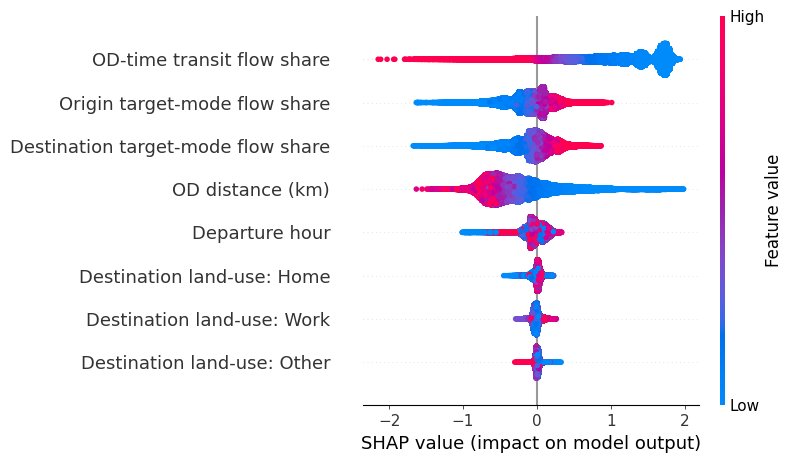

[Saved] /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/sgp_mon_wed_shap_beeswarm.png

Building features: seoul | mon
final_cell_feature_df shape: (989229, 17)

Running SHAP (beeswarm only) + saving plot...


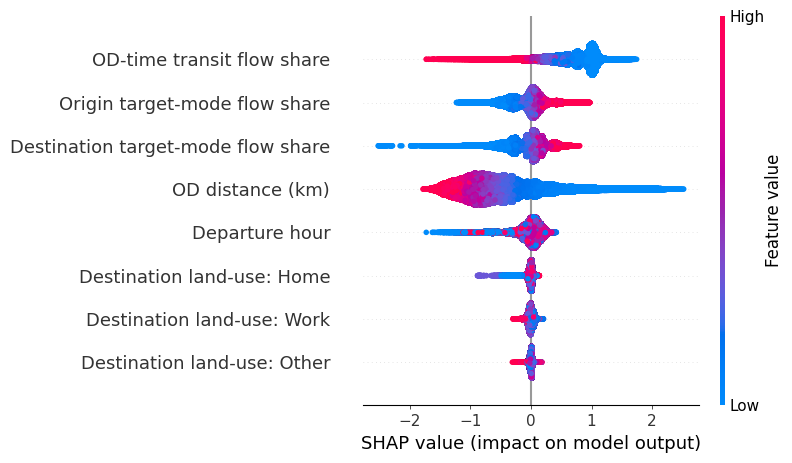

[Saved] /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/seoul_mon_shap_beeswarm.png

Feature-level SHAP importance (mean |SHAP|):

--- sgp | mon_wed ---
                   feature                      feature_label  mean_abs_shap
         OD_TRANSIT_DEMAND         OD-time transit flow share       1.153926
     ORIGIN_SUBZONE_DEMAND      Origin target-mode flow share       0.231597
DESTINATION_SUBZONE_DEMAND Destination target-mode flow share       0.220365
             TRIP_DISTANCE                   OD distance (km)       0.440831
           TRIP_STARTTIME_                     Departure hour       0.095691
                      LU_H         Destination land-use: Home       0.034335
                      LU_W         Destination land-use: Work       0.035680
                      LU_O        Destination land-use: Other       0.019457

--- seoul | mon ---
                   feature                      feature_label  mean_abs_shap
         OD_TRANSIT_

In [ ]:
# =============================================================================
# FULL PIPELINE (Singapore + Seoul) + SAVE PLOTS
#   A) Build final_cell_feature_df (cell-level OD-time features)
#   B) Train ratio model: y = log((VH+eps)/(PT+eps)) with sample_weight = PT
#   C) SAVE SHAP plots (Nature-style):
#        - Beeswarm summary (fixed feature order + custom labels)
#        - Bar importance (fixed order, matplotlib barh)
#        - Optional: save feature-importance CSV
#
# Assumptions (as in your revised code):
#   - SGP vehicle GT: TomTom COUNT -> VH_COUNT
#   - SEOUL vehicle GT: Cellular COUNT -> VH_COUNT
#   - SEOUL od_generation_df: average of three priors (VH/WK/PT)
#   - Coordinate & haversine + LU mix preserved
#
# Requirements:
#   - path_od_result, path_od_data, path_od_figure exist in your environment
#   - Input files exist and match templates used below
# =============================================================================

import os
import numpy as np
import pandas as pd
import geopandas as gpd

import shap
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from typing import Dict, List, Optional, Tuple


# =============================================================================
# Nature-style plotting defaults
# =============================================================================
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 9,
    "axes.labelsize": 9,
    "axes.titlesize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "axes.linewidth": 0.8,
    "savefig.dpi": 300,
})


# =============================================================================
# (0) Feature order + labels (authoritative)
# =============================================================================
FEATURE_ORDER: List[str] = [
    "OD_TRANSIT_DEMAND",
    "ORIGIN_SUBZONE_DEMAND",
    "DESTINATION_SUBZONE_DEMAND",
    "TRIP_DISTANCE",
    "TRIP_STARTTIME_",
    "LU_H",
    "LU_W",
    "LU_O",
]

FEATURE_NAME_MAP_SGP: Dict[str, str] = {
    "OD_TRANSIT_DEMAND": "OD-time transit flow share",
    "ORIGIN_SUBZONE_DEMAND": "Origin target-mode flow share",
    "DESTINATION_SUBZONE_DEMAND": "Destination target-mode flow share",
    "TRIP_DISTANCE": "OD distance (km)",
    "TRIP_STARTTIME_": "Departure hour",
    "LU_H": "Destination land-use: Home",
    "LU_W": "Destination land-use: Work",
    "LU_O": "Destination land-use: Other",
}

FEATURE_NAME_MAP_SEOUL: Dict[str, str] = {
    "OD_TRANSIT_DEMAND": "OD-time transit flow share",
    "ORIGIN_SUBZONE_DEMAND": "Origin target-mode flow share",
    "DESTINATION_SUBZONE_DEMAND": "Destination target-mode flow share",
    "TRIP_DISTANCE": "OD distance (km)",
    "TRIP_STARTTIME_": "Departure hour",
    "LU_H": "Destination land-use: Home",
    "LU_W": "Destination land-use: Work",
    "LU_O": "Destination land-use: Other",
}


# =============================================================================
# (1) Utilities
# =============================================================================
EARTH_RADIUS_KM = 6371.0


def destination_land_use_mix(
    hts_df: pd.DataFrame,
    *,
    dest_col: str = "DESTINATION_SUBZONE",
    purpose_col: str = "TRIP_PURPOSE",
    purposes: Tuple[str, ...] = ("H", "W", "O"),
    prefix: str = "LU",
) -> pd.DataFrame:
    """
    Destination land-use mix proxies as HTS destination-purpose shares.
    Output: [DESTINATION_SUBZONE, LU_H, LU_W, LU_O]
    """
    df = hts_df[[dest_col, purpose_col]]
    df = df[df[purpose_col].isin(purposes)].copy()

    counts = (
        df.groupby([dest_col, purpose_col], as_index=False)
          .size()
          .rename(columns={"size": "N"})
    )

    total_n = float(counts["N"].sum())
    if total_n <= 0:
        # Graceful fallback: return zeros for any seen destinations
        out = pd.DataFrame({dest_col: pd.unique(df[dest_col].dropna())})
        out[f"{prefix}_H"] = 0.0
        out[f"{prefix}_W"] = 0.0
        out[f"{prefix}_O"] = 0.0
        return out[[dest_col, f"{prefix}_H", f"{prefix}_W", f"{prefix}_O"]]

    counts["Prob"] = counts["N"] / total_n
    denom = counts.groupby(dest_col)["Prob"].transform("sum")
    counts["Prob"] = counts["Prob"] / denom

    wide = (
        counts.pivot(index=dest_col, columns=purpose_col, values="Prob")
              .fillna(0.0)
              .reset_index()
    )

    rename_map = {p: f"{prefix}_{p}" for p in purposes if p in wide.columns}
    wide.rename(columns=rename_map, inplace=True)

    # Ensure expected cols exist
    for p in purposes:
        col = f"{prefix}_{p}"
        if col not in wide.columns:
            wide[col] = 0.0

    return wide[[dest_col, f"{prefix}_H", f"{prefix}_W", f"{prefix}_O"]]


def haversine_km(df: pd.DataFrame, coord_cols: List[str]) -> np.ndarray:
    """
    Vectorized haversine distance (km).
    coord_cols: [o_lon, d_lon, o_lat, d_lat] in degrees.
    """
    o_lon = np.radians(pd.to_numeric(df[coord_cols[0]], errors="coerce").to_numpy())
    d_lon = np.radians(pd.to_numeric(df[coord_cols[1]], errors="coerce").to_numpy())
    o_lat = np.radians(pd.to_numeric(df[coord_cols[2]], errors="coerce").to_numpy())
    d_lat = np.radians(pd.to_numeric(df[coord_cols[3]], errors="coerce").to_numpy())

    dlon = d_lon - o_lon
    dlat = d_lat - o_lat
    a = np.sin(dlat / 2.0) ** 2 + np.cos(o_lat) * np.cos(d_lat) * np.sin(dlon / 2.0) ** 2
    c = 2.0 * np.arcsin(np.sqrt(a))
    return EARTH_RADIUS_KM * c


def od_transit_demand_share(
    pt_cell_df: pd.DataFrame,
    *,
    cell_keys: List[str],
    pt_count_col: str = "PT_COUNT",
) -> pd.DataFrame:
    agg = (
        pt_cell_df[cell_keys + [pt_count_col]]
        .groupby(cell_keys, as_index=False)[pt_count_col]
        .sum()
    )
    total_pt = float(agg[pt_count_col].sum())
    agg["OD_TRANSIT_DEMAND"] = agg[pt_count_col] / total_pt if total_pt > 0 else 0.0
    return agg[cell_keys + ["OD_TRANSIT_DEMAND"]]


def attribute_demand_share(
    demand_df: pd.DataFrame,
    *,
    group_col: str,
    count_col: str = "COUNT",
) -> pd.DataFrame:
    agg = (
        demand_df[[group_col, count_col]]
        .groupby(group_col, as_index=False)[count_col]
        .sum()
    )
    total_count = float(agg[count_col].sum())
    out_col = f"{group_col}_DEMAND"
    agg[out_col] = agg[count_col] / total_count if total_count > 0 else 0.0
    return agg[[group_col, out_col]]


def load_and_aggregate_cell_counts(
    filepath: str,
    *,
    cell_keys: List[str],
    raw_count_col: str,
    out_count_col: str,
    positive_only: bool = False,
    min_positive_col: Optional[str] = None,
    sample_frac: Optional[float] = None,
    random_state: int = 42,
) -> pd.DataFrame:
    """
    Loads file, optional sampling, aggregates raw_count_col by cell_keys, returns rounded count column.
    """
    df = pd.read_csv(filepath)

    if sample_frac is not None:
        # Keep your sampling option but make it controllable
        df = df.sample(frac=float(sample_frac), random_state=int(random_state))

    if positive_only and min_positive_col is not None:
        df = df[df[min_positive_col] > 0].copy()

    agg = (
        df[cell_keys + [raw_count_col]]
        .groupby(cell_keys, as_index=False)[raw_count_col]
        .sum()
    )
    agg[out_count_col] = np.round(pd.to_numeric(agg[raw_count_col], errors="coerce").fillna(0.0)).astype(float)
    return agg[cell_keys + [out_count_col]]


def load_subzone_centroids(
    shp_path: str,
    *,
    id_col_in_shp: str = "SUBZONE_C",
) -> pd.DataFrame:
    subzones_gdf = gpd.read_file(shp_path)
    centroids = subzones_gdf.geometry.centroid
    return pd.DataFrame({
        "ORIGIN_SUBZONE": subzones_gdf[id_col_in_shp].to_numpy(),
        "ORIGIN_SUBZONE_X": centroids.x.to_numpy(),
        "ORIGIN_SUBZONE_Y": centroids.y.to_numpy(),
    })


def build_od_generation_df_seoul(path_od_result: str, region_id: str) -> pd.DataFrame:
    """
    Seoul: average of three priors (VH/WK/PT) by ORIGIN_SUBZONE.
    Returns: [ORIGIN_SUBZONE, COUNT, DESTINATION_SUBZONE]
    """
    vh_df = pd.read_csv(
        os.path.join(path_od_result, f"prior_{region_id}_trip_generation_VH_mon.csv"),
        usecols=["ORIGIN_SUBZONE", "COUNT"]
    ).rename(columns={"COUNT": "COUNT_VH"})

    wk_df = pd.read_csv(
        os.path.join(path_od_result, f"prior_{region_id}_trip_generation_WK_mon.csv"),
        usecols=["ORIGIN_SUBZONE", "COUNT"]
    ).rename(columns={"COUNT": "COUNT_WK"})

    pt_df = pd.read_csv(
        os.path.join(path_od_result, f"prior_{region_id}_trip_generation_PT_mon.csv"),
        usecols=["ORIGIN_SUBZONE", "COUNT"]
    ).rename(columns={"COUNT": "COUNT_PT"})

    merged = (
        vh_df.merge(wk_df, on="ORIGIN_SUBZONE", how="outer")
             .merge(pt_df, on="ORIGIN_SUBZONE", how="outer")
    )
    merged["COUNT"] = merged[["COUNT_VH", "COUNT_WK", "COUNT_PT"]].mean(axis=1)
    out = merged[["ORIGIN_SUBZONE", "COUNT"]].copy()
    out["DESTINATION_SUBZONE"] = out["ORIGIN_SUBZONE"]
    return out


def build_od_generation_df_sgp(path_od_result: str, region_id: str) -> pd.DataFrame:
    """
    Singapore: use prior_{reg}_trip_generation_VH_mon.csv and set DESTINATION_SUBZONE=ORIGIN_SUBZONE.
    """
    df = pd.read_csv(os.path.join(path_od_result, f"prior_{region_id}_trip_generation_VH_mon.csv"))
    df = df.copy()
    df["DESTINATION_SUBZONE"] = df["ORIGIN_SUBZONE"]
    return df


# =============================================================================
# (2) Build final_cell_feature_df for SGP or SEOUL
# =============================================================================
def build_final_cell_feature_df(
    *,
    region_id: str,
    day_group: str,
    model_name: str,
    path_od_result: str,
    path_od_data: str,
    min_cell_pt_count: float = 1.0,
    cell_keys: Optional[List[str]] = None,
    sample_frac: Optional[float] = 0.03,  # keep your default; set to None for full data
    random_state: int = 42,
) -> pd.DataFrame:
    """
    Returns final_cell_feature_df with columns:
      keys + coords + FEATURE_ORDER + PT_COUNT + VH_COUNT
    """
    if cell_keys is None:
        cell_keys = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]

    coord_cols = ["ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y"]

    # -------------------------
    # 1) Load vehicle + PT cell counts (region-specific)
    # -------------------------
    rid = region_id.lower()

    if rid == "sgp":
        veh_path = os.path.join(path_od_result, f"case_{region_id}_matrix_tomtom_{day_group}.csv")
        pt_path  = os.path.join(path_od_result, f"case_{region_id}_matrix_1.0_1.0_{day_group}.csv")

        veh_cells = load_and_aggregate_cell_counts(
            veh_path,
            cell_keys=cell_keys,
            raw_count_col="COUNT",
            out_count_col="VH_COUNT",
            sample_frac=sample_frac,
            random_state=random_state,
        )
        pt_cells = load_and_aggregate_cell_counts(
            pt_path,
            cell_keys=cell_keys,
            raw_count_col="PT_COUNT",
            out_count_col="PT_COUNT",
            positive_only=True,
            min_positive_col="PT_COUNT",
            sample_frac=sample_frac,
            random_state=random_state,
        )

        od_generation_df = build_od_generation_df_sgp(path_od_result, region_id)
        hts_df = pd.read_csv(os.path.join(path_od_data, f"data_{region_id}_hts_2022_period.csv"))

        # Keep your SGP preprocessing
        hts_df = hts_df[hts_df["TRAVEL_MODE"] != "WK"].copy()
        hts_df = hts_df.replace({"VH": "OT"})
        hts_trip_freq_df = hts_df.copy()
        hts_trip_freq_df["COUNT"] = 1

    elif rid == "seoul":
        veh_path = os.path.join(path_od_result, f"case_{region_id}_matrix_cellular.csv")
        pt_path  = os.path.join(path_od_result, f"case_{region_id}_matrix_1.0_1.0_{day_group}.csv")

        veh_cells_tmp = load_and_aggregate_cell_counts(
            veh_path,
            cell_keys=cell_keys,
            raw_count_col="COUNT",
            out_count_col="COUNT",
            sample_frac=sample_frac,
            random_state=random_state,
        )
        veh_cells = veh_cells_tmp.rename(columns={"COUNT": "VH_COUNT"})

        pt_cells = load_and_aggregate_cell_counts(
            pt_path,
            cell_keys=cell_keys,
            raw_count_col="PT_COUNT",
            out_count_col="PT_COUNT",
            positive_only=True,
            min_positive_col="PT_COUNT",
            sample_frac=sample_frac,
            random_state=random_state,
        )

        od_generation_df = build_od_generation_df_seoul(path_od_result, region_id)
        hts_df = pd.read_csv(os.path.join(path_od_data, f"data_{region_id}_hts_2021_period.csv"))

        # Keep your Seoul preprocessing
        hts_df = hts_df[hts_df["TRAVEL_MODE"] != "WK"].copy()
        hts_trip_freq_df = hts_df.copy()
        hts_trip_freq_df["COUNT"] = 1

    else:
        raise ValueError(f"Unsupported region_id: {region_id} (expected 'sgp' or 'seoul').")

    # -------------------------
    # 2) Align supports (same logic)
    # -------------------------
    common_cells = (
        veh_cells[cell_keys]
        .merge(pt_cells[cell_keys].drop_duplicates(), on=cell_keys, how="inner")[cell_keys]
        .drop_duplicates()
    )
    veh_cells = veh_cells.merge(common_cells, on=cell_keys, how="inner")
    pt_cells  = pt_cells.merge(common_cells, on=cell_keys, how="inner")

    cell_counts = veh_cells.merge(pt_cells, on=cell_keys, how="inner")
    cell_counts = cell_counts[cell_counts["PT_COUNT"] >= float(min_cell_pt_count)].copy()

    # Base table for features
    feat_df = cell_counts[cell_keys + ["PT_COUNT", "VH_COUNT"]].drop_duplicates().copy()
    feat_df["TRIP_STARTTIME_"] = feat_df["TRIP_STARTTIME"]

    # -------------------------
    # 3) Shares + LU mix
    # -------------------------
    origin_demand_share_df = attribute_demand_share(od_generation_df, group_col="ORIGIN_SUBZONE", count_col="COUNT")
    dest_demand_share_df   = attribute_demand_share(od_generation_df, group_col="DESTINATION_SUBZONE", count_col="COUNT")

    od_pt_demand_share_df = od_transit_demand_share(
        pt_cell_df=feat_df,
        cell_keys=cell_keys,
        pt_count_col="PT_COUNT",
    )

    dest_lu_mix_df = destination_land_use_mix(
        hts_df=hts_trip_freq_df,
        dest_col="DESTINATION_SUBZONE",
        purpose_col="TRIP_PURPOSE",
        purposes=("H", "W", "O"),
        prefix="LU",
    )

    feat_df = (
        feat_df
        .merge(origin_demand_share_df, on="ORIGIN_SUBZONE", how="left")
        .merge(dest_demand_share_df,   on="DESTINATION_SUBZONE", how="left")
        .merge(od_pt_demand_share_df,  on=cell_keys, how="left")
        .merge(dest_lu_mix_df,         on="DESTINATION_SUBZONE", how="left")
    )

    # Ensure LU columns exist and fill missing with 0.0
    for col in ["LU_H", "LU_W", "LU_O"]:
        if col not in feat_df.columns:
            feat_df[col] = 0.0
    feat_df[["LU_H", "LU_W", "LU_O"]] = feat_df[["LU_H", "LU_W", "LU_O"]].fillna(0.0)

    # -------------------------
    # 4) Centroids + distance
    # -------------------------
    subzone_shp_path = os.path.join(path_od_data, f"data_{region_id}_subzone.shp")
    origin_centroids_df = load_subzone_centroids(subzone_shp_path, id_col_in_shp="SUBZONE_C")

    feat_df = feat_df.merge(origin_centroids_df, on="ORIGIN_SUBZONE", how="left")

    dest_centroids_df = origin_centroids_df.rename(columns={
        "ORIGIN_SUBZONE": "DESTINATION_SUBZONE",
        "ORIGIN_SUBZONE_X": "DESTINATION_SUBZONE_X",
        "ORIGIN_SUBZONE_Y": "DESTINATION_SUBZONE_Y",
    })
    feat_df = feat_df.merge(dest_centroids_df, on="DESTINATION_SUBZONE", how="left")

    feat_df["TRIP_DISTANCE"] = haversine_km(
        feat_df,
        coord_cols=["ORIGIN_SUBZONE_X", "DESTINATION_SUBZONE_X", "ORIGIN_SUBZONE_Y", "DESTINATION_SUBZONE_Y"],
    )

    # Defensive numeric for shares
    for c in ["OD_TRANSIT_DEMAND", "ORIGIN_SUBZONE_DEMAND", "DESTINATION_SUBZONE_DEMAND"]:
        feat_df[c] = pd.to_numeric(feat_df[c], errors="coerce").fillna(0.0)

    final_cell_feature_df = feat_df[
        cell_keys + coord_cols + FEATURE_ORDER + ["PT_COUNT", "VH_COUNT"]
    ].copy()

    return final_cell_feature_df


# =============================================================================
# (3) Ratio model + SHAP (BEESWARM ONLY) + SAVE FIGURE
# =============================================================================
# =============================================================================
# (3) Ratio model + SHAP (BEESWARM ONLY) + SAVE FIGURE + RETURN IMPORTANCE
# =============================================================================
def run_ratio_xgb_shap_and_save(
    final_cell_feature_df: pd.DataFrame,
    *,
    feature_order: List[str],
    feature_name_map: Dict[str, str],
    save_dir: str,
    fname_prefix: str,
    eps: float = 1.0,
    min_pt_count: float = 1.0,
    random_state: int = 42,
    # XGB params
    n_estimators: int = 500,
    max_depth: int = 5,
    learning_rate: float = 0.05,
    subsample: float = 0.8,
    colsample_bytree: float = 0.8,
    n_jobs: int = -1,
    # Plot params
    beeswarm_figsize: Tuple[float, float] = (4.2, 3.2),
    show_plot: bool = True,
):
    """
    Trains ratio model and saves ONLY:
      - {prefix}_shap_beeswarm.png

    Also returns a feature-level importance table:
      mean_abs_shap = mean(|SHAP|) per feature, in your fixed order.
    """
    os.makedirs(save_dir, exist_ok=True)

    # -------------------------
    # Filter + target
    # -------------------------
    df = final_cell_feature_df[final_cell_feature_df["PT_COUNT"] >= float(min_pt_count)].copy()

    pt = df["PT_COUNT"].to_numpy(dtype=float, copy=False)
    vh = df["VH_COUNT"].to_numpy(dtype=float, copy=False)

    y = np.log((vh + float(eps)) / (pt + float(eps)))
    w = pt

    # -------------------------
    # Feature matrix (fixed order)
    # -------------------------
    X = df[feature_order].copy()
    for c in feature_order:
        X[c] = pd.to_numeric(X[c], errors="coerce").fillna(0.0)

    # -------------------------
    # Train model
    # -------------------------
    model = XGBRegressor(
        objective="reg:squarederror",
        n_estimators=int(n_estimators),
        max_depth=int(max_depth),
        learning_rate=float(learning_rate),
        subsample=float(subsample),
        colsample_bytree=float(colsample_bytree),
        random_state=int(random_state),
        n_jobs=int(n_jobs),
    )
    model.fit(X, y, sample_weight=w)

    # -------------------------
    # SHAP
    # -------------------------
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    # Display labels
    X_disp = X.rename(columns=feature_name_map)

    # -------------------------
    # Beeswarm summary (SAVE)
    # -------------------------
    plt.figure(figsize=beeswarm_figsize)
    shap.summary_plot(
        shap_values,
        X_disp,
        sort=False,   # preserve your feature order
        show=False
    )
    plt.tight_layout()

    beeswarm_path = os.path.join(save_dir, f"{fname_prefix}_shap_beeswarm.png")
    plt.savefig(beeswarm_path, dpi=300, bbox_inches="tight")

    if show_plot:
        plt.show()
    else:
        plt.close()

    print(f"[Saved] {beeswarm_path}")

    # -------------------------
    # Feature-level SHAP importance (mean |SHAP|)
    # -------------------------
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    feature_importance_df = pd.DataFrame({
        "feature": feature_order,
        "feature_label": [feature_name_map.get(f, f) for f in feature_order],
        "mean_abs_shap": mean_abs_shap.astype(float),
    })

    return {
        "model": model,
        "explainer": explainer,
        "shap_values": shap_values,
        "X": X,
        "X_disp": X_disp,
        "y": y,
        "w": w,
        "feature_importance_df": feature_importance_df,
        "paths": {"beeswarm": beeswarm_path},
    }


# =============================================================================
# (4) RUN BOTH REGIONS (save beeswarm only) + PRINT IMPORTANCE TABLES AT THE END
# =============================================================================
if __name__ == "__main__":

    MODEL_NAME = "xgboost"

    REGION_CONFIG = [
        {"region_id": "sgp", "day_group": "mon_wed"},
        {"region_id": "seoul", "day_group": "mon"},
    ]

    os.makedirs(path_od_figure, exist_ok=True)

    all_results = {}

    for cfg in REGION_CONFIG:
        reg = cfg["region_id"]
        day = cfg["day_group"]

        print("\n==============================")
        print(f"Building features: {reg} | {day}")
        print("==============================")

        FEATURE_NAME_MAP = FEATURE_NAME_MAP_SGP
        if reg == 'seoul':
            FEATURE_NAME_MAP = FEATURE_NAME_MAP_SEOUL

        final_cell_feature_df = build_final_cell_feature_df(
            region_id=reg,
            day_group=day,
            model_name=MODEL_NAME,
            path_od_result=path_od_result,
            path_od_data=path_od_data,
            min_cell_pt_count=1.0,
            sample_frac=None,   # set None to disable sampling
            random_state=42,
        )

        print(f"final_cell_feature_df shape: {final_cell_feature_df.shape}")

        print("\nRunning SHAP (beeswarm only) + saving plot...")
        prefix = f"{reg}_{day}"

        results = run_ratio_xgb_shap_and_save(
            final_cell_feature_df,
            feature_order=FEATURE_ORDER,
            feature_name_map=FEATURE_NAME_MAP,
            save_dir=path_od_figure,
            fname_prefix=prefix,
            eps=1.0,
            min_pt_count=1.0,
            random_state=42,
            n_estimators=500,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            n_jobs=-1,
            beeswarm_figsize=(4.2, 3.2),
            show_plot=True,
        )

        all_results[(reg, day)] = {
            "final_cell_feature_df": final_cell_feature_df,
            **results
        }

    # -------------------------
    # Print feature importance tables at the end
    # -------------------------
    print("\n===================================================")
    print("Feature-level SHAP importance (mean |SHAP|):")
    print("===================================================")

    for (reg, day), res in all_results.items():
        print(f"\n--- {reg} | {day} ---")
        df_imp = res["feature_importance_df"].copy()
        df_imp["mean_abs_shap"] = df_imp["mean_abs_shap"].astype(float)
        print(df_imp.to_string(index=False))

    print("\nDone. Saved figures are in:", path_od_figure)




## Robust error

REGION:  sgp
Best k (robust error): 1.0
      k  ROBUST_ERROR        R2
0   0.0      2.968522  0.571215
1   0.2      2.435844  0.587734
2   0.4      1.895180  0.604904
3   0.6      1.376670  0.615563
4   0.8      0.932021  0.621930
5   1.0      0.631251  0.627999
6   1.2      0.903489  0.633576
7   1.4      1.207326  0.636433
8   1.6      1.639277  0.637734
9   1.8      1.938791  0.638676
10  2.0      2.451381  0.638516


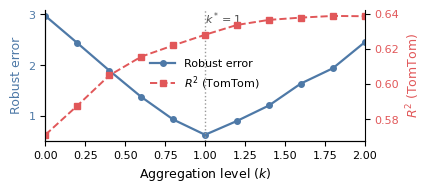

REGION:  seoul
Best k (robust error): 1.0
      k  ROBUST_ERROR        R2
0   0.0     21.650021  0.657237
1   0.2     15.395237  0.674907
2   0.4     10.634867  0.671506
3   0.6      7.778975  0.673197
4   0.8      5.547655  0.679226
5   1.0      3.483277  0.673101
6   1.2      4.783556  0.668702
7   1.4     10.961783  0.633003
8   1.6     11.859658  0.629393
9   1.8     13.619569  0.615724
10  2.0     14.779884  0.614670


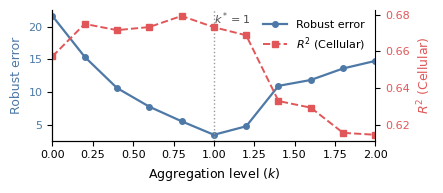

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Iterable, Tuple, Union, Optional


def select_best_k_from_csvs_robust_error_with_r2(
    path_od_result: Union[str, Path],
    reg: str,
    model: str,
    k_values: Optional[Iterable[float]] = None,
    week_day: str = "mon",  # (your DAY_GROUP string)
    keys: Tuple[str, ...] = ("ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"),
    # --- Robust error uses this column from each candidate file ---
    pred_col_for_robust: str = "VH_COUNT",
    # --- R2 uses this column from each candidate file (copied into COUNT) ---
    pred_col_for_r2: str = "VH_COUNT",
    # --- True dataframe (TomTom) provided by you ---
    true_df: Optional[pd.DataFrame] = None,  # must contain keys + ['COUNT']
    true_count_col: str = "COUNT",
    min_count: float = 5,                   # MIN_COUNT threshold for R2 (and for both sides)
    center: str = "median",                 # 'median' or 'mean'
    key_dtypes: Tuple[str, ...] = ("str", "str", "int"),
    float_fmt: str = ".3f",
    format_k_in_filename: bool = False,
    round_counts_for_r2: bool = True,       # keep your rounding step
    verbose: bool = False,
):
    """
    Keeps *all* robust-error logic and additionally computes R2 against a provided true_df.

    Robust error (internal consistency, NOT GT RMSE):
        robust_error_k = sqrt( mean( (X_k - C)^2 ) )
    where C is per-cell center across candidates (median/mean).

    R2 is computed on the aligned support of true OD-time cells:
      - true_df is aggregated by keys using sum(COUNT)
      - pred counts are taken from pred_col_for_r2 (e.g., VH_COUNT), aggregated by keys if needed
      - optional rounding
      - threshold applied to BOTH true and pred: >= min_count
      - R2 computed on intersection after thresholding

    Returns
    -------
    best_k : float
        Minimizes ROBUST_ERROR.
    metrics : pd.DataFrame
        Columns: ['k', 'ROBUST_ERROR', 'R2', 'N_R2']
    """

    if k_values is None:
        k_values = [0.2 * i for i in range(11)]
    else:
        k_values = list(k_values)

    if len(keys) != len(key_dtypes):
        raise ValueError("keys and key_dtypes must have the same length.")

    p = Path(path_od_result)

    def _k_str(k: float) -> str:
        return format(k, float_fmt) if format_k_in_filename else str(k)

    def _enforce_key_types(df: pd.DataFrame) -> pd.DataFrame:
        for col, dt in zip(keys, key_dtypes):
            if dt == "str":
                df[col] = df[col].astype(str)
            elif dt == "int":
                df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0).astype(int)
            elif dt == "float":
                df[col] = pd.to_numeric(df[col], errors="coerce").astype(float)
            else:
                raise ValueError(f"Unsupported dtype spec: {dt}")
        return df

    def _robust_r2(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        # R2 = 1 - SSE/SST; return NaN if undefined
        if y_true.size == 0:
            return np.nan
        y_true_mean = float(np.mean(y_true))
        sst = float(np.sum((y_true - y_true_mean) ** 2))
        if sst == 0.0:
            return np.nan
        sse = float(np.sum((y_true - y_pred) ** 2))
        return 1.0 - (sse / sst)

    # --------------------------------------------------
    # 0) Prepare true_df for R2 (if provided)
    # --------------------------------------------------
    true_index = None
    true_vals_full = None

    if true_df is not None:
        if true_count_col not in true_df.columns:
            raise KeyError(f"true_df must contain '{true_count_col}' column.")
        for c in keys:
            if c not in true_df.columns:
                raise KeyError(f"true_df missing key column '{c}'.")

        tdf = true_df[list(keys) + [true_count_col]].copy()
        tdf = _enforce_key_types(tdf)
        tdf[true_count_col] = pd.to_numeric(tdf[true_count_col], errors="coerce").fillna(0.0).astype(float)

        # Aggregate like your snippet: sum over duplicates of keys
        tdf[true_count_col] = tdf.groupby(list(keys))[true_count_col].transform("sum")
        tdf = tdf.drop_duplicates(subset=list(keys) + [true_count_col])

        if round_counts_for_r2:
            tdf[true_count_col] = np.round(tdf[true_count_col])

        # Apply MIN_COUNT threshold to true side first (as in your snippet)
        tdf = tdf[tdf[true_count_col] >= float(min_count)]

        # Create a stable index for alignment
        tdf = tdf.sort_values(list(keys), kind="mergesort").reset_index(drop=True)
        true_index = pd.MultiIndex.from_frame(tdf[list(keys)], names=keys)
        true_vals_full = tdf[true_count_col].to_numpy(dtype=float, copy=False)

        if verbose:
            print(f"[true] rows(after agg/round/thresh)={len(tdf)} sum={tdf[true_count_col].sum():.3f}")

    # --------------------------------------------------
    # 1) Load each candidate and build union of keys (for robust error)
    # --------------------------------------------------
    k_to_series_robust = {}
    k_to_series_r2 = {}  # optional, only if true_df is provided
    union_keys = None

    for k in k_values:

        fp = p / f"case_{reg}_matrix_1.0_{k}_{week_day}.csv"
        #if reg == 'seoul':
        #    fp = p / f"case_{reg}_matrix_1.0_{k}_{week_day}.csv"

        # Read only what we need
        usecols = set(keys)
        usecols.add(pred_col_for_robust)
        if true_df is not None:
            usecols.add(pred_col_for_r2)

        df = pd.read_csv(fp, usecols=list(usecols))
        df = _enforce_key_types(df)

        # robust column -> float, NaN -> 0
        df[pred_col_for_robust] = (
            pd.to_numeric(df[pred_col_for_robust], errors="coerce")
              .fillna(0.0)
              .astype(float)
        )

        # update union keys
        cur_keys = df[list(keys)].drop_duplicates()
        union_keys = cur_keys if union_keys is None else (
            pd.concat([union_keys, cur_keys], ignore_index=True).drop_duplicates()
        )

        # store robust series
        k_to_series_robust[k] = df.set_index(list(keys))[pred_col_for_robust]

        # store R2 series (if needed)
        if true_df is not None:
            df[pred_col_for_r2] = (
                pd.to_numeric(df[pred_col_for_r2], errors="coerce")
                  .fillna(0.0)
                  .astype(float)
            )
            k_to_series_r2[k] = df.set_index(list(keys))[pred_col_for_r2]

        if verbose:
            print(f"[load] k={k} rows={len(df)} from {fp.name}")

    if union_keys is None or union_keys.empty:
        raise ValueError("Union of (o,d,t) keys is empty.")

    union_keys = union_keys.sort_values(list(keys), kind="mergesort").reset_index(drop=True)
    union_index = pd.MultiIndex.from_frame(union_keys, names=keys)

    # --------------------------------------------------
    # 2) Assemble X matrix (K × N) for robust error
    # --------------------------------------------------
    K, N = len(k_values), len(union_index)
    X = np.empty((K, N), dtype=float)

    for i, k in enumerate(k_values):
        X[i, :] = (
            k_to_series_robust[k]
            .reindex(union_index, fill_value=0.0)
            .to_numpy(dtype=float, copy=False)
        )

    # --------------------------------------------------
    # 3) Center per cell (robust error)
    # --------------------------------------------------
    if center == "median":
        C = np.nanmedian(X, axis=0)
    elif center == "mean":
        C = np.nanmean(X, axis=0)
    else:
        raise ValueError("center must be 'median' or 'mean'")

    # --------------------------------------------------
    # 4) Robust error (vectorized)
    # --------------------------------------------------
    robust_error = np.sqrt(np.nanmean((X - C) ** 2, axis=1))

        # --------------------------------------------------
    # 5) R2 for each k vs true_df
    #     - only cells with POSITIVE counts in BOTH true and pred
    # --------------------------------------------------
    r2_list = [np.nan] * len(k_values)
    n_r2_list = [0] * len(k_values)

    if true_df is not None:
        for i, k in enumerate(k_values):

            # align prediction to true support
            pred = (
                k_to_series_r2[k]
                .reindex(true_index, fill_value=0.0)
                .to_numpy(dtype=float, copy=False)
            )

            if round_counts_for_r2:
                pred = np.round(pred)

            # ---- intersection support (CRITICAL FIX) ----
            mask = (
                (true_vals_full > 0) &
                (pred > 0) &
                (true_vals_full >= float(min_count)) &
                (pred >= float(min_count))
            )

            y_true = true_vals_full[mask]
            y_pred = pred[mask]

            n_r2_list[i] = int(y_true.size)

            if y_true.size == 0:
                r2_list[i] = np.nan
            else:
                y_bar = y_true.mean()
                sst = np.sum((y_true - y_bar) ** 2)

                if sst == 0.0:
                    r2_list[i] = np.nan
                else:
                    sse = np.sum((y_true - y_pred) ** 2)
                    r2_list[i] = 1.0 - sse / sst

    # --------------------------------------------------
    # 6) Build metrics and select best_k by robust error
    # --------------------------------------------------
    metrics = (
        pd.DataFrame(
            {
                "k": k_values,
                "ROBUST_ERROR": robust_error,
                "R2": r2_list,
                #"N_R2": n_r2_list,
            }
        )
        .sort_values("k", kind="mergesort")
        .reset_index(drop=True)
    )

    # guard against NaN / inf robust error (penalize)
    s = metrics["ROBUST_ERROR"].replace([np.inf, -np.inf], np.nan)
    if s.isna().any():
        worst = s.max(skipna=True)
        metrics["ROBUST_ERROR"] = s.fillna(worst if pd.notna(worst) else 0.0)

    best_k = metrics.loc[metrics["ROBUST_ERROR"].idxmin(), "k"]
    return best_k, metrics



from typing import Optional, Tuple


def plot_robust_error_and_r2_nature(
    table: pd.DataFrame,
    reg: str,
    *,
    best_k: Optional[float] = None,
    r2_label: str = r"$R^2$",
    xlabel: str = r"Aggregation level ($k$)",
    figsize: Tuple[float, float] = (4.5, 2.0),
    save_path: Optional[str] = None,
    show: bool = True,
):
    """
    Nature-style dual-axis plot: Robust error (left) + R² (right).

    Parameters
    ----------
    table : pd.DataFrame
        Must contain columns: ['k', 'ROBUST_ERROR', 'R2'].
    best_k : float, optional
        If provided, draw a vertical line and label at k*.
    r2_label : str
        Label for the R² curve (right axis).
    xlabel : str
        X-axis label.
    figsize : (float, float)
        Figure size in inches.
    save_path : str, optional
        If provided, save the figure to this path.
    show : bool
        If True, call plt.show().

    Returns
    -------
    fig, ax1, ax2
    """
    required = {"k", "ROBUST_ERROR", "R2"}
    missing = required - set(table.columns)
    if missing:
        raise KeyError(f"table missing required columns: {sorted(missing)}")

    # ------------------------------------------------------------
    # Nature-style configuration
    # ------------------------------------------------------------
    plt.rcParams.update({
        "font.family": "sans-serif",
        "font.sans-serif": ["DejaVu Sans"],
        "font.size": 9,
        "axes.labelsize": 9,
        "axes.titlesize": 9,
        "xtick.labelsize": 8,
        "ytick.labelsize": 8,
        "legend.fontsize": 8,
        "axes.linewidth": 0.8,
    })

    # Data
    x = table["k"].to_numpy(dtype=float, copy=False)
    robust_error = table["ROBUST_ERROR"].to_numpy(dtype=float, copy=False)
    r2 = table["R2"].to_numpy(dtype=float, copy=False)

    # Nature-style colors
    color_robust = "#4E79A7"  # muted blue
    color_r2 = "#E15759"      # muted red

    fig, ax1 = plt.subplots(figsize=figsize)

    # Left axis: Robust error
    line1, = ax1.plot(
        x,
        robust_error,
        color=color_robust,
        lw=1.6,
        marker="o",
        ms=4,
        label="Robust error",
    )
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel("Robust error", color=color_robust)
    ax1.tick_params(axis="y", labelcolor=color_robust)
    ax1.set_xlim(float(np.min(x)), float(np.max(x)))

    # Clean spines (Nature style)
    ax1.spines["top"].set_visible(False)
    ax1.spines["right"].set_visible(False)

    # Right axis: R²
    ax2 = ax1.twinx()
    line2, = ax2.plot(
        x,
        r2,
        color=color_r2,
        lw=1.4,
        ls="--",
        marker="s",
        ms=4,
        label=r2_label,
    )
    ax2.set_ylabel(r2_label, color=color_r2)
    ax2.tick_params(axis="y", labelcolor=color_r2)
    ax2.spines["top"].set_visible(False)

    # Best-k annotation (subtle)
    if best_k is not None and np.isfinite(best_k):
        ax1.axvline(best_k, color="0.6", lw=1.0, ls=":")
        y_top = ax1.get_ylim()[1]
        ax1.text(
            best_k,
            y_top,
            f"$k^*={best_k:g}$",
            ha="left",
            va="top",
            fontsize=8,
            color="0.3",
        )

    # Legend (compact, unobtrusive)

    legend_loc = "center" if reg is "sgp" else "upper right"

    lines = [line1, line2]
    labels = [l.get_label() for l in lines]
    ax1.legend(
        lines,
        labels,
        loc=legend_loc,
        frameon=False,
        fontsize=8,
        handlelength=2.2,
    )

    fig.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)

    return fig, ax1, ax2


# -----------------------------
# Example usage
# -----------------------------
# save_path = path_od_figure + f"case_line_{reg}_{model}.png"
# plot_robust_error_and_r2_nature(
#     table,
#     best_k=best_k,
#     r2_label=r"$R^2$ (TomTom)",
#     save_path=save_path,
# )


# -----------------------------
# Example usage (with your true_counts dataframe)
# -----------------------------
MODEL_NAME = "xgboost"

for REGION in ["sgp", "seoul"]:
    print('REGION: ', REGION)

    KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
    MIN_COUNT = 1
    WEEK_DAY = 'mon'

    R2_LABEL = r"$R^2$ (TomTom)"

    # Ground truth (TomTom) -> true_df

    R2_COUNT = 'VH_COUNT'

    if REGION == 'sgp':
        true_counts = pd.read_csv(path_od_result + f"case_{REGION}_matrix_tomtom_mon_wed.csv")
        WEEK_DAY = 'mon_wed'
    elif REGION == 'seoul':
        true_counts = pd.read_csv(path_od_result + f'case_{REGION}_matrix_cellular.csv')
        R2_COUNT = 'COUNT'
        R2_LABEL = r"$R^2$ (Cellular)"


    true_counts = true_counts[KEY_COLS + ["COUNT"]].copy()
    true_counts["COUNT"] = true_counts.groupby(KEY_COLS)["COUNT"].transform("sum")
    true_counts = true_counts.drop_duplicates()

    # Round (kept)
    true_counts["COUNT"] = np.round(true_counts["COUNT"])
    true_counts = true_counts[true_counts["COUNT"] >= MIN_COUNT].copy()

    k_values = [round(0.2 * i, 1) for i in range(11)]

    best_k, table = select_best_k_from_csvs_robust_error_with_r2(
        path_od_result=path_od_result,
        reg=REGION,
        model=MODEL_NAME,
        week_day=WEEK_DAY,
        k_values=k_values,
        pred_col_for_robust="COUNT",   # robust error uses the private-mode count in results
        pred_col_for_r2=R2_COUNT,       # R2 compares to TomTom private-mode COUNT
        true_df=true_counts,
        true_count_col="COUNT",
        min_count=MIN_COUNT,
        center="median",
        verbose=False,
    )

    print("Best k (robust error):", best_k)
    print(table)

    save_path = path_od_figure + f"case_{REGION}_robust_error.png"
    plot_robust_error_and_r2_nature(
        table,
        reg=REGION,
        best_k=best_k,
        r2_label=R2_LABEL,
        save_path=save_path,
    )




## Weight function

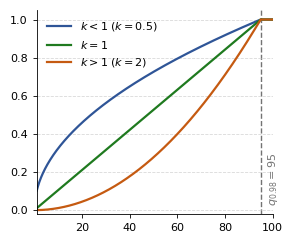

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# Nature-style (clean, quiet, print-safe)
# =========================================================
plt.rcParams.update({
    "font.size": 9,
    "axes.titlesize": 10,
    "axes.labelsize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "savefig.dpi": 450,
})

# Domain and quantile
X = np.linspace(1, 100, 1000)
q98 = 95.0

def F(x, k, q):
    """F(x) = min(1, (x/q)^k)."""
    return np.minimum(1.0, (x / q) ** k)

# Curves
k_values = [0.5, 1.0, 2.0]
labels = [r"$k<1\;(k=0.5)$", r"$k=1$", r"$k>1\;(k=2)$"]

# Muted, Nature-like palette (print-safe)
COLS = ["#2F5597", "#1F7A1F", "#C55A11"]  # muted blue, green, orange-brown

fig, ax = plt.subplots(figsize=(3.0, 2.5))

for k, lab, col in zip(k_values, labels, COLS):
    ax.plot(X, F(X, k, q98), lw=1.6, color=col, label=lab)

# Threshold line at q98
ax.axvline(q98, ls="--", lw=1.0, color="0.45", zorder=0)
ax.annotate(
    r"$q_{0.98}=95$",
    xy=(q98, 0.02),
    xytext=(4, 0),
    textcoords="offset points",
    rotation=90,
    va="bottom",
    ha="left",
    color="0.45",
    fontsize=8,
)

# Axes
ax.set_xlim(1, 100)
ax.set_ylim(-0.02, 1.05)
#ax.set_xlabel(r"$X$")
#ax.set_ylabel(r"$F(X)$")

# Clean spines (Nature-like)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Subtle grid (y-only)
ax.grid(axis="y", ls="--", lw=0.6, color="0.85")
ax.grid(axis="x", visible=False)

# Legend (no frame)
ax.legend(loc="upper left", frameon=False, handlelength=2.2)

fig.tight_layout()
fig.savefig(path_od_figure + "F_curve_nature.png", bbox_inches="tight")  # optional
plt.show()


#SFig: Validation with private-vehicle mode

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/cpc_r2_scatter_1x3_sgp_PT.png


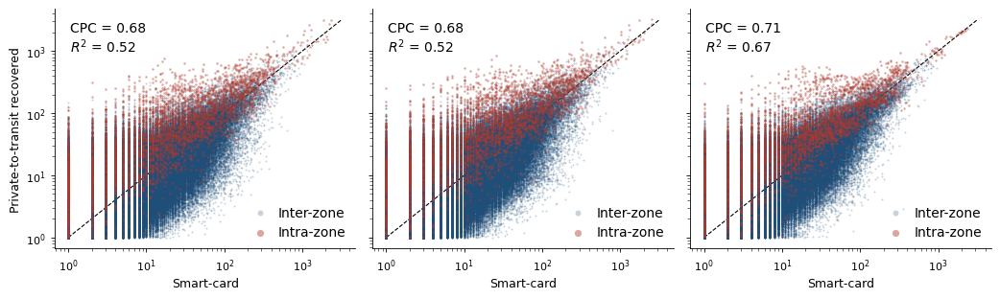


Validation summary:
- Region: sgp
- Model : xgboost
- k     : 1.0
- Mode  : PT
  week_group       CPC        R2
0        mon  0.682228  0.524540
1        thu  0.681033  0.521963
2        sat  0.705387  0.671665
Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/cpc_r2_scatter_1x3_sgp_WK.png


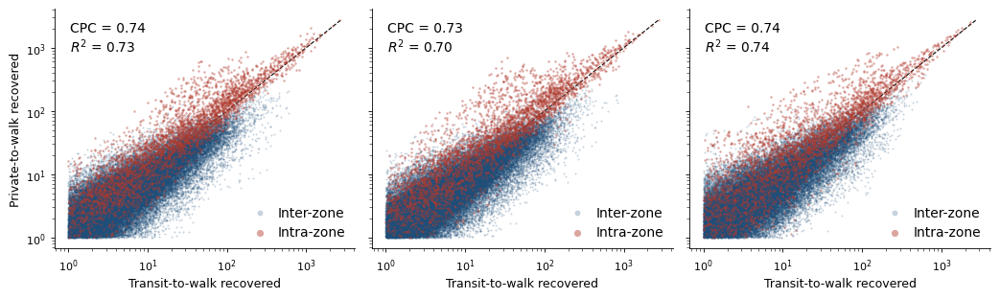


Validation summary:
- Region: sgp
- Model : xgboost
- k     : 1.0
- Mode  : WK
  week_group       CPC        R2
0        mon  0.744559  0.726929
1        thu  0.730316  0.698047
2        sat  0.738585  0.744683


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from sklearn.metrics import r2_score
from typing import Optional, Tuple, Dict, List

# ============================================================
# Plot settings (USE THESE)
# ============================================================
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 9,
    "axes.labelsize": 9,
    "axes.titlesize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 10,
    "axes.linewidth": 0.6,
    "savefig.dpi": 300,
})

COLORS = {
    "intra": "#B03A2E",
    "inter": "#1F4E79",
}

# ============================================================
# Helpers
# ============================================================
def infer_od_cols(key_cols: List[str]) -> Tuple[str, str]:
    if "O" in key_cols and "D" in key_cols:
        return "O", "D"

    origin_candidates = [c for c in key_cols if c.upper().startswith("ORIGIN")]
    dest_candidates = [c for c in key_cols if c.upper().startswith("DESTINATION")]
    if origin_candidates and dest_candidates:
        return origin_candidates[0], dest_candidates[0]

    o = [c for c in key_cols if c.upper().startswith("O")]
    d = [c for c in key_cols if c.upper().startswith("D")]
    if o and d:
        return o[0], d[0]

    raise ValueError("Cannot infer origin/destination columns from key_cols.")


def aggregate_counts(df: pd.DataFrame, key_cols: List[str], count_col: str = "COUNT") -> pd.DataFrame:
    # groupby-sum without deep copies; then unique rows
    out = df[key_cols + [count_col]].copy()
    out[count_col] = out.groupby(key_cols)[count_col].transform("sum")
    out = out.drop_duplicates().rename(columns={count_col: "COUNT"})
    return out


def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0, round_counts: bool = False) -> pd.DataFrame:
    out = df.copy()
    #if round_counts:
    #    out["COUNT"] = np.round(out["COUNT"].to_numpy(dtype=float, copy=False))
    out = out[out["COUNT"] >= float(min_count)].copy()
    return out


def compute_cpc_r2_from_merged(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, float]:
    denom = float(y_true.sum() + y_pred.sum())
    cpc = (2.0 * float(np.minimum(y_true, y_pred).sum()) / denom) if denom > 0 else np.nan

    if y_true.size < 2:
        r2 = np.nan
    else:
        try:
            r2 = float(r2_score(y_true, y_pred))
        except Exception:
            r2 = np.nan

    return cpc, r2


# ============================================================
# Scatter (CPC + R2) on a provided axis
# ============================================================
def plot_od_scatter_cpc_r2_ax(
    ax: plt.Axes,
    pred_df: pd.DataFrame,
    true_df: pd.DataFrame,
    key_cols: List[str],
    *,
    title: str,
    max_val: float,
    x_label: str,
    y_label: str,
    colors: Dict[str, str] = COLORS,
    show_legend: bool = True,
) -> Tuple[float, float, int]:

    pred = aggregate_counts(pred_df, key_cols, count_col="COUNT")
    true = aggregate_counts(true_df, key_cols, count_col="COUNT")

    merged = pred.merge(true, on=key_cols, how="inner", suffixes=("_pred", "_true"))
    y_pred = merged["COUNT_pred"].to_numpy(dtype=float, copy=False)
    y_true = merged["COUNT_true"].to_numpy(dtype=float, copy=False)

    o_col, d_col = infer_od_cols(key_cols)
    is_intra = merged[o_col].eq(merged[d_col]).to_numpy(bool)

    cpc, r2 = compute_cpc_r2_from_merged(y_true, y_pred)

    ax.scatter(
        y_true[~is_intra],
        y_pred[~is_intra],
        s=2,
        alpha=0.25,
        color=colors["inter"],
        linewidths=0,
        label="Inter-zone",
        zorder=1,
    )
    ax.scatter(
        y_true[is_intra],
        y_pred[is_intra],
        s=3,
        alpha=0.45,
        color=colors["intra"],
        linewidths=0,
        label="Intra-zone",
        zorder=2,
    )

    vmax = float(max_val) if max_val is not None else float(
        max(np.max(y_true) if y_true.size else 1.0, np.max(y_pred) if y_pred.size else 1.0)
    )
    vmax = max(vmax, 1.0)

    ax.plot([1, vmax], [1, vmax], linestyle="--", color="black", linewidth=0.8, zorder=0)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())

    #ax.set_title(title)
    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    ax.text(
        0.05, 0.95,
        rf"CPC = {cpc:.2f}" + "\n" + rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )

    return cpc, r2, int(len(merged))


# ============================================================
# Loader for week-groups (mon_wed / thu_fri / sat_sun)
# ============================================================
def load_true_pred_for_week_group(
    *,
    path_od_result: str,
    region: str,
    week_day_group: str,   # mon_wed / thu_fri / sat_sun
    k_value: str,
    mode_to_validate: str, # "VH" / "WK" / "PT"
    key_cols: List[str],
    min_count: float = 1.0,
    round_counts: bool = True,
    pred_source_tag: str = "VH",  # file: case_{region}_matrix_from_VH_{week_day_group}.csv
) -> Tuple[pd.DataFrame, pd.DataFrame]:

    #if mode_to_validate == "VH":
    #    if week_day_group == 'mon':
    #        week_day_group = 'mon_wed'

    # TRUE (your prior code style)
    true_path = path_od_result + f"case_{region}_matrix_1.0_{k_value}_{week_day_group}.csv"
    true_raw = pd.read_csv(true_path, usecols=key_cols + [f"{mode_to_validate}_COUNT"])
    #true_raw = true_raw[true_raw['ORIGIN_SUBZONE'] != true_raw['DESTINATION_SUBZONE']]
    true_raw = true_raw[true_raw[f"{mode_to_validate}_COUNT"] > 0].copy()
    true_raw["COUNT"] = true_raw[f"{mode_to_validate}_COUNT"]
    true_raw = true_raw[key_cols + ["COUNT"]]

    true_gt = round_and_threshold(
        aggregate_counts(true_raw, key_cols, "COUNT"),
        min_count=min_count,
        round_counts=round_counts,
    )

    gt_support = true_gt[key_cols].drop_duplicates()

    # PRED
    pred_path = path_od_result + f"case_{region}_matrix_from_{pred_source_tag}_{week_day_group}.csv"
    pred_raw = pd.read_csv(pred_path, usecols=key_cols + [f"{mode_to_validate}_COUNT"])
    #pred_raw = pred_raw[pred_raw['ORIGIN_SUBZONE'] != pred_raw['DESTINATION_SUBZONE']]
    pred_raw = pred_raw[pred_raw[f"{mode_to_validate}_COUNT"] > 0].copy()
    pred_raw["COUNT"] = pred_raw[f"{mode_to_validate}_COUNT"]
    pred_raw = pred_raw[key_cols + ["COUNT"]]

    # Align to TRUE key support (same as your merge logic)
    pred_raw = pred_raw.merge(gt_support, on=key_cols, how="inner")

    pred = round_and_threshold(
        aggregate_counts(pred_raw, key_cols, "COUNT"),
        min_count=min_count,
        round_counts=round_counts,
    )

    return true_gt, pred


# ============================================================
# 1×3 GRID for mon_wed / thu_fri / sat_sun (CPC + R2)
# ============================================================
def plot_scatter_grid_1x3_week_groups_cpc_r2(
    *,
    region: str,
    model: str,
    k_value: str,
    week_groups: List[str],              # ["mon_wed","thu_fri","sat_sun"]
    week_group_mapping: Dict[str, str],  # labels for titles
    key_cols: List[str],
    path_od_result: str,
    mode_to_validate: str = "VH",        # "VH" / "WK" / "PT"
    pred_source_tag: str = "VH",
    min_count: float = 1.0,
    round_counts: bool = True,
    fig_size: Tuple[float, float] = (10.5, 3.2),
    save_path: Optional[str] = None,
) -> pd.DataFrame:

    true_by_group: Dict[str, pd.DataFrame] = {}
    pred_by_group: Dict[str, pd.DataFrame] = {}
    vmax_global = 1.0

    # Load all groups first to get a consistent vmax (Nature-style comparability)
    for wg in week_groups:
        true_df, pred_df = load_true_pred_for_week_group(
            path_od_result=path_od_result,
            region=region,
            week_day_group=wg,
            k_value=k_value,
            mode_to_validate=mode_to_validate,
            key_cols=key_cols,
            min_count=min_count,
            round_counts=round_counts,
            pred_source_tag=pred_source_tag,
        )

        true_by_group[wg] = true_df
        pred_by_group[wg] = pred_df

        if len(true_df):
            vmax_global = max(vmax_global, float(true_df["COUNT"].max()))
        if len(pred_df):
            vmax_global = max(vmax_global, float(pred_df["COUNT"].max()))

    vmax_global = max(vmax_global, 1.0)

    fig, axes = plt.subplots(1, len(week_groups), figsize=fig_size, sharex=True, sharey=True)
    if len(week_groups) == 1:
        axes = [axes]

    y_label_ = "Private-to-transit recovered"
    x_label_ = "Smart-card"
    if mode_to_validate=='WK':
        y_label_ = "Private-to-walk recovered"
        x_label_ = "Transit-to-walk recovered"

    rows = []
    for i, wg in enumerate(week_groups):
        ax = axes[i]

        # Optional console diagnostics (kept lightweight)
        #print(f"[{wg}] sum true: {true_by_group[wg]['COUNT'].sum():.0f} | sum pred: {pred_by_group[wg]['COUNT'].sum():.0f}")

        cpc, r2, n = plot_od_scatter_cpc_r2_ax(
            ax=ax,
            pred_df=pred_by_group[wg],
            true_df=true_by_group[wg],
            key_cols=key_cols,
            title=week_group_mapping.get(wg, wg),
            max_val=vmax_global,
            x_label=x_label_,
            y_label=y_label_ if i == 0 else "",
            show_legend=True,
        )
        rows.append({"week_group": wg, "CPC": cpc, "R2": r2}) #, "N": n

    fig.tight_layout()

    if save_path:
        fig.savefig(save_path, dpi=200, bbox_inches="tight")
        print("Saved:", save_path)

    plt.show()

    out_table = pd.DataFrame(rows)
    print("\nValidation summary:")
    print(f"- Region: {region}")
    print(f"- Model : {model}")
    print(f"- k     : {k_value}")
    print(f"- Mode  : {mode_to_validate}")
    print(out_table)

    return out_table


# ============================================================
# Example usage (week-groups)
# ============================================================
REGION = "sgp"
MODEL = "xgboost"
K_VALUE = "1.0"

WEEK_GROUPS = ["mon", "thu", "sat"]
WEEK_GROUP_MAPPING = {"mon": "Mon", "thu": "Thu", "sat": "Sat"}

KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
PRED_SOURCE_TAG = "VH"
MIN_COUNT = 1

for MODE_TO_VALIDATE in ["PT", "WK"]:   # "WK" or "PT" or "VH"

    save_path = path_od_figure + f"cpc_r2_scatter_1x3_{REGION}_{MODE_TO_VALIDATE}.png"

    summary_table = plot_scatter_grid_1x3_week_groups_cpc_r2(
        region=REGION,
        model=MODEL,
        k_value=K_VALUE,
        week_groups=WEEK_GROUPS,
        week_group_mapping=WEEK_GROUP_MAPPING,
        key_cols=KEY_COLS,
        path_od_result=path_od_result,
        mode_to_validate=MODE_TO_VALIDATE,
        pred_source_tag=PRED_SOURCE_TAG,
        min_count=MIN_COUNT,
        round_counts=True,
        fig_size=(10.5, 3.2),
        save_path=save_path,
    )


# SFig: Validaiton OD by time of day

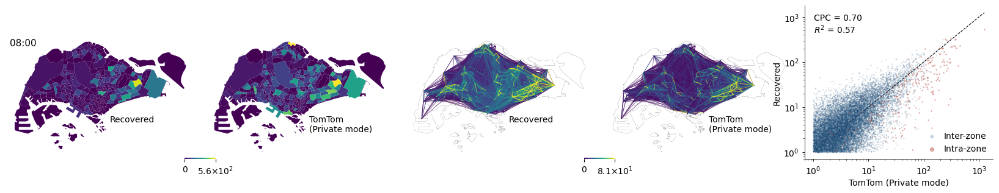

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_sgp_maps_plus_scatter_08.png


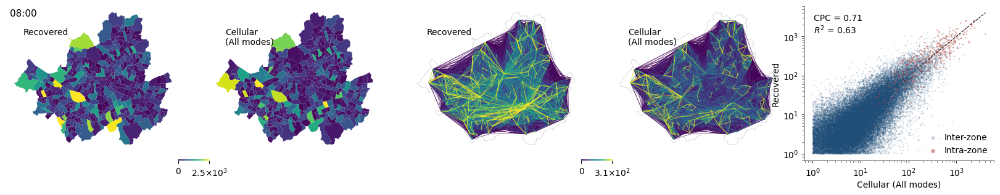

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_seoul_maps_plus_scatter_08.png


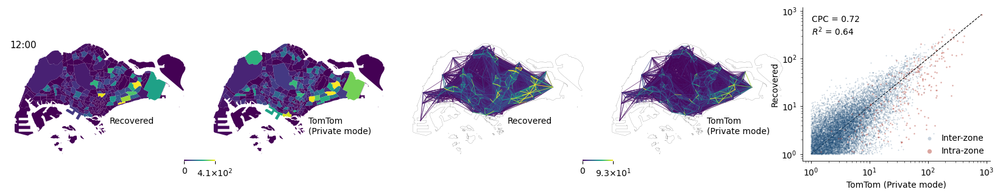

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_sgp_maps_plus_scatter_12.png


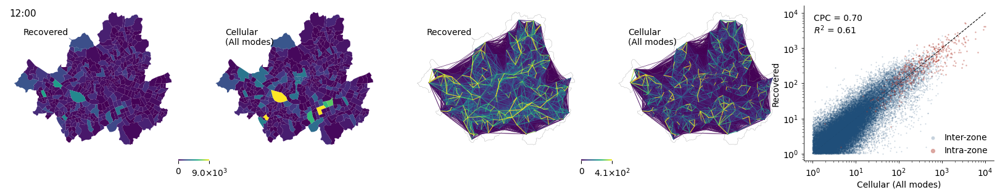

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_seoul_maps_plus_scatter_12.png


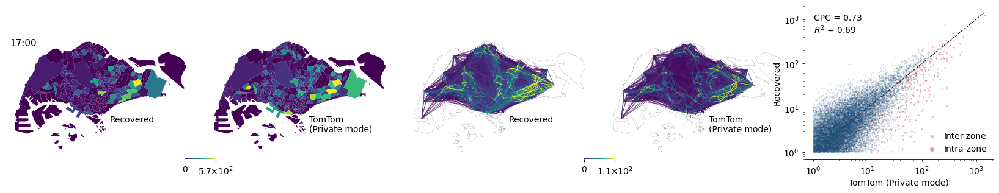

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_sgp_maps_plus_scatter_17.png


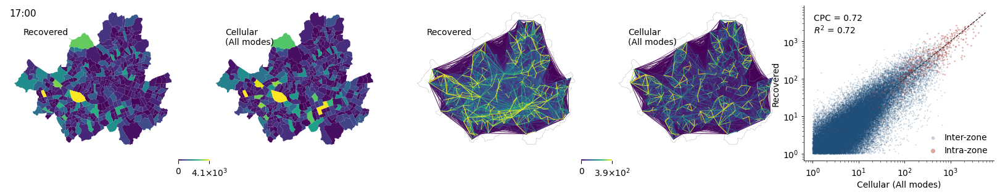

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_validation_seoul_maps_plus_scatter_17.png


In [ ]:
# ======================================================
# Cleaned + de-duplicated version (all logic preserved)
# - Keeps: sampling in round_and_threshold (frac=0.05), rounding, thresholds
# - Keeps: scatter CPC/R2 logic, intra/inter split logic, map logic, colorbars
# - Produces: 3 separate figures per city (hours 8, 12, 17)
#   Each figure is 1×5: [4 maps] + [scatter] for that hour
# ======================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as mticker
from matplotlib.colors import Normalize
from matplotlib.gridspec import GridSpecFromSubplotSpec
from sklearn.metrics import r2_score


# ======================================================
# Shared settings
# ======================================================
COLORS = {"intra": "#B03A2E", "inter": "#1F4E79"}
color_map = "viridis"

KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
MIN_COUNT = 1
TIMES_TO_PLOT = [8, 12, 17]

ROW_FIG_LEFT, ROW_FIG_RIGHT, ROW_FIG_TOP, ROW_FIG_BOTTOM = 0.04, 0.99, 0.96, 0.06


# ======================================================
# Helpers (general)
# ======================================================
def aggregate_counts(df: pd.DataFrame, key_cols: list[str], count_col: str = "COUNT") -> pd.DataFrame:
    out = df[key_cols + [count_col]].copy()
    out[count_col] = out.groupby(key_cols)[count_col].transform("sum")
    return out.drop_duplicates().rename(columns={count_col: "COUNT"})


def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    #out["COUNT"] = np.round(out["COUNT"])
    out = out[out["COUNT"] >= min_count].copy()
    return out#.sample(frac=0.05)


def infer_od_cols(key_cols: list[str]) -> tuple[str, str]:
    o = [c for c in key_cols if c.upper().startswith("O")][0]
    d = [c for c in key_cols if c.upper().startswith("D")][0]
    return o, d


def aggregate_to_od_only(df_time_od: pd.DataFrame) -> pd.DataFrame:
    out = df_time_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    out["COUNT"] = out.groupby(["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"])["COUNT"].transform("sum")
    return out.drop_duplicates()


def slice_hour(df_time_od: pd.DataFrame, hour: int, *, key_cols: list[str], min_count: int) -> pd.DataFrame:
    out = df_time_od[df_time_od["TRIP_STARTTIME"] == int(hour)].copy()
    out = round_and_threshold(aggregate_counts(out, key_cols), min_count=min_count)
    return out


def make_row_figure_1x5(*, figsize: tuple[float, float], wspace: float):
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(left=ROW_FIG_LEFT, right=ROW_FIG_RIGHT, top=ROW_FIG_TOP, bottom=ROW_FIG_BOTTOM)

    outer = fig.add_gridspec(nrows=1, ncols=1)
    gs = GridSpecFromSubplotSpec(1, 5, subplot_spec=outer[0], wspace=wspace)
    axes = [fig.add_subplot(gs[0, j]) for j in range(5)]
    return fig, axes


# ======================================================
# Scatter plotter (logic unchanged)
# ======================================================
def plot_od_scatter_ax(
    ax,
    pred_df: pd.DataFrame,
    true_df: pd.DataFrame,
    key_cols: list[str],
    *,
    colors: dict,
    max_val: float,
    x_label: str,
    y_label: str,
    show_legend: bool = True,
):
    pred = aggregate_counts(pred_df, key_cols, count_col="COUNT")
    true = aggregate_counts(true_df, key_cols, count_col="COUNT")

    df = pred.merge(true, on=key_cols, suffixes=("_pred", "_true"))
    y_pred = df["COUNT_pred"].to_numpy(float)
    y_true = df["COUNT_true"].to_numpy(float)

    o_col, d_col = infer_od_cols(key_cols)
    is_intra = df[o_col].eq(df[d_col]).to_numpy(bool)

    denom = y_pred.sum() + y_true.sum()
    cpc = (2.0 * np.minimum(y_pred, y_true).sum() / denom) if denom > 0 else np.nan
    r2 = r2_score(y_true, y_pred) if len(df) > 1 else np.nan

    ax.scatter(
        y_true[~is_intra], y_pred[~is_intra],
        s=2, alpha=0.25, color=colors["inter"], linewidths=0,
        label="Inter-zone", zorder=1,
    )
    ax.scatter(
        y_true[is_intra], y_pred[is_intra],
        s=3, alpha=0.45, color=colors["intra"], linewidths=0,
        label="Intra-zone", zorder=2,
    )

    vmax = float(max_val) if max_val is not None else float(max(y_true.max(), y_pred.max()))
    vmax = max(vmax, 1.0)

    ax.plot([1, vmax], [1, vmax], linestyle="--", color="black", linewidth=0.8, zorder=0)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())

    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    ax.text(
        0.05, 0.95,
        rf"CPC = {cpc:.2f}" + "\n" + rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


# ======================================================
# Helpers (maps) — logic unchanged, but lightly refactored internally
# ======================================================
def sci_notation(val, prec=1):
    if val == 0:
        return "0"
    s = f"{val:.{prec}e}"
    base, exp = s.split("e")
    return rf"{base}×10$^{int(exp)}$"


def compute_cpc_r2(true_df, pred_df, intra=True):
    if intra:
        mask_true = true_df["ORIGIN_SUBZONE"] == true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] == pred_df["DESTINATION_SUBZONE"]
    else:
        mask_true = true_df["ORIGIN_SUBZONE"] != true_df["DESTINATION_SUBZONE"]
        mask_pred = pred_df["ORIGIN_SUBZONE"] != pred_df["DESTINATION_SUBZONE"]

    t = true_df.loc[mask_true, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()
    p = pred_df.loc[mask_pred, ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    merged = t.merge(p, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], suffixes=("_true", "_pred"))

    y_true = merged["COUNT_true"].to_numpy(float)
    y_pred = merged["COUNT_pred"].to_numpy(float)

    denom = y_true.sum() + y_pred.sum()
    cpc = (2.0 * np.minimum(y_true, y_pred).sum() / denom) if denom > 0 else 0.0

    if len(y_true) < 2 or np.allclose(y_true, y_true[0]):
        r2 = np.nan
    else:
        r2 = float(r2_score(y_true, y_pred))

    return float(cpc), float(r2)


def prepare_inter_xy(df_od, subzone_centroids):
    df = df_od[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    df = (
        df.merge(subzone_centroids, left_on="ORIGIN_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "ORIGIN_SUBZONE_X", "Y": "ORIGIN_SUBZONE_Y"})
    )
    df = (
        df.merge(subzone_centroids, left_on="DESTINATION_SUBZONE", right_on="SUBZONE_C", how="left")
          .drop(columns=["SUBZONE_C"])
          .rename(columns={"X": "DESTINATION_SUBZONE_X", "Y": "DESTINATION_SUBZONE_Y"})
    )

    grp_cols = [
        "ORIGIN_SUBZONE", "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
    ]
    df["COUNT"] = df.groupby(grp_cols)["COUNT"].transform("sum")
    df = df.drop_duplicates()

    return df.dropna(subset=[
        "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
        "COUNT"
    ])


def build_od_order_from_df(df_inter_xy):
    order_df = (
        df_inter_xy[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]]
        .sort_values("COUNT", ascending=True)
        .drop_duplicates(subset=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], keep="first")
        .reset_index(drop=True)
    )
    order_df["ORDER_IDX"] = np.arange(len(order_df), dtype=int)
    return order_df[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "ORDER_IDX"]]


def plot_intra_ax_map(ax, subzones_gdf, df_od, cmap, norm):
    ax.set_axis_off()
    intra = df_od[df_od["ORIGIN_SUBZONE"] == df_od["DESTINATION_SUBZONE"]]
    zone_sum = intra.groupby("DESTINATION_SUBZONE")["COUNT"].sum()

    gdf = subzones_gdf.copy()
    gdf["COUNT"] = gdf["SUBZONE_C"].map(zone_sum).fillna(0.0)

    gdf.plot(column="COUNT", cmap=cmap, norm=norm, ax=ax, edgecolor="none",
             linewidth=0, alpha=1.0, antialiased=True)
    gdf.boundary.plot(ax=ax, color="none", linewidth=0.0)


def plot_inter_ax_map(ax, boundary_gdf, df_od_xy, cmap, norm, od_order=None):
    ax.set_axis_off()

    df = df_od_xy.copy()
    df = df[df["ORIGIN_SUBZONE"] != df["DESTINATION_SUBZONE"]].copy()

    if od_order is not None:
        df = df.merge(od_order, on=["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"], how="inner").sort_values("ORDER_IDX")
    else:
        df = df.sort_values("COUNT", ascending=True)

    for _, row in df.iterrows():
        x0, y0 = row["ORIGIN_SUBZONE_X"], row["ORIGIN_SUBZONE_Y"]
        x1, y1 = row["DESTINATION_SUBZONE_X"], row["DESTINATION_SUBZONE_Y"]
        ctrl_x, ctrl_y = (x0 + x1) / 2.0, (y0 + y1) / 2.0

        t = np.linspace(0, 1, 50)
        xs = (1 - t) ** 3 * x0 + 3 * (1 - t) ** 2 * t * ctrl_x + 3 * (1 - t) * t ** 2 * ctrl_x + t ** 3 * x1
        ys = (1 - t) ** 3 * y0 + 3 * (1 - t) ** 2 * t * ctrl_y + 3 * (1 - t) * t ** 2 * ctrl_y + t ** 3 * y1

        ax.plot(xs, ys, color=cmap(norm(row["COUNT"])), linewidth=0.6, alpha=0.7, zorder=2)

    boundary_gdf.plot(ax=ax, color="none", edgecolor="gray", linewidth=0.2, zorder=3)


def plot_maps_row(
    fig,
    ax_row,
    *,
    reg: str,
    pred_od: pd.DataFrame,
    true_od: pd.DataFrame,
    min_count: int,
    true_label: str,
    text_style: str,   # "sgp" or "seoul"
):
    subzones = gpd.read_file(path_od_data + f"data_{reg}_subzone.shp")
    boundary = subzones.dissolve()

    centroids = subzones.copy()
    centroids["X"] = centroids.geometry.centroid.x
    centroids["Y"] = centroids.geometry.centroid.y
    centroids = centroids[["SUBZONE_C", "X", "Y"]]

    pred = pred_od.copy()
    true = true_od.copy()

    pred["COUNT"] = np.round(pred["COUNT"])
    true["COUNT"] = np.round(true["COUNT"])

    pred = pred[pred["COUNT"] >= min_count].copy()
    true = true[true["COUNT"] >= min_count].copy()

    cpc_intra, r2_intra = compute_cpc_r2(true, pred, intra=True)
    cpc_inter, r2_inter = compute_cpc_r2(true, pred, intra=False)

    pred_xy = prepare_inter_xy(pred, centroids)
    true_xy = prepare_inter_xy(true, centroids)

    pred_inter_xy = pred_xy[pred_xy["ORIGIN_SUBZONE"] != pred_xy["DESTINATION_SUBZONE"]].copy()
    true_inter_xy = true_xy[true_xy["ORIGIN_SUBZONE"] != true_xy["DESTINATION_SUBZONE"]].copy()

    keys = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE"]
    common_inter = pred_inter_xy[keys].drop_duplicates().merge(
        true_inter_xy[keys].drop_duplicates(), on=keys, how="inner"
    )
    pred_inter_xy = pred_inter_xy.merge(common_inter, on=keys, how="inner")
    true_inter_xy = true_inter_xy.merge(common_inter, on=keys, how="inner")
    od_order = build_od_order_from_df(pred_inter_xy)

    intra_pred = pred[pred["ORIGIN_SUBZONE"] == pred["DESTINATION_SUBZONE"]]
    intra_true = true[true["ORIGIN_SUBZONE"] == true["DESTINATION_SUBZONE"]]
    intra_max = max(
        intra_pred["COUNT"].quantile(0.995) if len(intra_pred) else 0,
        intra_true["COUNT"].quantile(0.995) if len(intra_true) else 0,
    )
    intra_max = float(max(intra_max, 1.0))
    norm_intra = Normalize(vmin=0, vmax=intra_max)

    inter_max = max(
        pred_inter_xy["COUNT"].quantile(0.995) if len(pred_inter_xy) else 0,
        true_inter_xy["COUNT"].quantile(0.995) if len(true_inter_xy) else 0,
    )
    inter_max = float(max(inter_max, 1.0))
    norm_inter = Normalize(vmin=0, vmax=inter_max)

    cmap_obj = cm.get_cmap(color_map)
    for ax in ax_row:
        ax.set_axis_off()

    plot_intra_ax_map(ax_row[0], subzones, pred, cmap=cmap_obj, norm=norm_intra)
    plot_intra_ax_map(ax_row[1], subzones, true, cmap=cmap_obj, norm=norm_intra)
    plot_inter_ax_map(ax_row[2], boundary, pred_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)
    plot_inter_ax_map(ax_row[3], boundary, true_inter_xy, cmap=cmap_obj, norm=norm_inter, od_order=od_order)

    if text_style == "sgp":
        ax_row[0].text(0.55, 0.35, "Recovered", transform=ax_row[0].transAxes, ha="left", va="top", fontsize=10)
        ax_row[1].text(0.55, 0.35, "TomTom\n(Private mode)", transform=ax_row[1].transAxes, ha="left", va="top", fontsize=10)
        ax_row[2].text(0.55, 0.35, "Recovered", transform=ax_row[2].transAxes, ha="left", va="top", fontsize=10)
        ax_row[3].text(0.55, 0.35, "TomTom\n(Private mode)", transform=ax_row[3].transAxes, ha="left", va="top", fontsize=10)
    else:
        ax_row[0].text(0.1, 0.85, "Recovered", transform=ax_row[0].transAxes, ha="left", va="top", fontsize=10)
        ax_row[1].text(0.1, 0.85, true_label, transform=ax_row[1].transAxes, ha="left", va="top", fontsize=10)
        ax_row[2].text(0.1, 0.85, "Recovered", transform=ax_row[2].transAxes, ha="left", va="top", fontsize=10)
        ax_row[3].text(0.1, 0.85, true_label, transform=ax_row[3].transAxes, ha="left", va="top", fontsize=10)

    sm_intra = cm.ScalarMappable(norm=norm_intra, cmap=cmap_obj)
    sm_intra.set_array([])
    sm_inter = cm.ScalarMappable(norm=norm_inter, cmap=cmap_obj)
    sm_inter.set_array([])

    pad_v = 0.05 if text_style == "seoul" else 0.0

    cbar_intra = fig.colorbar(sm_intra, ax=[ax_row[0], ax_row[1]], orientation="horizontal", fraction=0.01, pad=pad_v)
    cbar_intra.set_ticks([0, intra_max])
    cbar_intra.set_ticklabels(["0", sci_notation(intra_max, prec=1)])
    for spine in cbar_intra.ax.spines.values():
        spine.set_visible(False)

    cbar_inter = fig.colorbar(sm_inter, ax=[ax_row[2], ax_row[3]], orientation="horizontal", fraction=0.01, pad=pad_v)
    cbar_inter.set_ticks([0, inter_max])
    cbar_inter.set_ticklabels(["0", sci_notation(inter_max, prec=1)])
    for spine in cbar_inter.ax.spines.values():
        spine.set_visible(False)

    txtt1, txtt2 = ( -0.1, 0.15 ) if text_style == "sgp" else (0.07, 0.05)

    '''ax_row[1].text(
        txtt1, txtt2, rf"CPC = {cpc_intra:.2f},  $R^2$ = {r2_intra:.2f}",
        transform=ax_row[1].transAxes, ha="center", va="top", fontsize=10
    )
    ax_row[3].text(
        txtt1, txtt2, rf"CPC = {cpc_inter:.2f},  $R^2$ = {r2_inter:.2f}",
        transform=ax_row[3].transAxes, ha="center", va="top", fontsize=10
    )'''


# ======================================================
# Load per-city data (keeps your file logic)
# ======================================================
def load_city_time_od(
    *,
    region: str,
    true_csv: str,
    pred_csv: str,
    pred_count_col: str,   # "VH_COUNT" or "COUNT"
    key_cols: list[str],
    min_count: int,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    true_raw = pd.read_csv(true_csv)
    true_raw = true_raw[key_cols + ["COUNT"]].copy()
    true_df = round_and_threshold(aggregate_counts(true_raw, key_cols), min_count=min_count)

    pred_raw = pd.read_csv(pred_csv)

    pred_raw = pred_raw[key_cols + [pred_count_col]].copy()
    pred_raw = pred_raw[pred_raw[pred_count_col] > 0].copy()
    pred_raw["COUNT"] = pred_raw[pred_count_col]
    pred_df = pred_raw[key_cols + ["COUNT"]].copy()

    pred_df = pred_df.merge(true_df[key_cols].drop_duplicates(), on=key_cols, how="inner")
    pred_df = round_and_threshold(aggregate_counts(pred_df, key_cols), min_count=min_count)

    return true_df, pred_df


# ======================================================
# Render one hour (one figure): 1×4 maps + 1 scatter
# ======================================================
def render_city_hour(
    *,
    city_tag: str,
    reg: str,
    hour: int,
    true_time_df: pd.DataFrame,
    pred_time_df: pd.DataFrame,
    min_count: int,
    true_label: str,
    text_style: str,
    scatter_x_label: str,
    scatter_y_label: str,
    figsize: tuple[float, float],
    wspace: float,
    out_path: str,
):
    true_h = slice_hour(true_time_df, hour, key_cols=KEY_COLS, min_count=min_count)
    pred_h = slice_hour(pred_time_df, hour, key_cols=KEY_COLS, min_count=min_count)

    fig, axes = make_row_figure_1x5(figsize=figsize, wspace=wspace)

    if len(true_h) == 0 or len(pred_h) == 0:
        for ax in axes:
            ax.set_axis_off()
        axes[0].text(
            0.02, 0.98, f"{city_tag.upper()} — {hour:02d}:00 (no data after threshold)",
            transform=axes[0].transAxes, ha="left", va="top", fontsize=11
        )
    else:
        true_od_h = aggregate_to_od_only(true_h)
        pred_od_h = aggregate_to_od_only(pred_h)
        max_scatter_h = float(max(true_h["COUNT"].max(), pred_h["COUNT"].max()))

        plot_maps_row(
            fig, axes[:4],
            reg=reg,
            pred_od=pred_od_h,
            true_od=true_od_h,
            min_count=min_count,
            true_label=true_label,
            text_style=text_style,
        )

        axes[0].text(0.02, 0.98, f"{hour:02d}:00", transform=axes[0].transAxes, ha="left", va="top", fontsize=11)

        plot_od_scatter_ax(
            axes[4],
            pred_df=pred_h,
            true_df=true_h,
            key_cols=KEY_COLS,
            colors=COLORS,
            max_val=max_scatter_h,
            x_label=scatter_x_label,
            y_label=scatter_y_label,
            show_legend=True,
        )

    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)


# ======================================================
# Main
# ======================================================
SGP_REGION, SGP_DAY_GROUP = "sgp", "mon_wed"
SEOUL_REGION, SEOUL_DAY = "seoul", "mon"

# --- load once
sgp_true, sgp_pred = load_city_time_od(
    region=SGP_REGION,
    true_csv=path_od_result + f"case_{SGP_REGION}_matrix_tomtom_{SGP_DAY_GROUP}.csv",
    pred_csv=path_od_result + f"case_{SGP_REGION}_matrix_1.0_1.0_{SGP_DAY_GROUP}.csv",
    pred_count_col="VH_COUNT",
    key_cols=KEY_COLS,
    min_count=MIN_COUNT,
)

seoul_true, seoul_pred = load_city_time_od(
    region=SEOUL_REGION,
    true_csv=path_od_result + f"case_{SEOUL_REGION}_matrix_cellular.csv",
    pred_csv=path_od_result + f"case_{SEOUL_REGION}_matrix_1.0_1.0_{SEOUL_DAY}.csv",
    pred_count_col="COUNT",
    key_cols=KEY_COLS,
    min_count=MIN_COUNT,
)

FIGSIZE_ROW = (17.0, 2.8)
WSPACE_ROW = 0.06

for hh in TIMES_TO_PLOT:
    render_city_hour(
        city_tag="sgp",
        reg=SGP_REGION,
        hour=hh,
        true_time_df=sgp_true,
        pred_time_df=sgp_pred,
        min_count=MIN_COUNT,
        true_label="TomTom\n(Private mode)",
        text_style="sgp",
        scatter_x_label="TomTom (Private mode)",
        scatter_y_label="Recovered",
        figsize=FIGSIZE_ROW,
        wspace=WSPACE_ROW,
        out_path=path_od_figure + f"case_validation_sgp_maps_plus_scatter_{hh:02d}.png",
    )

    render_city_hour(
        city_tag="seoul",
        reg=SEOUL_REGION,
        hour=hh,
        true_time_df=seoul_true,
        pred_time_df=seoul_pred,
        min_count=MIN_COUNT,
        true_label="Cellular\n(All modes)",
        text_style="seoul",
        scatter_x_label="Cellular (All modes)",
        scatter_y_label="Recovered",
        figsize=FIGSIZE_ROW,
        wspace=WSPACE_ROW,
        out_path=path_od_figure + f"case_validation_seoul_maps_plus_scatter_{hh:02d}.png",
    )


# SFig: Multiday, multimodal map

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_sgp_maps_intra_inter_1x6_PT.png


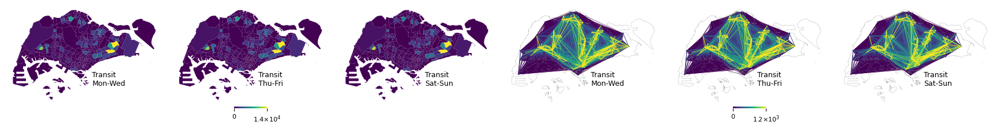

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_sgp_maps_intra_inter_1x6_VH.png


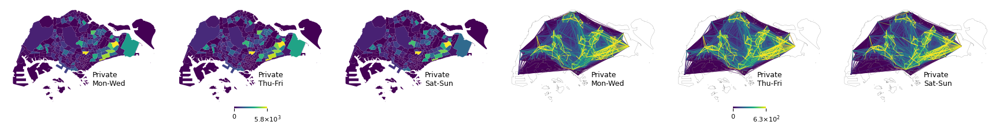

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_sgp_maps_intra_inter_1x6_WK.png


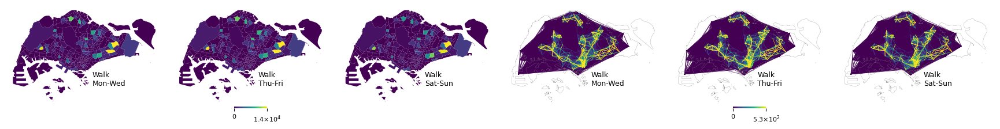

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_seoul_maps_intra_inter_1x6_PT.png


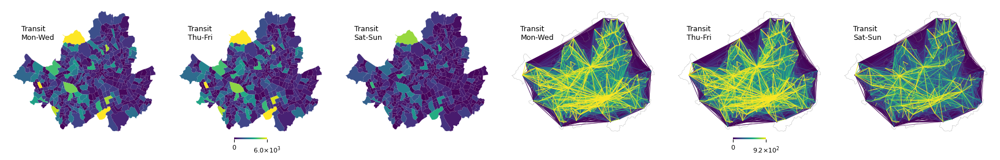

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_seoul_maps_intra_inter_1x6_VH.png


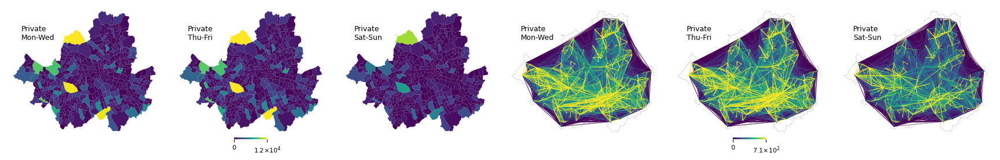

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/case_seoul_maps_intra_inter_1x6_WK.png


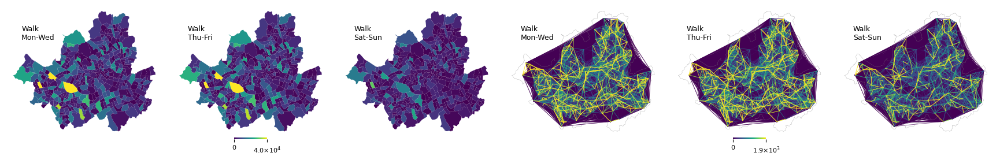

In [ ]:
# ======================================================
# Per-city: 3 separate ROW FIGURES (one per mode) — each row is a 1×6 grid
# Uses the plot/settings logic from your "hour figures" script:
#   - COLORS dict (intra/inter) kept
#   - rcParams font sizing applied
#   - rounding + thresholding (COUNT rounded; MIN_COUNT applied)
#   - map vmax via percentile (0.995) for intra/inter (like plot_maps_row)
#   - colormap = "viridis" (configurable)
#
# Output per city:
#   - 1 figure per mode (PT, VH, WK by default)
#   - Each figure: 1×6 = intra(mon_wed,thu_fri,sat_sun) + inter(mon_wed,thu_fri,sat_sun)
# ======================================================

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.gridspec import GridSpecFromSubplotSpec

# ======================================================
# Plot settings (FONT, SIZES) — from your provided template
# ======================================================
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 9,
    "axes.labelsize": 9,
    "axes.titlesize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 10,
    "axes.linewidth": 0.6,
    "savefig.dpi": 300,
})

# ======================================================
# Shared settings (colors, colormap, rounding, percentiles)
# ======================================================
COLORS = {"intra": "#B03A2E", "inter": "#1F4E79"}  # kept
color_map = "viridis"                              # kept (change if needed)

WEEK_DAYS = ["mon_wed", "thu_fri", "sat_sun"]
MODES = ["PT", "VH", "WK"]  # set to ["PT","VH"] if you want only 2 rows

MIN_COUNT = 0
ROUND_COUNTS = False

# percentile caps (match your map code style)
PCT_INTRA = 0.995
PCT_INTER = 0.995

# Layout (same “row-figure” convention)
ROW_FIG_LEFT, ROW_FIG_RIGHT, ROW_FIG_TOP, ROW_FIG_BOTTOM = 0.04, 0.99, 0.96, 0.06


# ======================================================
# Helpers (general) — same style as your template
# ======================================================
def sci_notation(val, prec=1):
    if val == 0:
        return "0"
    s = f"{float(val):.{prec}e}"
    base, exp = s.split("e")
    return rf"{base}×10$^{int(exp)}$"


def round_and_threshold_count(df: pd.DataFrame, *, min_count: float) -> pd.DataFrame:
    out = df.copy()
    if ROUND_COUNTS:
        out["COUNT"] = np.round(out["COUNT"])
    out = out[out["COUNT"] >= float(min_count)].copy()
    return out


def _mode_label(mode: str) -> str:
    if mode == "PT":
        return "Transit"
    if mode == "VH":
        return "Private"
    if mode == "WK":
        return "Walk"
    return mode


def _day_label(week_day: str) -> str:
    if week_day == "thu_fri":
        return "Thu-Fri"
    if week_day == "sat_sun":
        return "Sat-Sun"
    return "Mon-Wed"


def make_row_figure_1x6(*, figsize=(18.0, 3.2), wspace=0.06):
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(left=ROW_FIG_LEFT, right=ROW_FIG_RIGHT, top=ROW_FIG_TOP, bottom=ROW_FIG_BOTTOM)

    outer = fig.add_gridspec(nrows=1, ncols=1)
    gs = GridSpecFromSubplotSpec(1, 6, subplot_spec=outer[0], wspace=wspace)
    axes = [fig.add_subplot(gs[0, j]) for j in range(6)]
    return fig, axes


# ======================================================
# Geo loading (de-duplicated)
# ======================================================
def load_subzone_geo(reg: str):
    subzones = gpd.read_file(path_od_data + f"data_{reg}_subzone.shp")
    boundary = subzones.dissolve()

    centroids = subzones.copy()
    centroids["X"] = centroids.geometry.centroid.x
    centroids["Y"] = centroids.geometry.centroid.y
    centroids = centroids[["SUBZONE_C", "X", "Y"]]
    return subzones, boundary, centroids


# ======================================================
# Flow computation (same logic as your intra_zone_demand/inter_zone_demand)
# but centralized to avoid repetition
# ======================================================
def build_od_xy_from_mode(df: pd.DataFrame, *, mode: str, centroids: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()
    out["COUNT"] = out[f"{mode}_COUNT"]
    out = out[["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "COUNT"]].copy()

    out = out.merge(centroids, right_on="SUBZONE_C", left_on="ORIGIN_SUBZONE", how="left")
    out = out.drop(columns=["SUBZONE_C"]).rename(columns={"X": "ORIGIN_SUBZONE_X", "Y": "ORIGIN_SUBZONE_Y"})

    out = out.merge(centroids, right_on="SUBZONE_C", left_on="DESTINATION_SUBZONE", how="left")
    out = out.drop(columns=["SUBZONE_C"]).rename(columns={"X": "DESTINATION_SUBZONE_X", "Y": "DESTINATION_SUBZONE_Y"})

    grp_cols = [
        "ORIGIN_SUBZONE", "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE", "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
    ]
    out["COUNT"] = out.groupby(grp_cols)["COUNT"].transform("sum")
    out = out.drop_duplicates()

    out = out.dropna(subset=[
        "ORIGIN_SUBZONE_X", "ORIGIN_SUBZONE_Y",
        "DESTINATION_SUBZONE_X", "DESTINATION_SUBZONE_Y",
        "COUNT",
    ])
    out = out.sort_values("COUNT", ascending=False)
    return out


def split_intra_inter(df_xy: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    intra = df_xy[df_xy["ORIGIN_SUBZONE"] == df_xy["DESTINATION_SUBZONE"]].copy()
    inter = df_xy[df_xy["ORIGIN_SUBZONE"] != df_xy["DESTINATION_SUBZONE"]].copy()
    return intra, inter


# ======================================================
# Map plotters into existing axes (preserve your logic; add percentile vmax)
# ======================================================
def plot_intra_ax_map(ax, *, subzones_gdf, df_intra_xy, cmap_obj, norm):
    ax.set_axis_off()
    zone_sum = df_intra_xy.groupby("DESTINATION_SUBZONE")["COUNT"].sum()

    gdf = subzones_gdf.copy()
    gdf["COUNT"] = gdf["SUBZONE_C"].map(zone_sum).fillna(0.0)

    gdf.plot(
        column="COUNT",
        cmap=cmap_obj,
        norm=norm,
        ax=ax,
        edgecolor="none",
        linewidth=0,
        alpha=1.0,
        antialiased=True,
    )
    gdf.boundary.plot(ax=ax, color="none", linewidth=0.0)


def plot_inter_ax_map(ax, *, boundary_gdf, df_inter_xy, cmap_obj, norm):
    ax.set_axis_off()

    df_plot = df_inter_xy.sort_values("COUNT", ascending=True).copy()
    for _, row in df_plot.iterrows():
        x0, y0 = row["ORIGIN_SUBZONE_X"], row["ORIGIN_SUBZONE_Y"]
        x1, y1 = row["DESTINATION_SUBZONE_X"], row["DESTINATION_SUBZONE_Y"]
        ctrl_x, ctrl_y = (x0 + x1) / 2.0, (y0 + y1) / 2.0

        t = np.linspace(0, 1, 50)
        xs = (1 - t) ** 3 * x0 + 3 * (1 - t) ** 2 * t * ctrl_x + 3 * (1 - t) * t ** 2 * ctrl_x + t ** 3 * x1
        ys = (1 - t) ** 3 * y0 + 3 * (1 - t) ** 2 * t * ctrl_y + 3 * (1 - t) * t ** 2 * ctrl_y + t ** 3 * y1

        ax.plot(xs, ys, color=cmap_obj(norm(row["COUNT"])), linewidth=0.6, alpha=0.7, zorder=2)

    boundary_gdf.plot(ax=ax, color="none", edgecolor="gray", linewidth=0.2, zorder=3)


def add_horizontal_cbar(fig, *, sm, ax_list, vmax, pad=0.0):
    cbar = fig.colorbar(sm, ax=ax_list, orientation="horizontal", fraction=0.01, pad=pad)
    cbar.set_ticks([0, float(vmax)])
    cbar.set_ticklabels(["0", sci_notation(float(vmax), prec=1)])
    for spine in cbar.ax.spines.values():
        spine.set_visible(False)
    return cbar


# ======================================================
# One city + one mode => one 1×6 row figure
# ======================================================
def plot_city_mode_row_1x6(
    *,
    reg: str,
    mode: str,
    week_days: list[str],
    min_count: int,
    cmap_name: str,
    figsize=(18.0, 3.2),
    wspace=0.06,
    save_path: str | None = None,
):
    subzones, boundary, centroids = load_subzone_geo(reg)
    cmap_obj = cm.get_cmap(cmap_name)

    # --- first pass: load all day-groups for this mode and compute vmax via percentiles
    panels = {}  # wd -> {"intra": df, "inter": df}
    vmax_intra = 0.0
    vmax_inter = 0.0

    for wd in week_days:
        df_fus = pd.read_csv(path_od_result + f"case_{reg}_matrix_1.0_1.0_{wd}.csv")
        #df_fus = df_fus.sample(frac=0.01)

        df_xy = build_od_xy_from_mode(df_fus, mode=mode, centroids=centroids)
        intra, inter = split_intra_inter(df_xy)

        # rounding + threshold (as in your template)
        intra = round_and_threshold_count(intra, min_count=min_count)
        inter = round_and_threshold_count(inter, min_count=min_count)

        panels[wd] = {"intra": intra, "inter": inter}

        if len(intra):
            vmax_intra = max(vmax_intra, float(intra["COUNT"].quantile(PCT_INTRA)))
        if len(inter):
            vmax_inter = max(vmax_inter, float(inter["COUNT"].quantile(PCT_INTER)))

    vmax_intra = float(max(vmax_intra, 1.0))
    vmax_inter = float(max(vmax_inter, 1.0))

    norm_intra = Normalize(vmin=0, vmax=vmax_intra)
    norm_inter = Normalize(vmin=0, vmax=vmax_inter)

    # --- figure
    fig, axes = make_row_figure_1x6(figsize=figsize, wspace=wspace)

    txxx = 0.55
    tyyy = 0.35
    if reg=='seoul':
        txxx = 0.1
        tyyy = 0.85

    # intra: col 0-2
    for j, wd in enumerate(week_days):
        ax = axes[j]
        plot_intra_ax_map(
            ax,
            subzones_gdf=subzones,
            df_intra_xy=panels[wd]["intra"],
            cmap_obj=cmap_obj,
            norm=norm_intra,
        )
        ax.text(
            txxx, tyyy,
            f"{_mode_label(mode)}\n{_day_label(wd)}",
            transform=ax.transAxes,
            va="top",
        )

    # inter: col 3-5
    for j, wd in enumerate(week_days):
        ax = axes[3 + j]
        plot_inter_ax_map(
            ax,
            boundary_gdf=boundary,
            df_inter_xy=panels[wd]["inter"],
            cmap_obj=cmap_obj,
            norm=norm_inter,
        )
        ax.text(
            txxx, tyyy,
            f"{_mode_label(mode)}\n{_day_label(wd)}",
            transform=ax.transAxes,
            va="top",
        )

    # --- colorbars (match your “pair-of-panels” pattern; here: 3 intra, 3 inter)
    sm_intra = cm.ScalarMappable(norm=norm_intra, cmap=cmap_obj); sm_intra.set_array([])
    sm_inter = cm.ScalarMappable(norm=norm_inter, cmap=cmap_obj); sm_inter.set_array([])

    add_horizontal_cbar(fig, sm=sm_intra, ax_list=axes[:3], vmax=vmax_intra, pad=0.0)
    add_horizontal_cbar(fig, sm=sm_inter, ax_list=axes[3:], vmax=vmax_inter, pad=0.0)

    if save_path:
        fig.savefig(save_path, dpi=160, bbox_inches="tight")
        print("Saved:", save_path)

    plt.show()


# ======================================================
# Main: per city, 3 separate rows (one figure per mode)
# ======================================================
CITIES = [
    {"reg": "sgp", "tag": "sgp"},
    {"reg": "seoul", "tag": "seoul"},
]

for city in CITIES:
    reg = city["reg"]
    tag = city["tag"]

    for mode in MODES:
        out_file = path_od_figure + f"case_{tag}_maps_intra_inter_1x6_{mode}.png"
        plot_city_mode_row_1x6(
            reg=reg,
            mode=mode,
            week_days=WEEK_DAYS,
            min_count=MIN_COUNT,
            cmap_name=color_map,
            figsize=(18.0, 3.2),
            wspace=0.06,
            save_path=out_file,
        )


#SFig: Validation by time of day and location

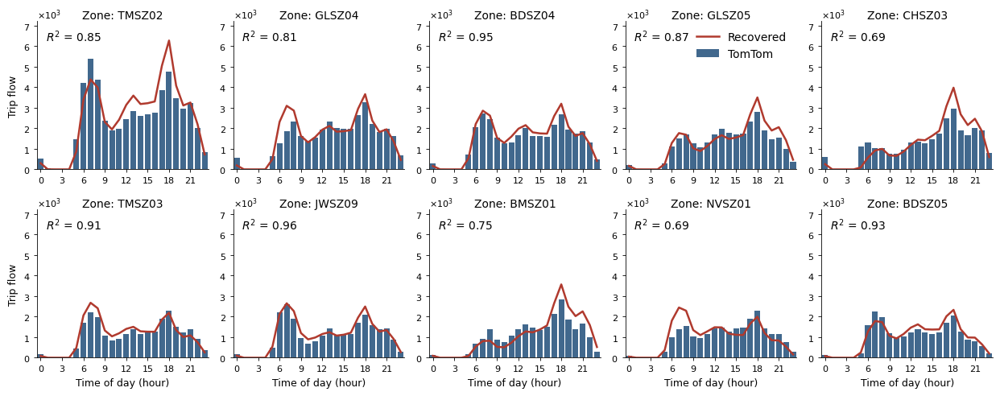

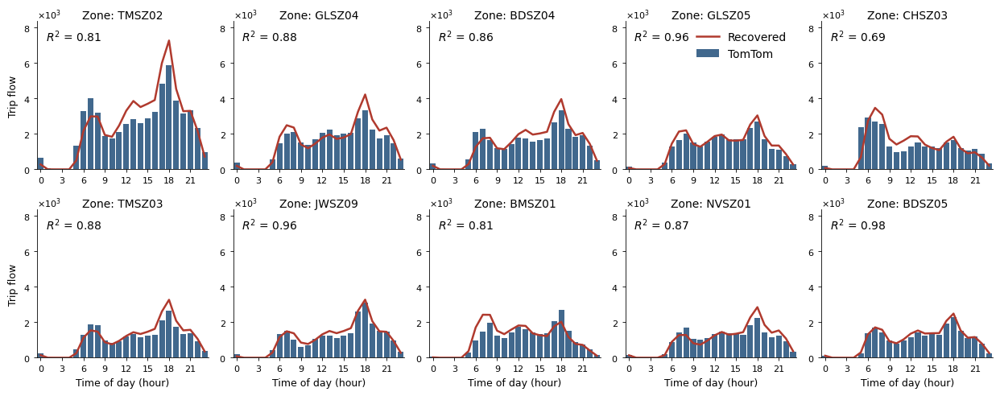

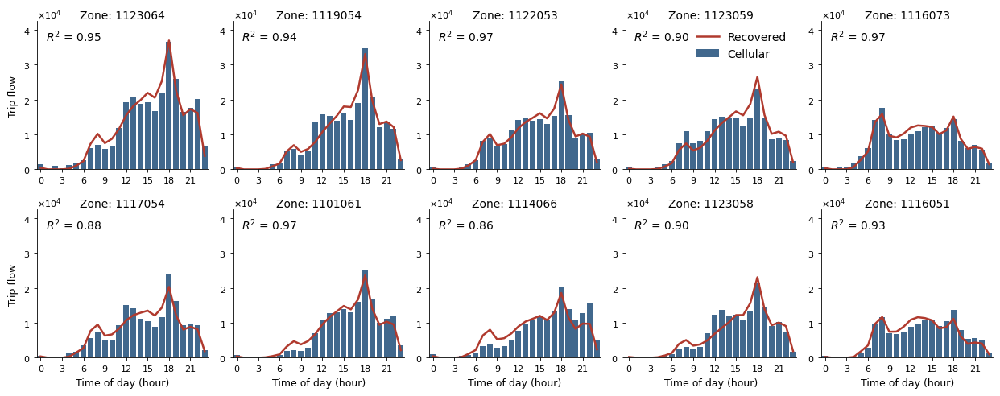

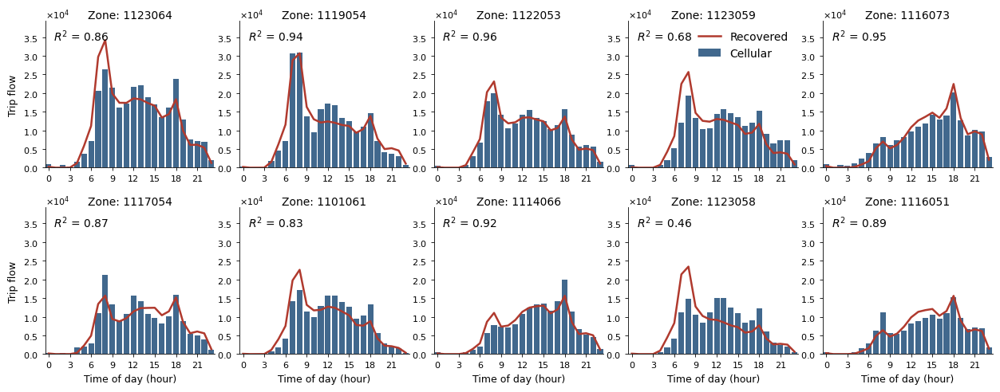

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter
from sklearn.metrics import r2_score

# ======================================================
# Settings (per your new style)
# ======================================================
COLOR_GT  = "#1F4E79"    # bars (ground truth)
COLOR_EST = "#B03A2E"    # line (estimated)

fig_x, fig_y = 2.5, 2.5
n = 10
wws = ["mon_wed", "thu_fri", "sat_sun"]
week_day = wws[0]

# Paths must exist in your environment:
# path_od_result, path_od_figure


# ======================================================
# Helpers (UNCHANGED)
# ======================================================
def _time_profile(df: pd.DataFrame, key_col: str, loc: str, count_col: str = "COUNT") -> pd.DataFrame:
    """24h profile, aggregated and reindexed to 0..23."""
    prof = (
        df.loc[df[key_col] == loc, ["TRIP_STARTTIME", count_col]]
          .groupby("TRIP_STARTTIME", as_index=True)[count_col]
          .sum()
          .reindex(range(24), fill_value=0)
          .reset_index()
          .rename(columns={count_col: "COUNT"})
    )
    return prof


def plot_departure_profile_ax(
    ax,
    df_est_24h: pd.DataFrame,
    df_gt_24h: pd.DataFrame,
    *,
    y_max: float,
    gt_label: str,
    est_label: str
):
    ax.bar(
        df_gt_24h["TRIP_STARTTIME"],
        df_gt_24h["COUNT"],
        width=0.8,
        color=COLOR_GT,
        alpha=0.85,
        label=gt_label,
        zorder=1,
    )

    ax.plot(
        df_est_24h["TRIP_STARTTIME"],
        df_est_24h["COUNT"],
        color=COLOR_EST,
        linewidth=1.8,
        label=est_label,
        zorder=2,
    )

    ax.set_xlim(-0.5, 23.5)
    ax.set_ylim(0, y_max * 1.15)

    ax.set_xlabel("Time of day (hour)")
    ax.set_ylabel("Trip flow")

    y_formatter = ScalarFormatter(useMathText=True)
    y_formatter.set_scientific(True)
    y_formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(y_formatter)

    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    ax.legend(loc="upper right", frameon=False, fontsize=10)

    r2 = r2_score(
        df_gt_24h["COUNT"].to_numpy(float),
        df_est_24h["COUNT"].to_numpy(float)
    )
    ax.text(
        0.05, 0.95,
        rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )


def make_2x5_grid(
    df_gt: pd.DataFrame,
    df_est: pd.DataFrame,
    *,
    zone_col: str,                 # 'ORIGIN_SUBZONE' or 'DESTINATION_SUBZONE'
    title: str,
    save_name: str,
    gt_label: str = "TomTom",
    est_label: str = "Recovered",
    y_max: float | None = 7.3e3,   # keep fixed; set None to auto
):
    # Top-N zones by total GT demand for that role
    top_zones = (
        df_gt.groupby(zone_col, as_index=False)["COUNT"]
             .sum()
             .sort_values("COUNT", ascending=False)
             .head(n)[zone_col]
             .to_numpy()
    )

    # Auto y_max if requested
    if y_max is None:
        peak = 0.0
        for loc in top_zones:
            gt_24h  = _time_profile(df_gt,  zone_col, loc, "COUNT")
            est_24h = _time_profile(df_est, zone_col, loc, "COUNT")
            peak = max(peak, float(gt_24h["COUNT"].max()), float(est_24h["COUNT"].max()))
        y_max = peak if peak > 0 else 1.0

    fig, axes = plt.subplots(2, 5, figsize=(fig_x * 5, fig_y * 2))
    axes = axes.ravel()

    for i, loc in enumerate(top_zones):
        ax = axes[i]

        gt_24h  = _time_profile(df_gt,  zone_col, loc, "COUNT")
        est_24h = _time_profile(df_est, zone_col, loc, "COUNT")

        plot_departure_profile_ax(
            ax,
            df_est_24h=est_24h,
            df_gt_24h=gt_24h,
            y_max=float(y_max),
            gt_label=gt_label,
            est_label=est_label,
        )

        ax.set_title(f"Zone: {loc}", fontsize=10, pad=2)

        if i % 5 != 0:
            ax.set_ylabel("")
        if i < 5:
            ax.set_xlabel("")

        # Keep legend only in panel index 3 (your original behavior)
        if i != 3:
            leg = ax.get_legend()
            if leg is not None:
                leg.remove()

    # fig.suptitle(title, y=1.02)
    fig.tight_layout()
    fig.savefig(path_od_figure + save_name, dpi=400, bbox_inches="tight")
    plt.show()


# ======================================================
# Loader (NEW, minimal)
# ======================================================
def load_case(region: str, week_day: str, *, gt_kind: str = "tomtom", est_count_col: str = "VH_COUNT"):
    """
    Returns (df_gt, df_est) ready for make_2x5_grid.
    - gt_kind: "tomtom" uses case_{region}_matrix_tomtom_{week_day}.csv
               "cellular" uses case_{region}_matrix_cellular.csv  (no week_day in name)
    - est_count_col: column to map to df_est["COUNT"] (e.g., VH_COUNT or COUNT)
    """
    if gt_kind == "tomtom":
        df_gt = pd.read_csv(path_od_result + f"case_{region}_matrix_tomtom_{week_day}.csv")
    elif gt_kind == "cellular":
        df_gt = pd.read_csv(path_od_result + f"case_{region}_matrix_cellular.csv")
    else:
        raise ValueError("gt_kind must be 'tomtom' or 'cellular'")

    df_est = pd.read_csv(path_od_result + f"case_{region}_matrix_1.0_1.0_{week_day}.csv")

    df_gt["TRIP_STARTTIME"] = df_gt["TRIP_STARTTIME"].astype(int)
    df_est["TRIP_STARTTIME"] = df_est["TRIP_STARTTIME"].astype(int)

    if est_count_col not in df_est.columns:
        raise ValueError(f"'{est_count_col}' not in df_est columns: {list(df_est.columns)}")

    df_est["COUNT"] = df_est[est_count_col]
    return df_gt, df_est


# ======================================================
# 1) Singapore
# ======================================================
reg = "sgp"
week_day = "mon_wed"

df_pcm, df_fus = load_case(reg, week_day, gt_kind="tomtom", est_count_col="VH_COUNT")

make_2x5_grid(
    df_gt=df_pcm,
    df_est=df_fus,
    zone_col="ORIGIN_SUBZONE",
    title=f"{reg.upper()} — Top {n} origins — {week_day}",
    save_name=f"case_time_{reg}_TOP{n}_ORIGIN_{week_day}.png",
    y_max=None,
)

make_2x5_grid(
    df_gt=df_pcm,
    df_est=df_fus,
    zone_col="DESTINATION_SUBZONE",
    title=f"{reg.upper()} — Top {n} destinations — {week_day}",
    save_name=f"case_time_{reg}_TOP{n}_DESTINATION_{week_day}.png",
    y_max=None,
)


# ======================================================
# 2) Seoul
# ======================================================

reg = "seoul"
week_day = "mon"
df_pcm, df_fus = load_case(reg, week_day, gt_kind="cellular", est_count_col="COUNT")
gt_label = "Cellular"

make_2x5_grid(
    df_gt=df_pcm,
    df_est=df_fus,
    zone_col="ORIGIN_SUBZONE",
    title=f"{reg.upper()} — Top {n} origins — {week_day}",
    save_name=f"case_time_{reg}_TOP{n}_ORIGIN_{week_day}.png",
    gt_label=gt_label,
    y_max=None,  # adjust if Seoul scale differs, or set None for auto
)

make_2x5_grid(
    df_gt=df_pcm,
    df_est=df_fus,
    zone_col="DESTINATION_SUBZONE",
    title=f"{reg.upper()} — Top {n} destinations — {week_day}",
    save_name=f"case_time_{reg}_TOP{n}_DESTINATION_{week_day}.png",
    gt_label=gt_label,
    y_max=None,  # adjust if Seoul scale differs, or set None for auto
)


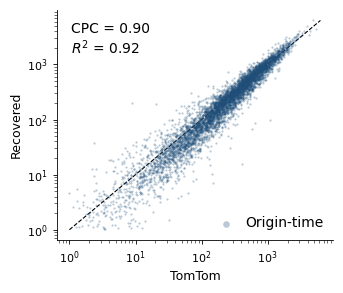

Validation Results:
- Region: sgp
- Attribute: Origin-time
- CPC: 0.9049
- R2: 0.9205
- Length: 5674


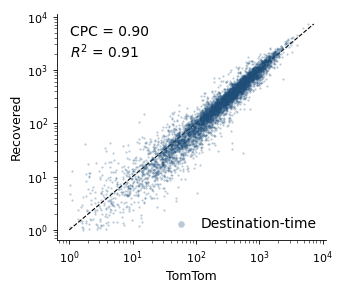

Validation Results:
- Region: sgp
- Attribute: Destination-time
- CPC: 0.9007
- R2: 0.9051
- Length: 5701


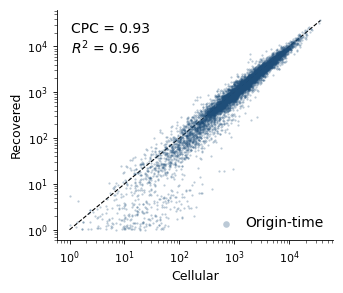

Validation Results:
- Region: seoul
- Attribute: Origin-time
- CPC: 0.9331
- R2: 0.9568
- Length: 8984


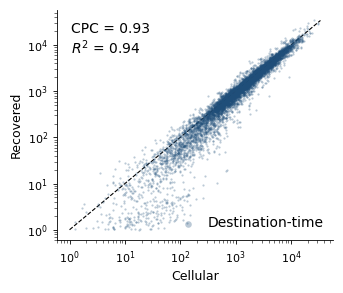

Validation Results:
- Region: seoul
- Attribute: Destination-time
- CPC: 0.9330
- R2: 0.9413
- Length: 8984


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from sklearn.metrics import r2_score

# ======================================================
# Global settings
# ======================================================
POINT_COLOR = "#1F4E79"          # requested single scatter color
FIG_SIZE = (3.5, 3.0)
CAP_VAL = 1.0                   # minimum count for log scale stability

# Paths must exist in your environment:
# path_od_result, path_od_figure


# ======================================================
# Scatter plot (learned styling) — single-color points
# ======================================================
def plot_scatter_log10_learned(
    pred_df: pd.DataFrame,
    true_df: pd.DataFrame,
    *,
    attributes: list,
    region: str,
    att_s: str,                 # "Origin-time" or "Destination-time"
    x_label: str,               # "TomTom" or "Cellular"
    y_label: str = "Recovered",
    max_val: float | None = None,
    point_color: str = POINT_COLOR,
    fig_size: tuple = FIG_SIZE,
    cap_val: float = CAP_VAL,
    show_legend: bool = False,
):
    """
    Scatter plot of predicted vs true counts aggregated by `attributes`
    with log10 axes. Styling aligned with your plot_od_scatter_ax snippet.
    """

    # ---- 1) Aggregate and deduplicate by attributes ----
    pred = pred_df[attributes + ["COUNT"]].copy()
    true = true_df[attributes + ["COUNT"]].copy()

    pred["COUNT"] = pred.groupby(attributes)["COUNT"].transform("sum")
    true["COUNT"] = true.groupby(attributes)["COUNT"].transform("sum")

    pred.drop_duplicates(inplace=True)
    true.drop_duplicates(inplace=True)

    # ---- 2) Filter to keep log-safe points ----
    if cap_val is not None:
        pred = pred[pred["COUNT"] >= cap_val]
        true = true[true["COUNT"] >= cap_val]

    # ---- 3) Merge on attributes ----
    df = pred.merge(true, on=attributes, suffixes=("_pred", "_true"))
    if len(df) == 0:
        raise ValueError(f"No matched rows after merge for region={region}, att_s={att_s}, attributes={attributes}")

    y_pred = df["COUNT_pred"].to_numpy(float)
    y_true = df["COUNT_true"].to_numpy(float)

    # ---- 4) Metrics (CPC + R2) ----
    denom = y_pred.sum() + y_true.sum()
    cpc = (2.0 * np.minimum(y_pred, y_true).sum() / denom) if denom > 0 else np.nan
    r2 = r2_score(y_true, y_pred) if len(df) > 1 else np.nan

    # ---- 5) Plot ----
    fig, ax = plt.subplots(figsize=fig_size)

    ax.scatter(
        y_true,
        y_pred,
        s=2.5,
        alpha=0.30,
        color=point_color,
        linewidths=0,
        zorder=2,
        label=att_s,
    )

    vmax = float(max_val) if max_val is not None else float(max(y_true.max(), y_pred.max()))
    ax.plot([1, vmax], [1, vmax], linestyle="--", color="black", linewidth=0.8, zorder=1)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())

    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    ax.text(
        0.05, 0.95,
        rf"CPC = {cpc:.2f}" + "\n" + rf"$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=10,
    )

    plt.tight_layout()

    # File naming (your convention)
    if att_s == "Origin-time":
        fname = f"case_validation_{region}_orig_time.png"
    elif att_s == "Destination-time":
        fname = f"case_validation_{region}_dest_time.png"
    else:
        fname = f"case_validation_{region}_{att_s}.png"

    plt.savefig(path_od_figure + fname, dpi=400, bbox_inches="tight")
    plt.show()

    print(
        "Validation Results:\n"
        f"- Region: {region}\n"
        f"- Attribute: {att_s}\n"
        f"- CPC: {cpc:.4f}\n"
        f"- R2: {r2:.4f}\n"
        f"- Length: {len(df)}"
    )

    return cpc


# ======================================================
# Utility: compute max_val consistently
# ======================================================
def compute_max_val(pred_df: pd.DataFrame, true_df: pd.DataFrame, attributes: list, cap_val: float = CAP_VAL) -> float:
    """
    Computes max aggregated COUNT among pred/true after applying cap_val,
    used to set the 1:1 line extent consistently.
    """
    p = pred_df[attributes + ["COUNT"]].copy()
    t = true_df[attributes + ["COUNT"]].copy()

    p["COUNT"] = p.groupby(attributes)["COUNT"].transform("sum")
    t["COUNT"] = t.groupby(attributes)["COUNT"].transform("sum")

    p.drop_duplicates(inplace=True)
    t.drop_duplicates(inplace=True)

    if cap_val is not None:
        p = p[p["COUNT"] >= cap_val]
        t = t[t["COUNT"] >= cap_val]

    max_p = float(p["COUNT"].max()) if len(p) else 1.0
    max_t = float(t["COUNT"].max()) if len(t) else 1.0
    return max(max_p, max_t)


# ======================================================
# Loaders (match your file naming conventions)
# ======================================================
def load_gt(region: str, week_day: str, gt_source: str) -> pd.DataFrame:
    """
    gt_source:
      - "tomtom": case_{region}_matrix_tomtom_{week_day}.csv
      - "cellular": case_{region}_matrix_cellular.csv
    """
    if gt_source == "tomtom":
        return pd.read_csv(path_od_result + f"case_{region}_matrix_tomtom_{week_day}.csv")
    if gt_source == "cellular":
        return pd.read_csv(path_od_result + f"case_{region}_matrix_cellular.csv")
    raise ValueError("gt_source must be 'tomtom' or 'cellular'")


def load_est(region: str, week_day: str) -> pd.DataFrame:
    return pd.read_csv(path_od_result + f"case_{region}_matrix_1.0_1.0_{week_day}.csv")


# ======================================================
# Run: 4 separate plots
#   - SGP: origin-time + destination-time (TomTom vs Estimated(VH_COUNT))
#   - SEOUL: origin-time + destination-time (Cellular vs Estimated(COUNT))
# ======================================================
def run_4_scatter_plots():
    model = "xgboost"   # kept for compatibility; not used in the plot function
    k = "1.0"           # kept for compatibility; not used in the plot function

    # Attributes
    att_origin = ["ORIGIN_SUBZONE", "TRIP_STARTTIME"]
    att_dest   = ["DESTINATION_SUBZONE", "TRIP_STARTTIME"]

    # ----------------------------
    # Singapore (TomTom)
    # ----------------------------
    reg = "sgp"
    week_day = "mon_wed"

    true_df = load_gt(reg, week_day, gt_source="tomtom")
    pred_df = load_est(reg, week_day)
    pred_df["COUNT"] = pred_df["VH_COUNT"]

    # Origin-time
    max_val = compute_max_val(pred_df, true_df, att_origin, cap_val=CAP_VAL)
    plot_scatter_log10_learned(
        pred_df, true_df,
        attributes=att_origin,
        region=reg,
        att_s="Origin-time",
        x_label="TomTom",
        max_val=max_val,
        point_color=POINT_COLOR,
        fig_size=FIG_SIZE,
        cap_val=CAP_VAL,
        show_legend=True,
    )

    # Destination-time
    max_val = compute_max_val(pred_df, true_df, att_dest, cap_val=CAP_VAL)
    plot_scatter_log10_learned(
        pred_df, true_df,
        attributes=att_dest,
        region=reg,
        att_s="Destination-time",
        x_label="TomTom",
        max_val=max_val,
        point_color=POINT_COLOR,
        fig_size=FIG_SIZE,
        cap_val=CAP_VAL,
        show_legend=True,
    )

    # ----------------------------
    # Seoul (Cellular)
    # ----------------------------
    reg = "seoul"
    week_day = "mon"

    true_df = load_gt(reg, week_day, gt_source="cellular")
    pred_df = load_est(reg, week_day)
    pred_df["COUNT"] = pred_df["COUNT"]  # explicit for clarity

    # Origin-time
    max_val = compute_max_val(pred_df, true_df, att_origin, cap_val=CAP_VAL)
    plot_scatter_log10_learned(
        pred_df, true_df,
        attributes=att_origin,
        region=reg,
        att_s="Origin-time",
        x_label="Cellular",
        max_val=max_val,
        point_color=POINT_COLOR,
        fig_size=FIG_SIZE,
        cap_val=CAP_VAL,
        show_legend=True,
    )

    # Destination-time
    max_val = compute_max_val(pred_df, true_df, att_dest, cap_val=CAP_VAL)
    plot_scatter_log10_learned(
        pred_df, true_df,
        attributes=att_dest,
        region=reg,
        att_s="Destination-time",
        x_label="Cellular",
        max_val=max_val,
        point_color=POINT_COLOR,
        fig_size=FIG_SIZE,
        cap_val=CAP_VAL,
        show_legend=True,
    )


# ======================================================
# Execute
# ======================================================
run_4_scatter_plots()


#SFig: Smart-card transit demand only

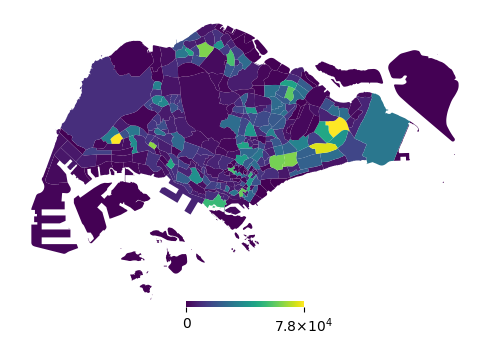

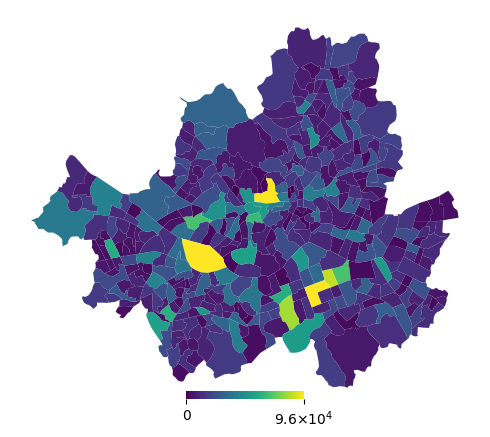

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def _sci_notation(x, prec=1):
    if x is None or pd.isna(x) or x == 0:
        return "0"
    import math
    exp = int(math.floor(math.log10(abs(x))))
    mant = x / (10 ** exp)
    return rf"{mant:.{prec}f}×10$^{exp}$"

def plot_subzone(
    dfz,
    reg,
    max_prob=None,
    *,
    shp_path=None,            # e.g., path_od_data + f"data_{reg}_subzone.shp"
    id_col="SUBZONE_C",       # ID column in the shapefile
    value_col="COUNT",        # name used inside the plot for values
    df_id_col=None,           # if dfz is a DataFrame, its ID column (e.g., "ORIGIN_SUBZONE")
    df_value_col=None,        # if dfz is a DataFrame, its value column (e.g., "COUNT")
    cmap_name="gist_heat_r",
    fig_size=(4, 4)
):
    """
    Plots subzones colored by continuous values. Missing zones get value 0.
    Colorbar inside plot shows only 0 and max (scientific-style label).
    """

    # ---- 0) Resolve shapefile path ----
    if shp_path is None:
        # Falls back to globals if not provided
        shp_path = path_od_data + f"data_{reg}_subzone.shp"

    # ---- 1) Load subzones ----
    gdf = gpd.read_file(shp_path)

    # ---- 2) Build mapping from dfz ----
    if isinstance(dfz, (pd.Series, dict)):
        mapping = dict(dfz) if isinstance(dfz, pd.Series) else dfz
    elif isinstance(dfz, pd.DataFrame):
        # Try to infer id/value columns if not given
        _id = df_id_col
        _val = df_value_col
        if _id is None or _val is None:
            # heuristic: prefer provided defaults or common names
            candidates_id = [df_id_col, "SUBZONE_C", "ORIGIN_SUBZONE", "ZONE", "ID"]
            candidates_val = [df_value_col, "COUNT", "VAL", "VALUE"]
            _id = next(c for c in candidates_id if c is not None and c in dfz.columns)
            _val = next(c for c in candidates_val if c is not None and c in dfz.columns)
        mapping = dfz.set_index(_id)[_val].to_dict()
    else:
        raise TypeError("dfz must be a pandas DataFrame, Series, or dict.")

    # Ensure type compatibility for keys (int vs str)
    # If gdf[id_col] is numeric, coerce mapping keys to numeric where possible
    if pd.api.types.is_integer_dtype(gdf[id_col]) or pd.api.types.is_numeric_dtype(gdf[id_col]):
        try:
            mapping = {int(k): v for k, v in mapping.items()}
        except Exception:
            pass  # keep as-is if conversion fails

    # ---- 3) Map values, fill missing with zero ----
    gdf[value_col] = gdf[id_col].map(mapping).fillna(0)

    # ---- 4) Normalization ----
    data_max = float(gdf[value_col].quantile(0.995)) if len(gdf) else 0.0
    if max_prob is None:
        max_prob = data_max
    # Avoid a degenerate norm if all zeros
    if max_prob <= 0:
        max_prob = 1.0
    norm = Normalize(vmin=0, vmax=max_prob)
    cmap = cm.get_cmap(cmap_name)

    # ---- 5) Plot ----
    fig, ax = plt.subplots(figsize=fig_size)
    ax.set_axis_off()

    gdf.plot(
        column=value_col,
        cmap=cmap,
        norm=norm,
        ax=ax,
        edgecolor="none",
        linewidth=0,
        alpha=1.0,
        antialiased=True
    )

    # Optional: overlay boundaries (invisible edgecolor above already hides outlines)
    # gdf.boundary.plot(ax=ax, color='none', linewidth=0.0)

    # ---- Colorbar inside ----
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cax = inset_axes(ax, width="25%", height="2%", loc="lower center", borderpad=0.5)
    cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")

    # Only 0 and max
    cbar.set_ticks([0, max_prob])
    cbar.set_ticklabels(["0", _sci_notation(max_prob, prec=1)])

    # Remove border
    for spine in cbar.ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()
    out_path = path_od_figure + f"case_{reg}_origin_transit.png"
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.show()

#########################################

color_map = 'viridis' #'autumn_r'#'gist_heat_r'#'plasma' #'Spectral_r'#'viridis'# #gist_heat_r

fig_x = 5
fig_y = 5


reg = 'sgp'
df_fus = pd.read_csv(path_od_result + f'case_{reg}_matrix_1.0_1.0_mon_wed.csv')
df_fus['COUNT'] = df_fus['PT_COUNT']
df_fus = df_fus[['ORIGIN_SUBZONE', 'COUNT']]
df_fus['COUNT'] = df_fus.groupby(['ORIGIN_SUBZONE'])['COUNT'].transform('sum')
df_fus.drop_duplicates(inplace = True)
plot_subzone(
    df_fus,
    reg=reg,
    shp_path=path_od_data + f'data_{reg}_subzone.shp',
    df_id_col='ORIGIN_SUBZONE',
    df_value_col='COUNT',
    cmap_name=color_map,
    fig_size=(fig_x, fig_y)
)


reg = 'seoul'
df_fus = pd.read_csv(path_od_result + f'case_{reg}_matrix_1.0_1.0_mon.csv')
df_fus['COUNT'] = df_fus['PT_COUNT']
df_fus = df_fus[['ORIGIN_SUBZONE', 'COUNT']]
df_fus['COUNT'] = df_fus.groupby(['ORIGIN_SUBZONE'])['COUNT'].transform('sum')
df_fus.drop_duplicates(inplace = True)

plot_subzone(
    df_fus,
    reg=reg,
    shp_path=path_od_data + f'data_{reg}_subzone.shp',
    df_id_col='ORIGIN_SUBZONE',
    df_value_col='COUNT',
    cmap_name=color_map,
    fig_size=(fig_x, fig_y)
)


# SFig: Unscaled TomTom + Cellular

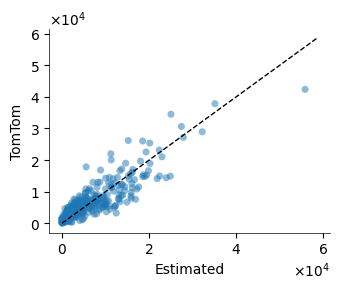

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from matplotlib.ticker import FuncFormatter

# --- Load data ---
tomtom_scale_df = pd.read_csv(path_od_result + 'case_sgp_matrix_tomtom_mon_wed.csv')
tomtom_no_scale_df = pd.read_csv(path_od_data + 'data_sgp_pcm_2022_period_mon_wed.csv')
tomtom_no_scale_df = tomtom_no_scale_df.merge(
    tomtom_scale_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME']].drop_duplicates()
)
spatial_marginal_df = pd.read_csv(path_od_result + 'prior_sgp_trip_generation_VH_mon.csv')

# --- Aggregate spatial counts ---
sptial_tomtom_scale_df = (
    tomtom_scale_df.groupby("ORIGIN_SUBZONE", as_index=False)["COUNT"].sum()
)
sptial_tomtom_no_scale_df = (
    tomtom_no_scale_df.groupby("ORIGIN_SUBZONE", as_index=False)["COUNT"].sum()
)

# --- Rescale function ---
def rescale_to_match(df_target, df_ref, col="COUNT"):
    df = df_target.copy()
    factor = df_ref[col].sum() / df[col].sum()
    df[col] = df[col] * factor
    return df

# --- Rescale TomTom datasets to match marginal total ---
sptial_tomtom_scale_rescaled = rescale_to_match(sptial_tomtom_scale_df, spatial_marginal_df)
sptial_tomtom_no_scale_rescaled = rescale_to_match(sptial_tomtom_no_scale_df, spatial_marginal_df)

# --- Merge with marginal ---
df_scale = sptial_tomtom_scale_rescaled.merge(
    spatial_marginal_df, on="ORIGIN_SUBZONE", suffixes=("_tomtom_scale", "_marginal")
)
df_no_scale = sptial_tomtom_no_scale_rescaled.merge(
    spatial_marginal_df, on="ORIGIN_SUBZONE", suffixes=("_tomtom_no_scale", "_marginal")
)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

# Example color palette
colors = ["#1f77b4", "#ff7f0e"]
fig_x, fig_y = 3.5, 3

def plot_spatial_scatter(df_tomtom, df_marginal, tomtom_label, fname, path_od_figure):
    """
    Minimal scatter plot of TomTom vs Marginal spatial totals (per ORIGIN_SUBZONE).
    Shows only scatter points and 45° line. Axes use scientific notation like plot_departure.
    """
    # --- Merge ---
    merged_df = df_tomtom.merge(
        df_marginal, on="ORIGIN_SUBZONE", suffixes=("_tomtom", "_marginal")
    )
    merged_df['PROB_pred'] = merged_df['COUNT_tomtom']
    merged_df['PROB_true'] = merged_df['COUNT_marginal']

    # --- Plot ---
    plt.figure(figsize=(fig_x, fig_y))
    plt.scatter(
        merged_df['PROB_true'], merged_df['PROB_pred'],
        s=26, alpha=0.5, color=colors[0], edgecolor="none"
    )

    max_val = max(merged_df['PROB_true'].max(), merged_df['PROB_pred'].max())
    plt.plot([0, max_val*1.05], [0, max_val*1.05],
             color="black", linestyle="--", linewidth=1)

    # Equal axis scaling
    #plt.axis("equal")

    # Clean axes
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

    # Labels
    plt.xlabel("Estimated")
    plt.ylabel(tomtom_label)

    # --- Apply scientific formatter like plot_departure ---
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))   # always scientific notation
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)

    plt.tight_layout()
    plt.savefig(path_od_figure + fname, dpi=200, bbox_inches='tight')
    plt.show()



# Scaled vs Marginal
'''plot_spatial_scatter(
    sptial_tomtom_scale_rescaled.rename(columns={"COUNT":"COUNT_tomtom"}),
    spatial_marginal_df.rename(columns={"COUNT":"COUNT_marginal"}),
    tomtom_label="TomTom (IPF)",
    fname="case_spatial_scaled_vs_marginal.png",
    path_od_figure=path_od_figure
)'''

# No-scale vs Marginal
plot_spatial_scatter(
    sptial_tomtom_no_scale_rescaled.rename(columns={"COUNT":"COUNT_tomtom"}),
    spatial_marginal_df.rename(columns={"COUNT":"COUNT_marginal"}),
    tomtom_label="TomTom",
    fname="sgp_spatial_noscale_vs_marginal.png",
    path_od_figure=path_od_figure
)




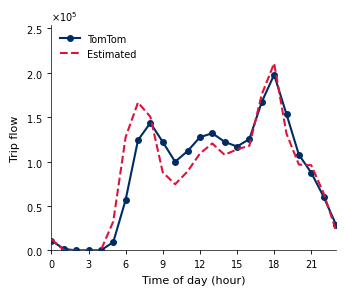

Rescale factor (no-scale -> marginal): 1.1834
Rescale factor (scaled  -> marginal): 0.9756


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, MaxNLocator

# --- Global settings ---
colors = ['crimson', '#002C64']   # Marginal, TomTom
fig_x = 3.5
fig_y = 3

# --- Load data ---
tomtom_scale_df = pd.read_csv(path_od_result + 'case_sgp_matrix_tomtom_mon_wed.csv')
tomtom_no_scale_df = pd.read_csv(path_od_data + 'data_sgp_pcm_2022_period_mon_wed.csv')
tomtom_no_scale_df = tomtom_no_scale_df.merge(
    tomtom_scale_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME']].drop_duplicates()
)

spatial_marginal_df = pd.read_csv(path_od_result + 'prior_sgp_trip_generation_VH_mon.csv')
temporal_marginal_df = pd.read_csv(path_od_result + 'prior_sgp_departure_time_VH_mon.csv')

# --- Aggregate temporal totals (0–23) ---
temporal_tomtom_scale_df = tomtom_scale_df[['TRIP_STARTTIME', 'COUNT']].copy()
temporal_tomtom_scale_df['COUNT'] = temporal_tomtom_scale_df.groupby('TRIP_STARTTIME')['COUNT'].transform('sum')
temporal_tomtom_scale_df = temporal_tomtom_scale_df.drop_duplicates().sort_values('TRIP_STARTTIME').reset_index(drop=True)

temporal_tomtom_no_scale_df = tomtom_no_scale_df[['TRIP_STARTTIME', 'COUNT']].copy()
temporal_tomtom_no_scale_df['COUNT'] = temporal_tomtom_no_scale_df.groupby('TRIP_STARTTIME')['COUNT'].transform('sum')
temporal_tomtom_no_scale_df = temporal_tomtom_no_scale_df.drop_duplicates().sort_values('TRIP_STARTTIME').reset_index(drop=True)

temporal_marginal_df = temporal_marginal_df[['TRIP_STARTTIME','COUNT']].copy()
temporal_marginal_df = temporal_marginal_df.groupby('TRIP_STARTTIME', as_index=False)['COUNT'].sum()
temporal_marginal_df = temporal_marginal_df.sort_values('TRIP_STARTTIME').reset_index(drop=True)

# --- Rescale helper: match total of target to reference total ---
def rescale_to_match_total(df_target, df_ref, col='COUNT'):
    df = df_target.copy()
    t_sum = df[col].sum()
    r_sum = df_ref[col].sum()
    factor = (r_sum / t_sum) if t_sum != 0 else 1.0
    df[col] = df[col] * factor
    return df, factor

# Rescale TomTom series to marginal totals BEFORE comparison
temporal_tomtom_no_scale_rescaled, f_no = rescale_to_match_total(temporal_tomtom_no_scale_df, temporal_marginal_df)
temporal_tomtom_scale_rescaled,    f_sc = rescale_to_match_total(temporal_tomtom_scale_df,    temporal_marginal_df)

# --- Temporal plotting function ---
def plot_temporal_comparison(df_tomtom, df_marginal, label_tomtom, fname, path_od_figure, maxz=None):
    """
    Plot line graph comparing temporal TomTom (rescaled) vs temporal marginal counts.
    """
    plt.figure(figsize=(fig_x, fig_y))

    # TomTom (already rescaled)
    plt.plot(df_tomtom['TRIP_STARTTIME'], df_tomtom['COUNT'],
             color=colors[1], marker='o', markersize=4,
             linewidth=1.5, label=label_tomtom, zorder=3)

    # Marginal
    plt.plot(df_marginal['TRIP_STARTTIME'], df_marginal['COUNT'],
             color=colors[0], linestyle='--', linewidth=1.5,
             label="Estimated", zorder=3)

    # Axes setup
    ax = plt.gca()
    if maxz is None:
        maxz = max(df_tomtom['COUNT'].max(), df_marginal['COUNT'].max())
    ax.set_ylim(0, maxz * 1.2)
    ax.set_xlim(0, 23)

    # Y-axis scientific formatting
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(formatter)

    # Clean style
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

    # Force integer x ticks (hours)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.xlabel("Time of day (hour)")
    plt.ylabel("Trip flow")

    # Legend top-left, no frame
    plt.legend(loc="upper left", frameon=False)

    plt.tight_layout()
    plt.savefig(path_od_figure + fname, dpi=200, bbox_inches="tight")
    plt.show()

# --- Common y-limit so the two plots are directly comparable ---
common_max = max(
    temporal_tomtom_no_scale_rescaled['COUNT'].max(),
    temporal_tomtom_scale_rescaled['COUNT'].max(),
    temporal_marginal_df['COUNT'].max()
)

# --- Run plots (using RESCALED TomTom series) ---

# No-scale vs marginal (rescaled)
plot_temporal_comparison(
    temporal_tomtom_no_scale_rescaled,
    temporal_marginal_df,
    label_tomtom="TomTom",
    fname="sgp_temporal_noscale_vs_marginal_rescaled.png",
    path_od_figure=path_od_figure,
    maxz=common_max
)

# Scaled vs marginal (rescaled)
'''plot_temporal_comparison(
    temporal_tomtom_scale_rescaled,
    temporal_marginal_df,
    label_tomtom="TomTom",
    fname="sgp_temporal_scaled_vs_marginal_rescaled.png",
    path_od_figure=path_od_figure,
    maxz=common_max
)
'''
# Optional: print scale factors for transparency
print(f"Rescale factor (no-scale -> marginal): {f_no:.4f}")
print(f"Rescale factor (scaled  -> marginal): {f_sc:.4f}")


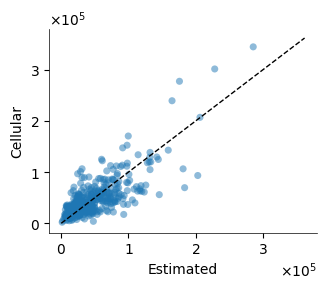

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter

# --- Load data ---
cellular_scale_df = pd.read_csv(path_od_result + 'case_seoul_matrix_cellular.csv')
cellular_no_scale_df = pd.read_csv(path_od_data + 'data_seoul_pcm_2021_period.csv')
cellular_no_scale_df = cellular_no_scale_df.merge(
    cellular_scale_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME']].drop_duplicates()
)

od_demand_df_VH = pd.read_csv(path_od_result + 'prior_seoul_trip_generation_VH_mon.csv')
od_demand_df_WK = pd.read_csv(path_od_result + 'prior_seoul_trip_generation_WK_mon.csv')
od_demand_df_PT = pd.read_csv(path_od_result + 'prior_seoul_trip_generation_PT_mon.csv')

# Aggregate OD demand into marginal totals
spatial_marginal_df = (
    pd.concat([od_demand_df_VH, od_demand_df_WK, od_demand_df_PT])
    .groupby(['ORIGIN_SUBZONE'], as_index=False)['COUNT']
    .sum()
)
spatial_marginal_df.drop_duplicates(inplace=True)

# --- Aggregate spatial counts ---
spatial_cellular_scale_df = (
    cellular_scale_df.groupby("ORIGIN_SUBZONE", as_index=False)["COUNT"].sum()
)
spatial_cellular_no_scale_df = (
    cellular_no_scale_df.groupby("ORIGIN_SUBZONE", as_index=False)["COUNT"].sum()
)

# --- Rescale function ---
def rescale_to_match(df_target, df_ref, col="COUNT"):
    df = df_target.copy()
    factor = df_ref[col].sum() / df[col].sum()
    df[col] = df[col] * factor
    return df

# --- Rescale cellular datasets to match marginal total ---
spatial_cellular_scale_rescaled = rescale_to_match(spatial_cellular_scale_df, spatial_marginal_df)
spatial_cellular_no_scale_rescaled = rescale_to_match(spatial_cellular_no_scale_df, spatial_marginal_df)

# --- Scatter plot function ---
colors = ["#1f77b4", "#ff7f0e"]
fig_x, fig_y = 3.5, 3

def plot_spatial_scatter(df_cellular, df_marginal, cellular_label, fname, path_od_figure):
    """
    Minimal scatter plot of Cellular vs Marginal spatial totals (per ORIGIN_SUBZONE).
    Shows only scatter points and 45° line. Axes use scientific notation.
    """
    # --- Merge ---
    merged_df = df_cellular.merge(
        df_marginal, on="ORIGIN_SUBZONE", suffixes=("_cellular", "_marginal")
    )
    merged_df['PROB_pred'] = merged_df['COUNT_cellular']
    merged_df['PROB_true'] = merged_df['COUNT_marginal']

    # --- Plot ---
    plt.figure(figsize=(fig_x, fig_y))
    plt.scatter(
        merged_df['PROB_true'], merged_df['PROB_pred'],
        s=26, alpha=0.5, color=colors[0], edgecolor="none"
    )

    max_val = max(merged_df['PROB_true'].max(), merged_df['PROB_pred'].max())
    plt.plot([0, max_val*1.05], [0, max_val*1.05],
             color="black", linestyle="--", linewidth=1)

    # Equal axis scaling
    #plt.axis("equal")

    # Clean axes
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

    # Labels
    plt.xlabel("Estimated")
    plt.ylabel(cellular_label)

    # --- Apply scientific formatter ---
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))   # always scientific notation
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)

    plt.tight_layout()
    plt.savefig(path_od_figure + fname, dpi=200, bbox_inches='tight')
    plt.show()

# --- Run plots ---
# No-scale vs Marginal
plot_spatial_scatter(
    spatial_cellular_no_scale_rescaled.rename(columns={"COUNT":"COUNT_cellular"}),
    spatial_marginal_df.rename(columns={"COUNT":"COUNT_marginal"}),
    cellular_label="Cellular",
    fname="seoul_spatial_noscale_vs_marginal.png",
    path_od_figure=path_od_figure
)


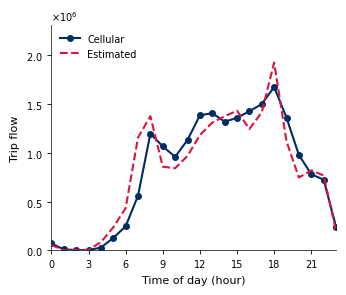

Fit factor (no-IPF → marginal total): 0.0528
Fit factor (IPF → marginal total):    1.0000


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, MaxNLocator

# --- Global settings (match your reference style) ---
colors = ['crimson', '#002C64']   # Marginal = crimson, Cellular = deep blue
fig_x = 3.5
fig_y = 3

# ======================
# 1) Load Seoul datasets
# ======================
cellular_scale_df = pd.read_csv(path_od_result + 'case_seoul_matrix_cellular.csv')
cellular_no_scale_df = pd.read_csv(path_od_data   + 'data_seoul_pcm_2021_period.csv')
# Keep same OD-time domain as the IPF output
cellular_no_scale_df = cellular_no_scale_df.merge(
    cellular_scale_df[['ORIGIN_SUBZONE','DESTINATION_SUBZONE','TRIP_STARTTIME']].drop_duplicates()
)

# Temporal marginals (sum across modes VH, WK, PT per hour)
temporal_marginal_vh = pd.read_csv(path_od_result + 'prior_seoul_departure_time_VH_mon.csv')
temporal_marginal_wk = pd.read_csv(path_od_result + 'prior_seoul_departure_time_WK_mon.csv')
temporal_marginal_pt = pd.read_csv(path_od_result + 'prior_seoul_departure_time_PT_mon.csv')

temporal_marginal_df = (
    pd.concat([temporal_marginal_vh, temporal_marginal_wk, temporal_marginal_pt], ignore_index=True)
      .groupby('TRIP_STARTTIME', as_index=False)['COUNT'].sum()
      .sort_values('TRIP_STARTTIME')
      .reset_index(drop=True)
)

# ======================================
# 2) Aggregate temporal totals (0–23 hrs)
# ======================================
temporal_cellular_scale_df = cellular_scale_df[['TRIP_STARTTIME','COUNT']].copy()
temporal_cellular_scale_df['COUNT'] = temporal_cellular_scale_df.groupby('TRIP_STARTTIME')['COUNT'].transform('sum')
temporal_cellular_scale_df = (temporal_cellular_scale_df
                              .drop_duplicates()
                              .sort_values('TRIP_STARTTIME')
                              .reset_index(drop=True))

temporal_cellular_no_scale_df = cellular_no_scale_df[['TRIP_STARTTIME','COUNT']].copy()
temporal_cellular_no_scale_df['COUNT'] = temporal_cellular_no_scale_df.groupby('TRIP_STARTTIME')['COUNT'].transform('sum')
temporal_cellular_no_scale_df = (temporal_cellular_no_scale_df
                                 .drop_duplicates()
                                 .sort_values('TRIP_STARTTIME')
                                 .reset_index(drop=True))

# ======================================
# 3) Fit totals (match each series to marginal total)
# ======================================
def fit_total_to_marginal(df_target, df_ref, col='COUNT'):
    """Return df_target with COUNT scaled so sum matches df_ref."""
    df = df_target.copy()
    t_sum = float(df[col].sum())
    r_sum = float(df_ref[col].sum())
    factor = (r_sum / t_sum) if t_sum != 0 else 1.0
    df[col] = df[col] * factor
    return df, factor

temporal_cellular_noIPF_fitted, f_noipf = fit_total_to_marginal(temporal_cellular_no_scale_df, temporal_marginal_df)
temporal_cellular_IPF_fitted,  f_ipf   = fit_total_to_marginal(temporal_cellular_scale_df,    temporal_marginal_df)

# Optional: a common ymax so both plots are directly comparable
common_max = max(
    temporal_cellular_noIPF_fitted['COUNT'].max(),
    temporal_cellular_IPF_fitted['COUNT'].max(),
    temporal_marginal_df['COUNT'].max()
)

# ============================================
# 4) Plotting function (same style as reference)
# ============================================
def plot_temporal_comparison(df_cell, df_marginal, label_cell, fname, path_od_figure, maxz=None):
    """
    Line graph comparing temporal Cellular vs temporal marginal counts (Seoul).
    - colors[0] = Marginal (crimson, dashed)
    - colors[1] = Cellular (deep blue, solid with markers)
    """
    plt.figure(figsize=(fig_x, fig_y))

    # Cellular (already fitted to total)
    plt.plot(df_cell['TRIP_STARTTIME'], df_cell['COUNT'],
             color=colors[1], marker='o', markersize=4,
             linewidth=1.5, label=label_cell, zorder=3)

    # Marginal
    plt.plot(df_marginal['TRIP_STARTTIME'], df_marginal['COUNT'],
             color=colors[0], linestyle='--', linewidth=1.5,
             label="Estimated", zorder=3)

    # Axes
    ax = plt.gca()
    if maxz is None:
        maxz = max(df_cell['COUNT'].max(), df_marginal['COUNT'].max())
    ax.set_ylim(0, maxz * 1.2)
    ax.set_xlim(0, 23)

    # Scientific y-axis
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))  # always scientific notation
    ax.yaxis.set_major_formatter(formatter)

    # Clean style
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

    # Hour ticks as integers
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.xlabel("Time of day (hour)")
    plt.ylabel("Trip flow")

    # Legend (top-left), no frame
    plt.legend(loc="upper left", frameon=False)

    plt.tight_layout()
    plt.savefig(path_od_figure + fname, dpi=200, bbox_inches="tight")
    plt.show()

# ==================
# 5) Generate plots
# ==================
# Cellular (no-IPF, fitted to marginal total) vs Marginal
plot_temporal_comparison(
    temporal_cellular_noIPF_fitted,
    temporal_marginal_df,
    label_cell="Cellular",
    fname="seoul_temporal_noscale_vs_marginal_rescaled.png",
    path_od_figure=path_od_figure,
    maxz=common_max
)

# Show fit factors for transparency
print(f"Fit factor (no-IPF → marginal total): {f_noipf:.4f}")
print(f"Fit factor (IPF → marginal total):    {f_ipf:.4f}")


# SFig: Marginal priors

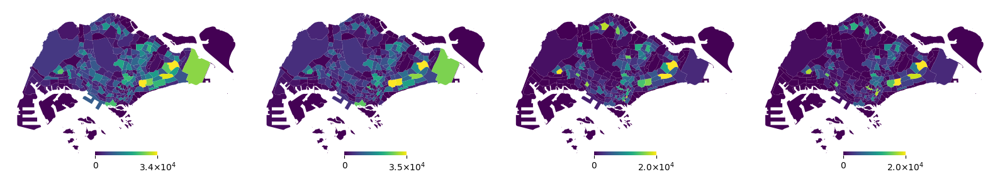

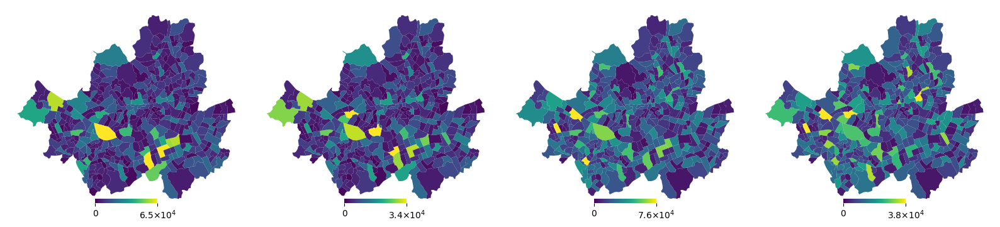

In [ ]:
import math
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ======================================================
# Helpers
# ======================================================
def _sci_notation(x, prec=1):
    if x is None or pd.isna(x) or x <= 0:
        return "0"
    exp = int(math.floor(math.log10(abs(x))))
    mant = x / (10 ** exp)
    return rf"{mant:.{prec}f}×10$^{exp}$"


def prep_origin_generation(df_space: pd.DataFrame) -> pd.DataFrame:
    out = df_space[["ORIGIN_SUBZONE", "COUNT"]].copy()
    out["COUNT"] = out.groupby("ORIGIN_SUBZONE")["COUNT"].transform("sum")
    out.drop_duplicates(inplace=True)
    return out


# ======================================================
# Plot one subzone map into an axis (SEPARATE colormap)
# ======================================================
def plot_subzone_ax(
    ax,
    dfz: pd.DataFrame,
    *,
    shp_path: str,
    id_col: str = "SUBZONE_C",
    df_id_col: str = "ORIGIN_SUBZONE",
    df_value_col: str = "COUNT",
    cmap_name: str = "viridis",
    q_clip: float = 0.995,
):
    gdf = gpd.read_file(shp_path)

    # Map values
    mapping = dfz.set_index(df_id_col)[df_value_col].to_dict()

    # Coerce keys if needed
    if pd.api.types.is_numeric_dtype(gdf[id_col]):
        try:
            mapping = {int(k): v for k, v in mapping.items()}
        except Exception:
            pass

    gdf["VAL"] = gdf[id_col].map(mapping).fillna(0.0)

    # ----------------------------------
    # Robust color scaling (per panel)
    # ----------------------------------
    vals = gdf["VAL"].to_numpy()
    vmax = np.quantile(vals[vals > 0], q_clip) if np.any(vals > 0) else 1.0
    vmax = max(vmax, 1.0)

    norm = Normalize(vmin=0, vmax=vmax)
    cmap = cm.get_cmap(cmap_name)

    ax.set_axis_off()
    gdf.plot(
        column="VAL",
        cmap=cmap,
        norm=norm,
        ax=ax,
        edgecolor="none",
        linewidth=0,
        alpha=1.0,
        antialiased=True,
    )

    # ----------------------------------
    # Inset colorbar (per panel)
    # ----------------------------------
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    cax = inset_axes(ax, width="26%", height="2.2%", loc="lower center", borderpad=0.6)
    cbar = plt.colorbar(sm, cax=cax, orientation="horizontal")

    cbar.set_ticks([0, vmax])
    cbar.set_ticklabels(["0", _sci_notation(vmax, prec=1)])

    for spine in cbar.ax.spines.values():
        spine.set_visible(False)


# ======================================================
# 1×4 GRID FOR ONE REGION
# ======================================================
def make_1x4_grid_for_region(
    *,
    reg: str,
    week_days=("mon", "sun"),
    modes=("VH", "WK"),
    cmap_name="viridis",
    fig_size=(16, 4.2),
    shp_path=None,
    q_clip=0.995,
):
    if shp_path is None:
        shp_path = path_od_data + f"data_{reg}_subzone.shp"

    fig, axes = plt.subplots(1, 4, figsize=fig_size)
    axes = np.asarray(axes).ravel()

    i = 0
    for mode in modes:
        for wd in week_days:
            df_space = pd.read_csv(
                path_od_result + f"prior_{reg}_trip_generation_{mode}_{wd}.csv"
            )
            dfz = prep_origin_generation(df_space)

            plot_subzone_ax(
                axes[i],
                dfz,
                shp_path=shp_path,
                cmap_name=cmap_name,
                q_clip=q_clip,
            )

            #axes[i].set_title(f"{reg.upper()} — {mode} — {wd}", fontsize=11, pad=4)
            i += 1

    fig.tight_layout()
    out_path = path_od_figure + f"prior_{reg}_origin_1x4_{cmap_name}_q995.png"
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()


# ======================================================
# RUN: Singapore + Seoul
# ======================================================
make_1x4_grid_for_region(
    reg="sgp",
    week_days=("mon", "sun"),
    modes=("VH", "WK"),
    cmap_name="viridis",
    shp_path=path_od_data + "data_sgp_subzone.shp",
    q_clip=0.995,
)

make_1x4_grid_for_region(
    reg="seoul",
    week_days=("mon", "sun"),
    modes=("VH", "WK"),
    cmap_name="viridis",
    shp_path=path_od_data + "data_seoul_subzone.shp",
    q_clip=0.995,
)


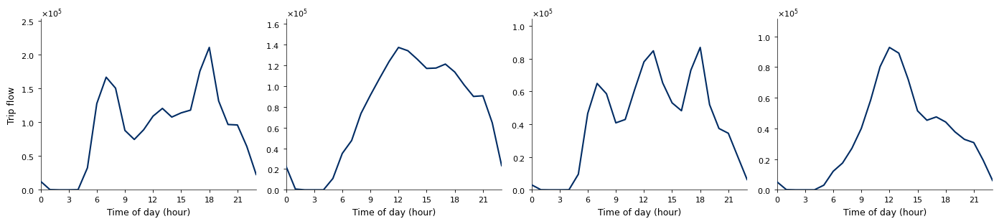

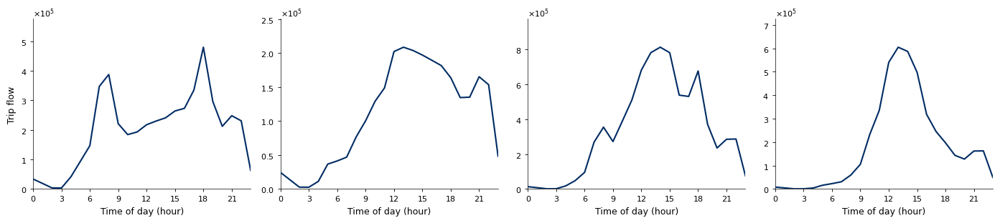

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, ScalarFormatter

# ======================================================
# Settings
# ======================================================
colors = ["crimson", "#002C64"]   # keep your palette (Estimated uses colors[1])
fig_x, fig_y = 3.5, 3.0
week_days = ["mon", "sun"]
modes = ["VH", "WK"]

# Paths must exist in your environment:
# path_od_result, path_od_figure


# ======================================================
# Plotter (draw into provided axis)
# ======================================================
def plot_departure_ax(ax, df_gen: pd.DataFrame, maxz: float):
    # Line (Estimated)
    ax.plot(
        df_gen["TRIP_STARTTIME"],
        df_gen["COUNT"],
        color=colors[1],
        marker=None,
        zorder=3,
        label="Estimated",
    )

    ax.set_ylim(0, maxz * 1.2)
    ax.set_xlim(0, 23)

    # Scientific notation
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((0, 0))
    ax.yaxis.set_major_formatter(formatter)

    # Clean style
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.tick_params(axis="both", which="major")

    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax.set_xlabel("Time of day (hour)")
    ax.set_ylabel("Trip flow")

    for spine in ax.spines.values():
        spine.set_linewidth(0.5)


# ======================================================
# 1x4 grid for one region
#   Columns: (VH, mon) (VH, sun) (WK, mon) (WK, sun)
#   Scale per panel OR shared per-grid via share_ymax=True
# ======================================================
def make_1x4_departure_grid(
    *,
    reg: str,
    week_days=("mon", "sun"),
    modes=("VH", "WK"),
    fig_size=(14, 3.2),
    share_ymax: bool = False,
):
    # ---- preload all panels (compute y_max if needed) ----
    panels = []
    ymax_global = 0.0

    for mode in modes:
        for wd in week_days:
            df_time = pd.read_csv(path_od_result + f"prior_{reg}_departure_time_{mode}_{wd}.csv")
            # ensure ordering and types
            df_time = df_time[["TRIP_STARTTIME", "COUNT"]].copy()
            df_time["TRIP_STARTTIME"] = df_time["TRIP_STARTTIME"].astype(int)

            panels.append((mode, wd, df_time))
            ymax_global = max(ymax_global, float(df_time["COUNT"].max()) if len(df_time) else 0.0)

    if ymax_global <= 0:
        ymax_global = 1.0

    # ---- plot grid ----
    fig, axes = plt.subplots(1, 4, figsize=fig_size)
    axes = np.asarray(axes).ravel()

    for i, (mode, wd, df_time) in enumerate(panels):
        ax = axes[i]
        maxz = ymax_global if share_ymax else float(df_time["COUNT"].max()) if len(df_time) else 1.0

        plot_departure_ax(ax, df_time, maxz=maxz)
        #ax.set_title(f"{reg.upper()} — {mode} — {wd}", fontsize=11, pad=4)

        # Clean grid labeling: only first panel keeps y-label
        if i != 0:
            ax.set_ylabel("")

    fig.tight_layout()
    out_path = path_od_figure + f"prior_{reg}_departure_time_1x4.png"
    fig.savefig(out_path, dpi=200, bbox_inches="tight")
    plt.show()


# ======================================================
# RUN: two separate 1x4 figures (Singapore + Seoul)
# ======================================================
make_1x4_departure_grid(
    reg="sgp",
    week_days=week_days,
    modes=modes,
    fig_size=(14, 3.2),
    share_ymax=False,   # set True if you want same y-scale across the 4 panels
)

make_1x4_departure_grid(
    reg="seoul",
    week_days=week_days,
    modes=modes,
    fig_size=(14, 3.2),
    share_ymax=False,
)


# SFig: Multiday, holiday

== week_days_4 ==
Period mon_4
Period tue_4
Period wed_4
Period thu_4
Period fri_4
Period sat_4
Period sun_4


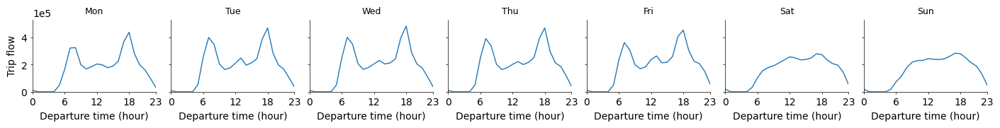

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PT_1x7_sgp_week_days_4.png


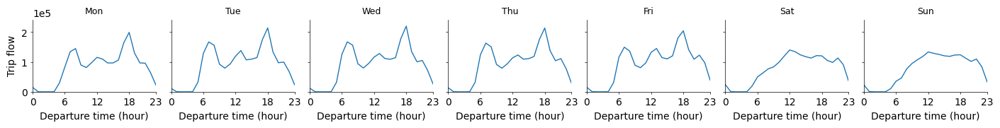

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PV_1x7_sgp_week_days_4.png
== week_days_11 ==
Period mon_11
Period tue_11
Period wed_11
Period thu_11
Period fri_11
Period sat_11
Period sun_11


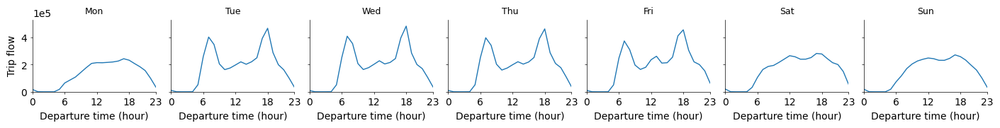

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PT_1x7_sgp_week_days_11.png


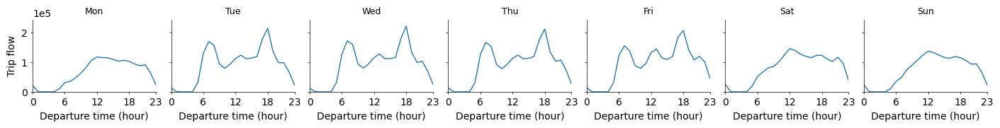

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PV_1x7_sgp_week_days_11.png
== week_days_18 ==
Period mon
Period tue
Period wed
Period thu
Period fri
Period sat
Period sun


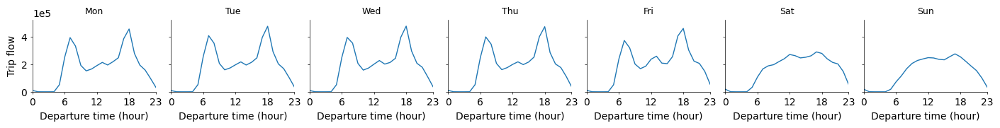

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PT_1x7_sgp_week_days_18.png


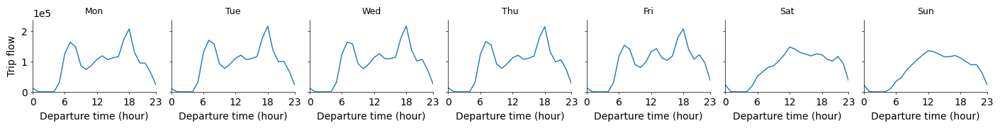

Saved: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/departure_PV_1x7_sgp_week_days_18.png
Done. All 6 figures saved to: /content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_gen_figure/


In [ ]:
# ============================================================
# FULL CODE: Create + SAVE 6 separate figures (each 1×7 grid)
#   - 3 figures: Transit (smart-card PT) for week_days_4/11/18
#   - 3 figures: Private vehicle (VH) inferred from smart-card using YOUR code:
#       * survey_df from HTS: VH vs PT
#       * EST_COUNT_ALL = COUNT_SC / smooth(PT/VH)
#       * scale to trip_total = sum(COUNT_SC) * global_ratio
#
# Saves (same naming convention as before):
#   - departure_PT_1x7_{reg}_{week_tag}.png
#   - departure_PV_1x7_{reg}_{week_tag}.png
# into: path_od_figure
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Plot settings
# -----------------------------
fig_x = 2
fig_y = 1.7
GRID_TITLES = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

# -----------------------------
# Paths / config (assumed already defined in your notebook)
# -----------------------------
# path_od_data   = ...
# path_od_figure = ...
# path_od_data_multiday_sc = ...
reg = "sgp"

path_od_data_multiday_sc = "/content/drive/MyDrive/Colab Notebooks/Workspace/od_matrix_generation/od_data_mutiday_smartcard/"

# Ensure output directory exists
os.makedirs(path_od_figure, exist_ok=True)

week_days_4  = ["mon_4",  "tue_4",  "wed_4",  "thu_4",  "fri_4",  "sat_4",  "sun_4"]
week_days_11 = ["mon_11", "tue_11", "wed_11", "thu_11", "fri_11", "sat_11", "sun_11"]
week_days_18 = ["mon",    "tue",    "wed",    "thu",    "fri",    "sat",    "sun"]

WEEK_CONFIGS = [
    ("week_days_4",  week_days_4,  path_od_data_multiday_sc),
    ("week_days_11", week_days_11, path_od_data_multiday_sc),
    ("week_days_18", week_days_18, path_od_data),
]

# Global scaling ratio (from your code)
global_ratio = 14976 / 30312


# ============================================================
# Your functions (kept as-is)
# ============================================================

def estimate_all_mode_via_smoothing(survey_df, smartcard_df, window=2):
    time_col = "TRIP_STARTTIME"
    all_col = "COUNT_ALL"
    pt_col = "COUNT_PT"
    sc_col = "COUNT_SC"

    df = survey_df[[time_col, all_col, pt_col]].copy()
    df["phi_obs"] = df[pt_col] / df[all_col]

    roll_len = 2 * window + 1
    df["phi_smooth"] = (
        df.sort_values(time_col)
          .set_index(time_col)["phi_obs"]
          .rolling(window=roll_len, center=True, min_periods=1)
          .mean()
          .reset_index(drop=True)
    )

    result = pd.merge(
        df[[time_col, "phi_obs", "phi_smooth"]],
        smartcard_df[[time_col, sc_col]],
        on=time_col,
        how="left"
    )

    result["EST_COUNT_ALL"] = result[sc_col] / result["phi_smooth"]
    return result


def plot_departure_line(df_, maxz):
    df_plot = df_.copy()
    fig, ax = plt.subplots(figsize=(fig_x, fig_y), constrained_layout=True)

    ax.plot(df_plot["TRIP_STARTTIME"], df_plot["COUNT"], linewidth=1.0)

    ax.set_ylim(0, maxz * 1.1)
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))

    ax.set_xlabel("Departure time (hour)")
    ax.set_ylabel("Trip flow")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", which="major")

    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", which="major", width=0.5)

    plt.show()


# ============================================================
# Helper: build a 1×7 grid from a list of 7 DataFrames, and SAVE
# ============================================================

def save_1x7_grid(dfs_7, fig_title, out_path):
    """
    dfs_7: list of 7 DataFrames, each has columns [TRIP_STARTTIME, COUNT]
    """
    fig, axes = plt.subplots(
        1, 7,
        figsize=(7 * fig_x, fig_y),
        constrained_layout=True,
        sharey=True
    )

    # common y limit
    maxz = 0.0
    for df in dfs_7:
        if not df.empty:
            maxz = max(maxz, float(df["COUNT"].max()))
    if maxz <= 0:
        maxz = 1.0

    for i, ax in enumerate(axes):
        dfp = dfs_7[i]

        ax.plot(dfp["TRIP_STARTTIME"], dfp["COUNT"], linewidth=1.0)

        ax.set_ylim(0, maxz * 1.1)
        ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
        ax.set_xlim(0, 23)
        ax.set_xticks([0, 6, 12, 18, 23])

        ax.set_title(GRID_TITLES[i], fontsize=9)

        # clean style
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)
        ax.tick_params(axis="both", which="major", width=0.5, length=2)

        ax.set_xlabel("Departure time (hour)")
        if i == 0:
            ax.set_ylabel("Trip flow")
        else:
            ax.set_ylabel("")

    #fig.suptitle(fig_title, y=1.05, fontsize=10)

    fig.savefig(out_path, dpi=180, bbox_inches="tight", facecolor="white")
    plt.show()
    print(f"Saved: {out_path}")


# ============================================================
# MAIN: create 6 figures (3 PT + 3 PV) using YOUR loop logic
# ============================================================

# Load HTS once
df_hts = pd.read_csv(path_od_data + f"data_{reg}_hts_2022_period.csv")
df_hts["COUNT"] = 1

# Build survey_df ONCE (same for all weeks; exactly as your code)
df1_ = df_hts[df_hts["TRAVEL_MODE"] == "VH"][["TRIP_STARTTIME", "COUNT"]]
df1_["COUNT"] = df1_.groupby(["TRIP_STARTTIME"])["COUNT"].transform("sum")
df1_.drop_duplicates(inplace=True)
df1_.sort_values("TRIP_STARTTIME", inplace=True)
df1_.rename(columns={"COUNT": "COUNT_ALL"}, inplace=True)

df2_ = df_hts[df_hts["TRAVEL_MODE"] == "PT"][["TRIP_STARTTIME", "COUNT"]]
df2_["COUNT"] = df2_.groupby(["TRIP_STARTTIME"])["COUNT"].transform("sum")
df2_.drop_duplicates(inplace=True)
df2_.sort_values("TRIP_STARTTIME", inplace=True)
df2_.rename(columns={"COUNT": "COUNT_PT"}, inplace=True)

survey_df = pd.merge(df1_, df2_, on="TRIP_STARTTIME")


# For each week_tag -> build 7-day lists and save 2 grids
for week_tag, week_days, path_od_data_sc in WEEK_CONFIGS:

    print(f"== {week_tag} ==")

    pt_list = []
    pv_list = []

    for week_day in week_days:
        print(f"Period {week_day}")

        # Smart-card PT hourly (exactly as your code)
        df_sc = pd.read_csv(
            path_od_data_sc + f"data_{reg}_sc_2022_period_{week_day}.csv"
        )
        df_sc = df_sc[["TRIP_STARTTIME", "COUNT"]]
        df_sc["COUNT"] = df_sc.groupby(["TRIP_STARTTIME"])["COUNT"].transform("sum")
        df_sc.drop_duplicates(inplace=True)
        df_sc.sort_values("TRIP_STARTTIME", inplace=True)
        df_sc.rename(columns={"COUNT": "COUNT_SC"}, inplace=True)

        # Transit curve for plotting (rename to COUNT)
        df_pt = df_sc.rename(columns={"COUNT_SC": "COUNT"})[["TRIP_STARTTIME", "COUNT"]]
        pt_list.append(df_pt)

        # Private vehicle inference (exactly as your code)
        df_vh = estimate_all_mode_via_smoothing(survey_df, df_sc, window=2)
        df_vh.rename(columns={"EST_COUNT_ALL": "COUNT"}, inplace=True)
        df_vh = df_vh[["TRIP_STARTTIME", "COUNT"]]

        sc_total = float(df_sc["COUNT_SC"].sum())
        trip_total = sc_total * global_ratio

        denom = float(df_vh["COUNT"].sum())
        if denom > 0:
            df_vh["COUNT"] = df_vh["COUNT"] * (trip_total / denom)

        pv_list.append(df_vh)

    # Save the 2 grids for this week_tag (exact filename convention)
    out_pt = os.path.join(path_od_figure, f"departure_PT_1x7_{reg}_{week_tag}.png")
    save_1x7_grid(
        dfs_7=pt_list,
        fig_title=f"{reg.upper()} | {week_tag} | Transit (smart-card PT)",
        out_path=out_pt
    )

    out_pv = os.path.join(path_od_figure, f"departure_PV_1x7_{reg}_{week_tag}.png")
    save_1x7_grid(
        dfs_7=pv_list,
        fig_title=f"{reg.upper()} | {week_tag} | Private vehicle (inferred)",
        out_path=out_pv
    )

print("Done. All 6 figures saved to:", path_od_figure)


#STable: Robustness to cross-modal ratio learning

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score

KEY_COLS = ["ORIGIN_SUBZONE", "DESTINATION_SUBZONE", "TRIP_STARTTIME"]
MIN_COUNT = 1


def aggregate_counts(df: pd.DataFrame, key_cols: list[str], count_col: str = "COUNT") -> pd.DataFrame:
    out = df[key_cols + [count_col]].copy()
    out[count_col] = out.groupby(key_cols)[count_col].transform("sum")
    return out.drop_duplicates().rename(columns={count_col: "COUNT"})


def round_and_threshold(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    # out["COUNT"] = np.round(out["COUNT"])  # keep commented if you don't want rounding
    return out[out["COUNT"] >= min_count].copy()


def compute_cpc_r2_od_time(true_df: pd.DataFrame, pred_df: pd.DataFrame, key_cols=KEY_COLS) -> tuple[float, float]:
    """
    CPC and R2 on matched OD-time cells.
    - Inner-join on key_cols (same behavior as your scatter uses after merging).
    - CPC = 2 * sum(min(y_true, y_pred)) / (sum(y_true) + sum(y_pred))
    """
    t = true_df[key_cols + ["COUNT"]].copy()
    p = pred_df[key_cols + ["COUNT"]].copy()

    m = t.merge(p, on=key_cols, suffixes=("_true", "_pred"))
    if len(m) == 0:
        return float("nan"), float("nan")

    y_true = m["COUNT_true"].to_numpy(float)
    y_pred = m["COUNT_pred"].to_numpy(float)

    denom = y_true.sum() + y_pred.sum()
    cpc = (2.0 * np.minimum(y_true, y_pred).sum() / denom) if denom > 0 else float("nan")

    # Guard against degenerate R2
    if len(y_true) < 2 or np.allclose(y_true, y_true[0]):
        r2 = float("nan")
    else:
        r2 = float(r2_score(y_true, y_pred))

    return float(cpc), float(r2)


# ----------------------------
# LOAD + PREP (SGP)
# ----------------------------
k = '1.0'
# xgb:xgboost, rf:random forest, nn: neural nets (mlp), poly: polynomial regression
for MODEL in ['xgb', 'rf', 'nn', 'poly']:
    print('MODEL ', MODEL)
    SGP_REGION = "sgp"
    SGP_DAY_GROUP = "mon_wed"

    sgp_true_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_tomtom_{SGP_DAY_GROUP}.csv")
    sgp_pred_raw = pd.read_csv(path_od_result + f"case_{SGP_REGION}_matrix_1.0_{k}_{SGP_DAY_GROUP}_{MODEL}.csv")

    sgp_true = sgp_true_raw[KEY_COLS + ["COUNT"]].copy()
    sgp_true = round_and_threshold(aggregate_counts(sgp_true, KEY_COLS), min_count=MIN_COUNT)

    # pred uses VH_COUNT -> COUNT (your original logic)
    sgp_pred = sgp_pred_raw[KEY_COLS + ["VH_COUNT"]].copy()
    sgp_pred = sgp_pred[sgp_pred["VH_COUNT"] > 0].copy()
    sgp_pred["COUNT"] = sgp_pred["VH_COUNT"]
    sgp_pred = sgp_pred[KEY_COLS + ["COUNT"]]
    # keep only OD-time cells that exist in true (same as your code)
    sgp_pred = sgp_pred.merge(sgp_true[KEY_COLS].drop_duplicates(), on=KEY_COLS, how="inner")
    sgp_pred = round_and_threshold(aggregate_counts(sgp_pred, KEY_COLS), min_count=MIN_COUNT)

    cpc_sgp, r2_sgp = compute_cpc_r2_od_time(sgp_true, sgp_pred)
    print(f"[SGP | OD-time] CPC = {cpc_sgp:.4f}, R2 = {r2_sgp:.4f}")


    # ----------------------------
    # LOAD + PREP (SEOUL)
    # ----------------------------
    SEOUL_REGION = "seoul"
    SEOUL_DAY = "mon"

    seoul_true_raw = pd.read_csv(path_od_result + f"case_{SEOUL_REGION}_matrix_cellular.csv")
    seoul_pred_raw = pd.read_csv(path_od_result + f"case_{SEOUL_REGION}_matrix_1.0_{k}_{SEOUL_DAY}_{MODEL}.csv")

    seoul_true = round_and_threshold(aggregate_counts(seoul_true_raw[KEY_COLS + ["COUNT"]], KEY_COLS), min_count=MIN_COUNT)
    seoul_pred = round_and_threshold(aggregate_counts(seoul_pred_raw[KEY_COLS + ["COUNT"]], KEY_COLS), min_count=MIN_COUNT)

    cpc_seoul, r2_seoul = compute_cpc_r2_od_time(seoul_true, seoul_pred)
    print(f"[SEOUL | OD-time] CPC = {cpc_seoul:.4f}, R2 = {r2_seoul:.4f}")


MODEL  xgb
[SGP | OD-time] CPC = 0.7159, R2 = 0.6221
[SEOUL | OD-time] CPC = 0.7074, R2 = 0.6707
MODEL  rf
[SGP | OD-time] CPC = 0.7150, R2 = 0.6151
[SEOUL | OD-time] CPC = 0.7013, R2 = 0.6334
MODEL  nn
[SGP | OD-time] CPC = 0.7178, R2 = 0.6253
[SEOUL | OD-time] CPC = 0.7005, R2 = 0.6219
MODEL  tf
[SGP | OD-time] CPC = 0.7167, R2 = 0.6235
[SEOUL | OD-time] CPC = 0.6973, R2 = 0.6519
MODEL  poly
[SGP | OD-time] CPC = 0.7149, R2 = 0.6348
[SEOUL | OD-time] CPC = 0.7093, R2 = 0.6056


#SFig: LLM baseline

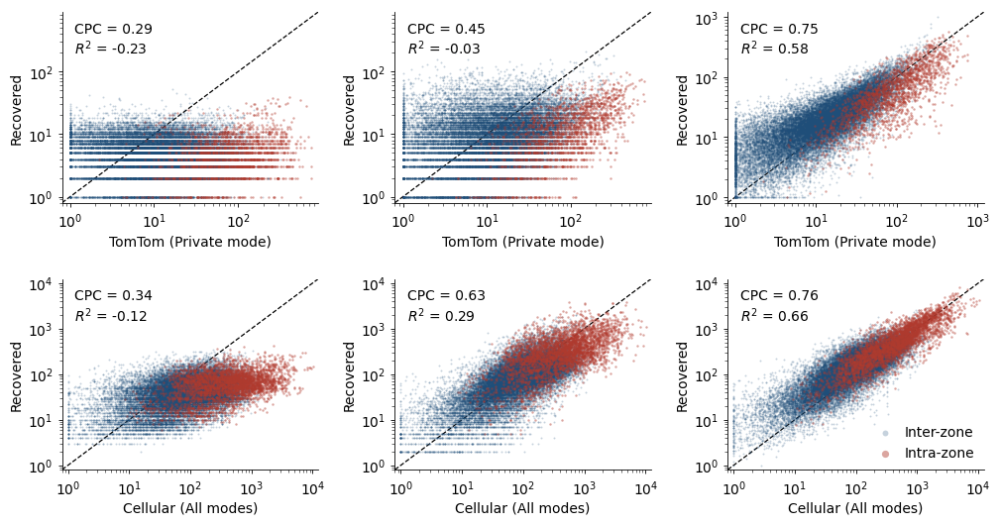

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from sklearn.metrics import r2_score

# ── Colours ───────────────────────────────────────────────────────────────────
COLORS = {
    "intra": "#B03A2E",   # muted brick red
    "inter": "#1F4E79",   # deep desaturated blue
}


def round_and_threshold1(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    for col in ["TOMTOM_FLOW", "GEN_FLOW"]:
        out[col] = np.where(out[col] < 1, np.round(out[col]), out[col])
    return out

def round_and_threshold2(df: pd.DataFrame, min_count: float = 1.0) -> pd.DataFrame:
    out = df.copy()
    for col in ["CELL_FLOW", "GEN_FLOW"]:
        out[col] = np.where(out[col] < 1, np.round(out[col]), out[col])
    return out

# ── Metrics ───────────────────────────────────────────────────────────────────
def compute_cpc(y_true, y_pred):
    denom = y_pred.sum() + y_true.sum()
    return (2.0 * np.minimum(y_pred, y_true).sum() / denom) if denom > 0 else np.nan

# ── Panel plotter ─────────────────────────────────────────────────────────────
def plot_scatter_panel(ax, x_vals, y_vals, origin, destination, x_label, y_label, title, show_legend=False):
    """
    Parameters
    ----------
    x_vals, y_vals   : arrays of flow values (reference vs predicted)
    origin           : array of origin zone IDs (same length as x_vals/y_vals)
    destination      : array of destination zone IDs
    """
    is_intra = origin == destination

    # ── intra / inter scatter ────────────────────────────────────────────────
    ax.scatter(
        x_vals[~is_intra], y_vals[~is_intra],
        s=2, alpha=0.25, color=COLORS["inter"], linewidths=0,
        label="Inter-zone", zorder=1,
    )
    ax.scatter(
        x_vals[is_intra], y_vals[is_intra],
        s=3, alpha=0.45, color=COLORS["intra"], linewidths=0,
        label="Intra-zone", zorder=2,
    )

    # ── 45° reference line ───────────────────────────────────────────────────
    valid = (x_vals > 0) & (y_vals > 0)
    vmin  = min(x_vals[valid].min(), y_vals[valid].min()) * 0.8
    vmax  = max(x_vals[valid].max(), y_vals[valid].max()) * 1.2
    ax.plot([vmin, vmax], [vmin, vmax],
            linestyle="--", color="black", linewidth=0.9, zorder=0)

    # ── log scale ────────────────────────────────────────────────────────────
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.xaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.yaxis.set_major_formatter(mticker.LogFormatterMathtext())
    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)

    # ── metrics ──────────────────────────────────────────────────────────────
    cpc = compute_cpc(x_vals, y_vals)
    r2  = r2_score(x_vals, y_vals) if len(x_vals) > 1 else np.nan

    ax.text(
        0.05, 0.95,
        f"CPC = {cpc:.2f}\n$R^2$ = {r2:.2f}",
        transform=ax.transAxes,
        ha="left", va="top", fontsize=10,
    )

    if show_legend:
        ax.legend(
            loc="lower right",
            frameon=False,
            fontsize=10,
            markerscale=3.0,
            handletextpad=0.4,
            borderpad=0.2,
        )

    # ── labels / spine / ticks ───────────────────────────────────────────────
    ax.set_xlabel(x_label, labelpad=3)
    ax.set_ylabel(y_label, labelpad=3)
    #ax.set_title(title, fontsize=11, fontweight="bold", pad=6)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.6)
    ax.spines["bottom"].set_linewidth(0.6)
    ax.tick_params(axis="both", which="major", width=0.6, length=3)
    ax.tick_params(axis="both", which="minor", width=0.4, length=2)


# ── Prepare arrays (SGP) ─────────────────────────────────────────────────────

sgp_llm_df           = pd.read_csv(path_od_result + "llm_sgp_vh_flow_mon_wed_with_transit.csv")
sgp_llm_notransit_df = pd.read_csv(path_od_result + "llm_sgp_vh_flow_mon_wed_no_transit.csv")
sgp_gen_df           = pd.read_csv(path_od_result + 'case_sgp_matrix_1.0_1.0_mon_wed.csv')
sgp_tomtom_df        = pd.read_csv(path_od_result + "case_sgp_matrix_tomtom_mon_wed.csv")

sgp_llm_df.drop(columns=['LU_H', 'LU_W', 'LU_O'], inplace=True)
sgp_llm_df.rename(columns={'PV_FLOW': 'LLM_FLOW'}, inplace=True)

sgp_llm_notransit_df.drop(columns=['LU_H', 'LU_W', 'LU_O'], inplace=True)
sgp_llm_notransit_df.rename(columns={'PV_FLOW': 'LLM_NOTRANSIT_FLOW'}, inplace=True)

sgp_gen_df = sgp_gen_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME', 'VH_COUNT']]
sgp_gen_df.rename(columns={'VH_COUNT': 'GEN_FLOW'}, inplace=True)

sgp_tomtom_df = sgp_tomtom_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME', 'COUNT']]
sgp_tomtom_df.rename(columns={'COUNT': 'TOMTOM_FLOW'}, inplace=True)

merge_keys = ['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME']
sgp_llm_df = sgp_llm_df.merge(sgp_llm_notransit_df[merge_keys + ['LLM_NOTRANSIT_FLOW']], on=merge_keys, how='left')
sgp_llm_df = sgp_llm_df.merge(sgp_gen_df, on=merge_keys, how='left')
sgp_llm_df = sgp_llm_df.merge(sgp_tomtom_df, on=merge_keys, how='left')
sgp_llm_df.fillna(0, inplace=True)

sgp_df    = round_and_threshold1(sgp_llm_df)
sgp_mask  = (sgp_df["TOMTOM_FLOW"] > 0) & (sgp_df["LLM_FLOW"] > 0) & (sgp_df["GEN_FLOW"] > 0) & (sgp_df["LLM_NOTRANSIT_FLOW"] > 0)
sgp_dplot = sgp_df[sgp_mask].copy()

sgp_origin      = sgp_dplot["ORIGIN_SUBZONE"].to_numpy()
sgp_destination = sgp_dplot["DESTINATION_SUBZONE"].to_numpy()
sgp_tomtom        = sgp_dplot["TOMTOM_FLOW"].to_numpy(float)
sgp_llm           = sgp_dplot["LLM_FLOW"].to_numpy(float)
sgp_llm_notransit = sgp_dplot["LLM_NOTRANSIT_FLOW"].to_numpy(float)
sgp_gen           = sgp_dplot["GEN_FLOW"].to_numpy(float)

# ── Prepare arrays (Seoul) ────────────────────────────────────────────────────

seoul_llm_df           = pd.read_csv(path_od_result + "llm_seoul_allmode_flow_mon_with_transit.csv")
seoul_llm_notransit_df = pd.read_csv(path_od_result + "llm_seoul_allmode_flow_mon_no_transit.csv")
seoul_gen_df           = pd.read_csv(path_od_result + 'case_seoul_matrix_1.0_1.0_mon.csv')
seoul_cellular_df      = pd.read_csv(path_od_result + "case_seoul_matrix_cellular.csv")

seoul_llm_df.drop(columns=['LU_H', 'LU_W', 'LU_O'], inplace=True)
seoul_llm_df.rename(columns={'ALL_FLOW': 'LLM_FLOW'}, inplace=True)

seoul_llm_notransit_df.drop(columns=['LU_H', 'LU_W', 'LU_O'], inplace=True)
seoul_llm_notransit_df.rename(columns={'ALL_FLOW': 'LLM_NOTRANSIT_FLOW'}, inplace=True)

seoul_gen_df = seoul_gen_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME', 'COUNT']]
seoul_gen_df.rename(columns={'COUNT': 'GEN_FLOW'}, inplace=True)

seoul_cellular_df = seoul_cellular_df[['ORIGIN_SUBZONE', 'DESTINATION_SUBZONE', 'TRIP_STARTTIME', 'COUNT']]
seoul_cellular_df.rename(columns={'COUNT': 'CELL_FLOW'}, inplace=True)

seoul_llm_df = seoul_llm_df.merge(seoul_llm_notransit_df[merge_keys + ['LLM_NOTRANSIT_FLOW']], on=merge_keys, how='left')
seoul_llm_df = seoul_llm_df.merge(seoul_gen_df, on=merge_keys, how='left')
seoul_llm_df = seoul_llm_df.merge(seoul_cellular_df, on=merge_keys, how='left')
seoul_llm_df.fillna(0, inplace=True)

seoul_df    = round_and_threshold2(seoul_llm_df)
seoul_mask  = (seoul_df["CELL_FLOW"] > 0) & (seoul_df["LLM_FLOW"] > 0) & (seoul_df["GEN_FLOW"] > 0) & (seoul_df["LLM_NOTRANSIT_FLOW"] > 0)
seoul_dplot = seoul_df[seoul_mask].copy()

seoul_origin      = seoul_dplot["ORIGIN_SUBZONE"].to_numpy()
seoul_destination = seoul_dplot["DESTINATION_SUBZONE"].to_numpy()
seoul_cellular        = seoul_dplot["CELL_FLOW"].to_numpy(float)
seoul_llm             = seoul_dplot["LLM_FLOW"].to_numpy(float)
seoul_llm_notransit   = seoul_dplot["LLM_NOTRANSIT_FLOW"].to_numpy(float)
seoul_gen             = seoul_dplot["GEN_FLOW"].to_numpy(float)

# ── Figure (2 × 3) ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(12, 6))
fig.subplots_adjust(wspace=0.30, hspace=0.40)

# Row 1: SGP
plot_scatter_panel(
    axes[0, 0],
    x_vals=sgp_tomtom, y_vals=sgp_llm_notransit,
    origin=sgp_origin, destination=sgp_destination,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    title="SGP — LLM (No transit) vs TomTom",
)
plot_scatter_panel(
    axes[0, 1],
    x_vals=sgp_tomtom, y_vals=sgp_llm,
    origin=sgp_origin, destination=sgp_destination,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    title="SGP — LLM (w/ Transit) vs TomTom",
)
plot_scatter_panel(
    axes[0, 2],
    x_vals=sgp_tomtom, y_vals=sgp_gen,
    origin=sgp_origin, destination=sgp_destination,
    x_label="TomTom (Private mode)",
    y_label="Recovered",
    title="SGP — Recovered vs TomTom",
)

# Row 2: Seoul
plot_scatter_panel(
    axes[1, 0],
    x_vals=seoul_cellular, y_vals=seoul_llm_notransit,
    origin=seoul_origin, destination=seoul_destination,
    x_label="Cellular (All modes)",
    y_label="Recovered",
    title="Seoul — LLM (No Transit) vs Cellular",
)
plot_scatter_panel(
    axes[1, 1],
    x_vals=seoul_cellular, y_vals=seoul_llm,
    origin=seoul_origin, destination=seoul_destination,
    x_label="Cellular (All modes)",
    y_label="Recovered",
    title="Seoul — LLM (w/ Transit) vs Cellular",
)
plot_scatter_panel(
    axes[1, 2],
    x_vals=seoul_cellular, y_vals=seoul_gen,
    origin=seoul_origin, destination=seoul_destination,
    x_label="Cellular (All modes)",
    y_label="Recovered",
    title="Seoul — Recovered vs Cellular",
    show_legend=True,
)

plt.savefig(path_od_figure + "llm_flow_scatter_log_sgp_seoul.png", dpi=200, bbox_inches="tight")
plt.show()